## Learning objectives
- Extract calibrated prediction intervals and interpret them alongside feature contributions;
- Use one-sided and two-sided intervals and probabilistic threshold explanations;
- Learn to normalize explanations with difficulty estimators (knn/variance).

## Time to run
~2–10 min depending on dataset and chosen CPS settings (reduce `num_to_test` for a quick demo).


# Calibrated explanations: conformal regression intervals

This notebook aligns with the README and [regression quickstart](../docs/get-started/quickstart_regression.md). You will:

- fit and calibrate a regression explainer while keeping telemetry optional,
- retrieve calibrated prediction intervals alongside probabilistic threshold checks, and
- generate calibrated alternatives and read them with the triangular plot walkthrough shared across the docs.

For deeper theory, consult the [probabilistic regression concept guide](../docs/concepts/probabilistic_regression.md) and cite the work using [docs/citing.md](../docs/citing.md). Optional fast explanations remain in the [external plugins](../docs/external_plugins/index.md) lane and are not loaded here.


### 1. Import packages, data and train an underlying model

#### 1.1 Import packages

In the examples below, we will be using `NumPy`, `pandas`, `sklearn`, and `crepes`. From `crepes`, we import `ConformalPredictiveSystem` and some helper functions from `crepes.extras`. `WrapCalibratedExplainer` is imported from `calibrated_explanations`.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings

import numpy as np
import pandas as pd
from crepes import ConformalPredictiveSystem
from crepes.extras import DifficultyEstimator
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

from calibrated_explanations import WrapCalibratedExplainer, __version__

warnings.filterwarnings("ignore", category=UserWarning)

print(f"calibrated_explanations {__version__}")

calibrated_explanations v0.11.1


#### 1.2 Import data and train a model
Let us import the California Housing data set (see sources at the top).

In [3]:
dataset = "housing.csv"
delimiter = ";"
categorical_labels = {8: {0: "INLAND", 1: "NEAR BAY", 2: "<1H OCEAN", 3: "NEAR OCEAN", 4: "ISLAND"}}

filename = "../../data/reg/" + dataset
df = pd.read_csv(filename, delimiter=delimiter, dtype=np.float64)
target = "median_house_value"
df.dropna(inplace=True)
X, y = df.drop(target, axis=1), df[target]
feature_names = df.drop(target, axis=1).columns
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,1.0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,1.0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,1.0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,1.0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,1.0


Let us split the data set into a training and a test set, and further split the training set into a proper training set and a calibration set. Let us fit a random forest to the proper training set. We also set a random seed to be able to rerun the notebook and get the same results.

In [4]:
num_to_test = 5

x_train, x_test, y_train, y_test = train_test_split(
    X.values, y.values, test_size=num_to_test, random_state=42
)
X_prop_train, x_cal, y_prop_train, y_cal = train_test_split(
    x_train, y_train, test_size=0.33, random_state=42
)

model = RandomForestRegressor(n_estimators=100, oob_score=True)

model.fit(X_prop_train, y_prop_train)

len(X_prop_train), len(x_cal), len(x_test)

(13686, 6742, 5)

Before extracting an explanation, lets see what the output from a Conformal Predictive System (cps) is for the test instance(s). Three use cases are explored:
1. using percentiles to get the lower and upper bounds of an interval.
2. using the 50th percentile(s) to get the median prediction which can be used as a calibrated prediction from the underlying model.
3. getting the probability of the prediction being below a certain threshold. 250 000 is used as threshold, as it is close to the midpoint in the possible range of prices.

In [5]:
y_cal_pred = model.predict(x_cal)
y_test_pred = model.predict(x_test)

cps = ConformalPredictiveSystem()
cps.fit(residuals=y_cal - y_cal_pred)

interval = cps.predict(y_hat=y_test_pred, lower_percentiles=[5, 50], higher_percentiles=[95, 50])

p_values = cps.predict(y_hat=y_test_pred, y=250000)

print(
    "5th percentile, prediction, 50th percentile, 95th percentile, true value, p-value (cpsd<250000)"
)
print(
    *zip(
        np.round(interval[:, 0], decimals=1),
        np.round(y_test_pred, decimals=1),
        np.round((interval[:, 1] + interval[:, 3]) / 2, decimals=1),
        np.round(interval[:, 2], decimals=1),
        np.round(y_test, decimals=1),
        np.round(p_values * 100, decimals=1), strict=False,
    ),
    sep="\n",
)

5th percentile, prediction, 50th percentile, 95th percentile, true value, p-value (cpsd<250000)
(np.float64(140733.0), np.float64(208159.0), np.float64(203743.5), np.float64(292262.0), np.float64(245800.0), np.float64(87.7))
(np.float64(99233.0), np.float64(166659.0), np.float64(162243.5), np.float64(250762.0), np.float64(137900.0), np.float64(95.0))
(np.float64(130469.0), np.float64(197895.0), np.float64(193479.5), np.float64(281998.0), np.float64(218200.0), np.float64(90.4))
(np.float64(73166.0), np.float64(140592.0), np.float64(136176.5), np.float64(224695.0), np.float64(220800.0), np.float64(96.9))
(np.float64(98765.0), np.float64(166191.0), np.float64(161775.5), np.float64(250294.0), np.float64(170500.0), np.float64(95.0))


Create the `WrapCalibratedExplainer` by feeding the model, the calibration set, and mode='regression' as a minimum. 

In [6]:
ce = WrapCalibratedExplainer(model)
ce.calibrate(x_cal, y_cal, feature_names=feature_names, categorical_labels=categorical_labels, mode="regression")
display(ce)

WrapCalibratedExplainer(learner=RandomForestRegressor(oob_score=True), fitted=True, calibrated=True, 
		explainer=CalibratedExplainer(mode=regression, learner=RandomForestRegressor(oob_score=True), difficulty_estimator=None))

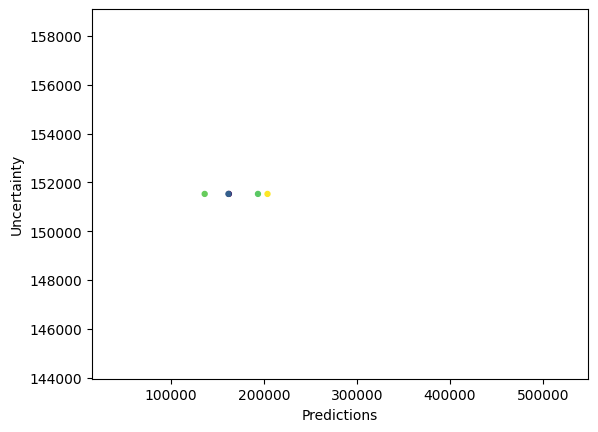

In [7]:
ce.plot(x_test, y_test, style="triangular")

In the examples below, all intervals will be with 90% certainty and can be either two-sided or one-sided. The intervals are defined by assigning a pair of values to the `low_high_percentiles` attribute (see below).

In [8]:
tsi = (5, 95)  # two-sided interval with 90% confidence
osli = (10, np.inf)  # one-sided lower-bounded interval with 90% confidence
osui = (-np.inf, 90)  # one-sided upper-bounded interval with 90% confidence

#### Two-sided interval with 95% confidence
Since we are defining two-sided intervals, `low_high_percentiles=tsi`.

Once the explanations are extracted, we can visualize them using various plots. The regular plot include an uncertainty estimate for the prediction and the weights of the most influential features. The shaded area is the the prediction interval with 95% confidence. The solid line in the middle of the shaded interval is the median in the conformal predictive distribution.

Regular plots are shown by calling the function `plot`, with `filter_top` indicating the number of features to include (default 10), in order of importance. 

In [9]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=tsi)
display(ce)

WrapCalibratedExplainer(learner=RandomForestRegressor(oob_score=True), fitted=True, calibrated=True, 
		explainer=CalibratedExplainer(mode=regression, discretizer=BinaryRegressorDiscretizer(), learner=RandomForestRegressor(oob_score=True), difficulty_estimator=None))


Instance 0

Factual Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 203743.520
Prediction Interval: [140733.020, 292262.020]

Factors impacting the calibrated prediction positively:
population (525.0) <= 1121.50             — weight ≈ 23417.667 [-65100.833, 86428.167] [⚠️ direction uncertain]
ocean_proximity (NEAR OCEAN) = NEAR OCEAN — weight ≈ 16952.737 [-71565.763, 79963.237] [⚠️ direction uncertain]
latitude (32.79) <= 38.49                 — weight ≈ 11063.020 [-77455.480, 74073.520] [⚠️ direction uncertain]
households (254.0) <= 555.50              — weight ≈ 9848.667 [-78669.833, 72859.167] [⚠️ direction uncertain]

Factors impacting the calibrated prediction negatively:
longitude (-117.24) > -121.84             — weight ≈ -143670.247 [-232188.747, -80659.747]
median_income (3.18) <= 5.03              — weight ≈ -120023.780 [-208542.280, -57013.280]
housing_median_age (20.0) <= 51.50        — weight 

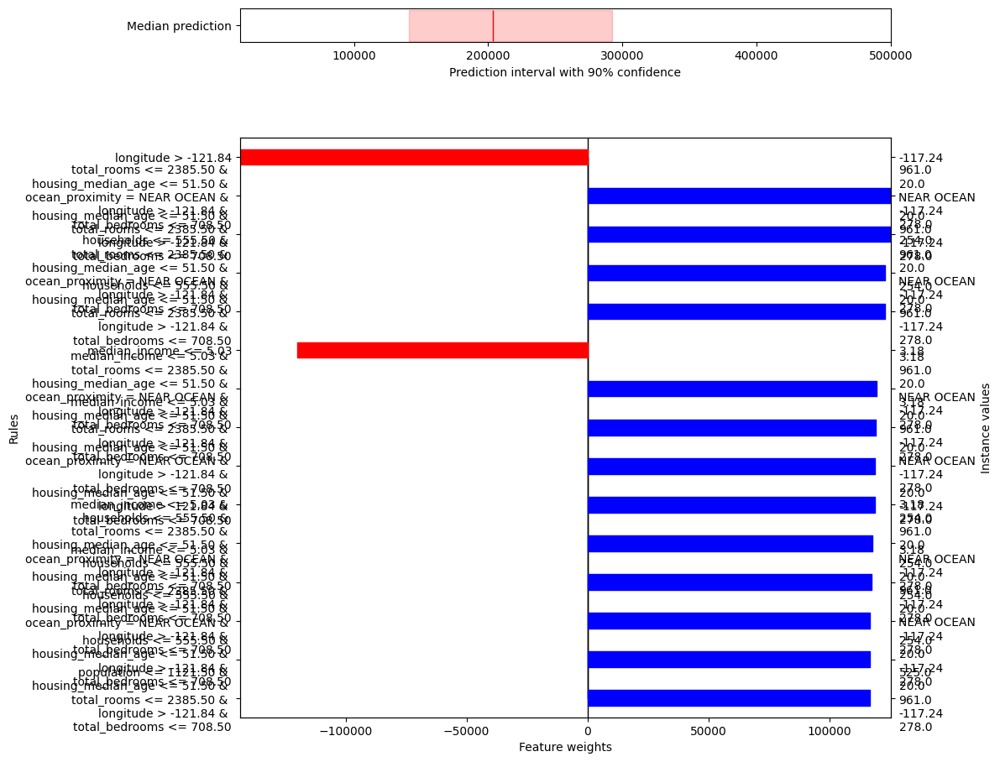

In [10]:
print(factual_explanation[0].remove_conjunctions().to_narrative(expertise_level="advanced", output_format="text"))
print(factual_explanation[0].add_conjunctions(max_rule_size=7).to_narrative(expertise_level="advanced", output_format="text"))
factual_explanation[0].add_conjunctions(max_rule_size=7).plot(filter_top=15)

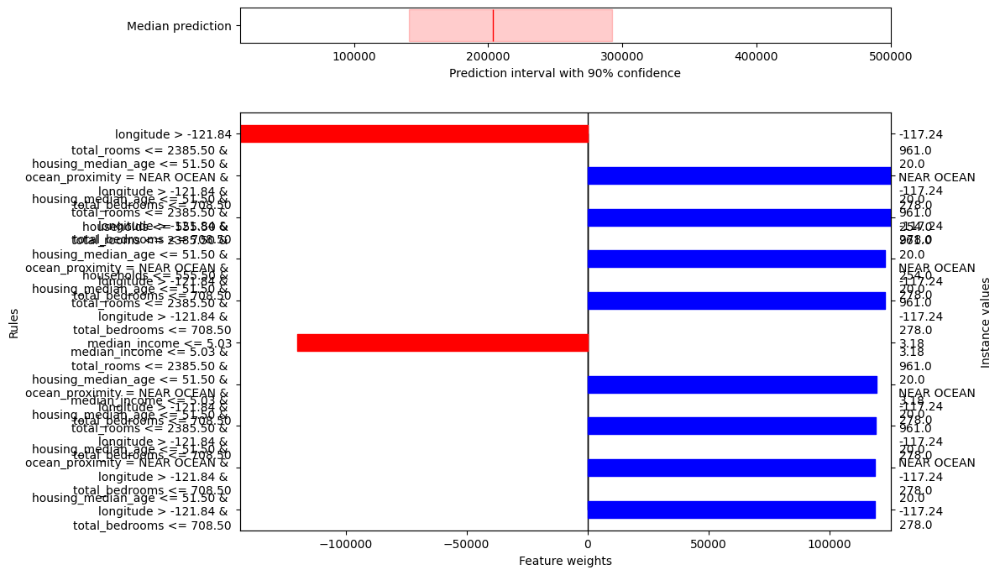

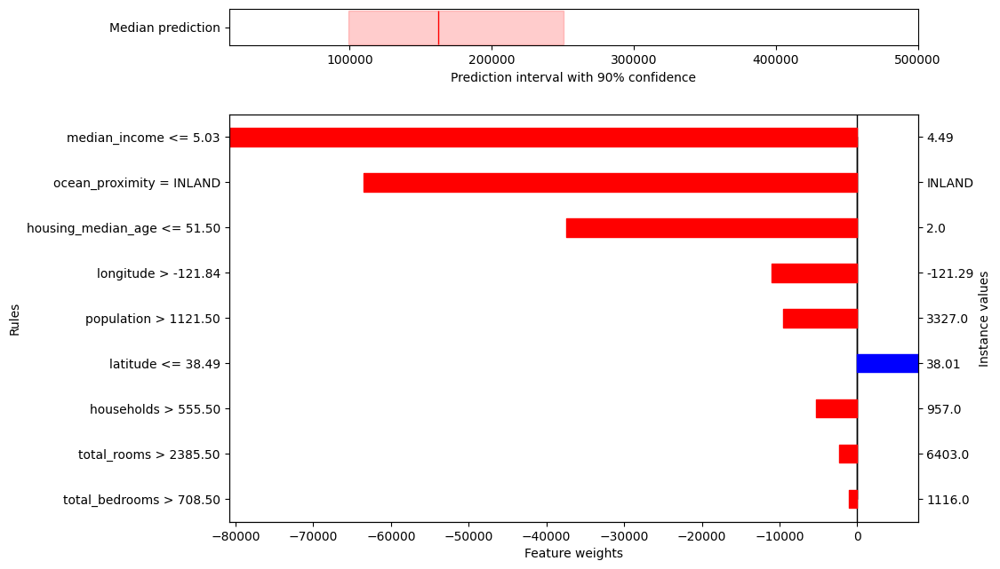

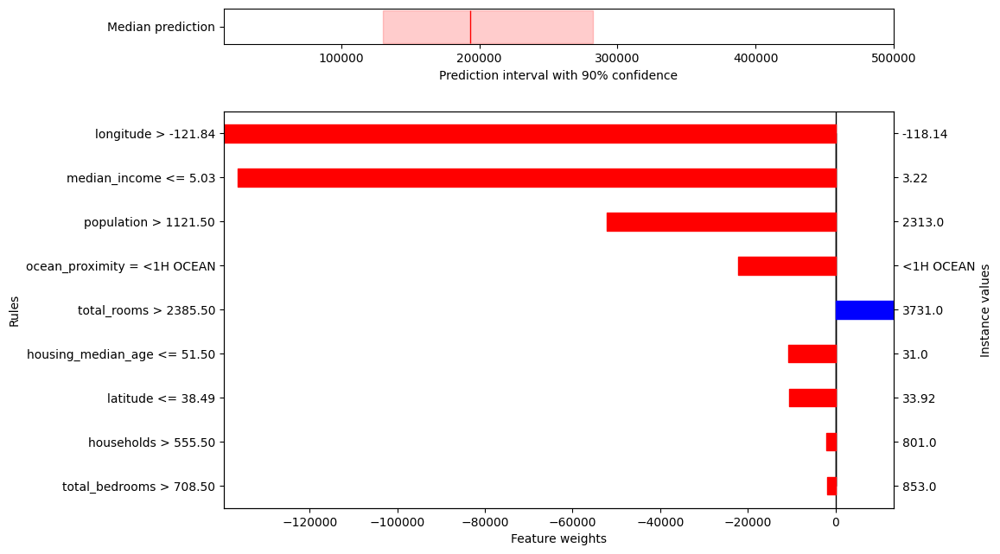

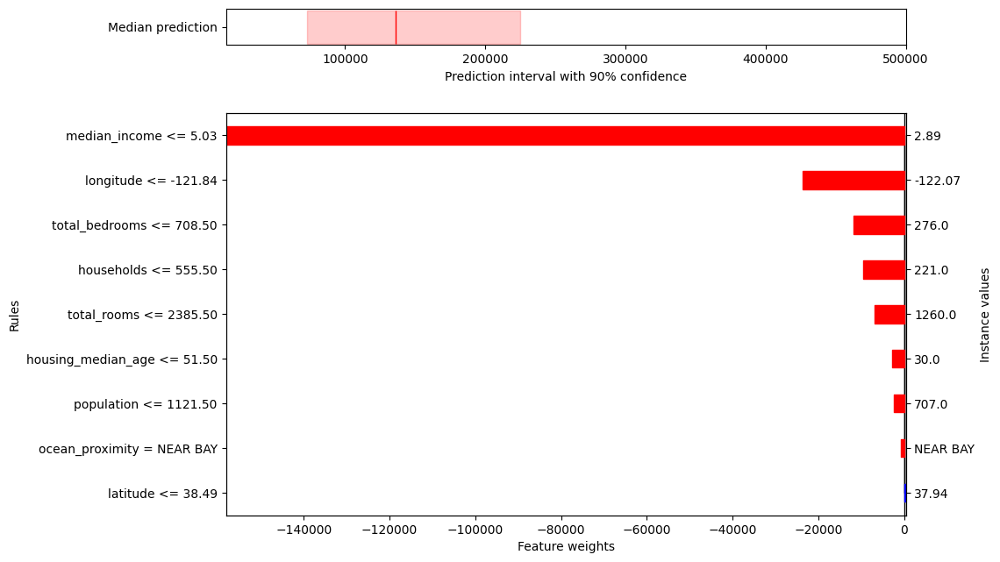

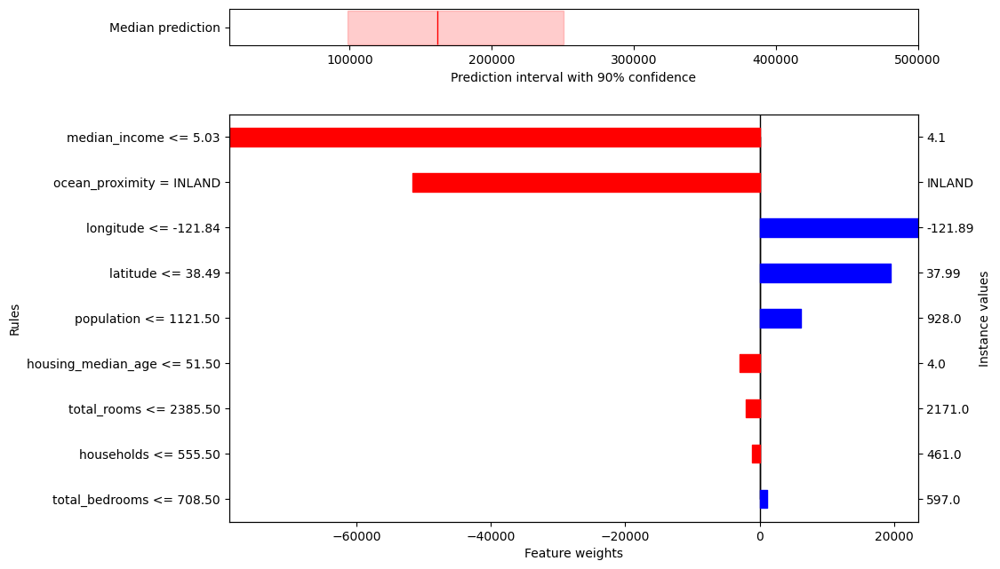

In [11]:
factual_explanation.plot()

Uncertainty plots are similar to regular plots but also provide an uncertainty estimate for the impact of each feature. Here, the shaded area is the range of possible changes with the assigned confidence interval (here a two-sided interval with 95% confidence, as defined above). The solid line in the middle of the shaded interval is the median in the conformal predictive distribution.

To get uncertainty plots, simply call `plot` with the parameter `uncertainty=True`.

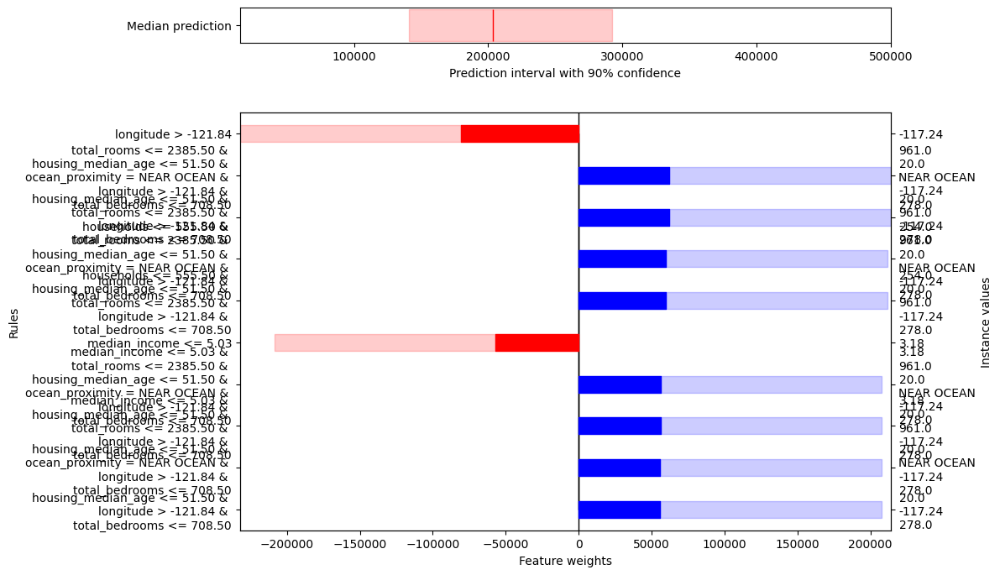

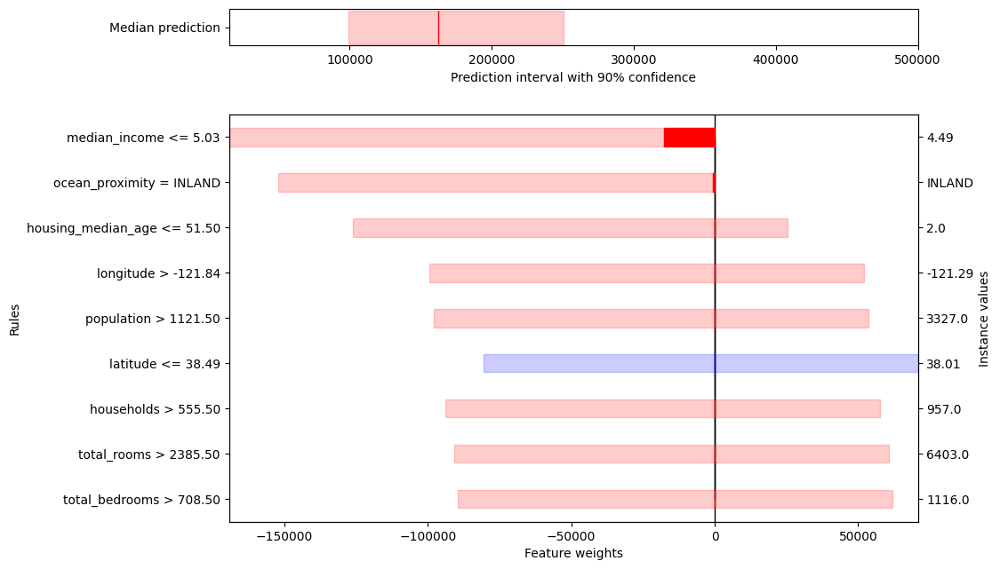

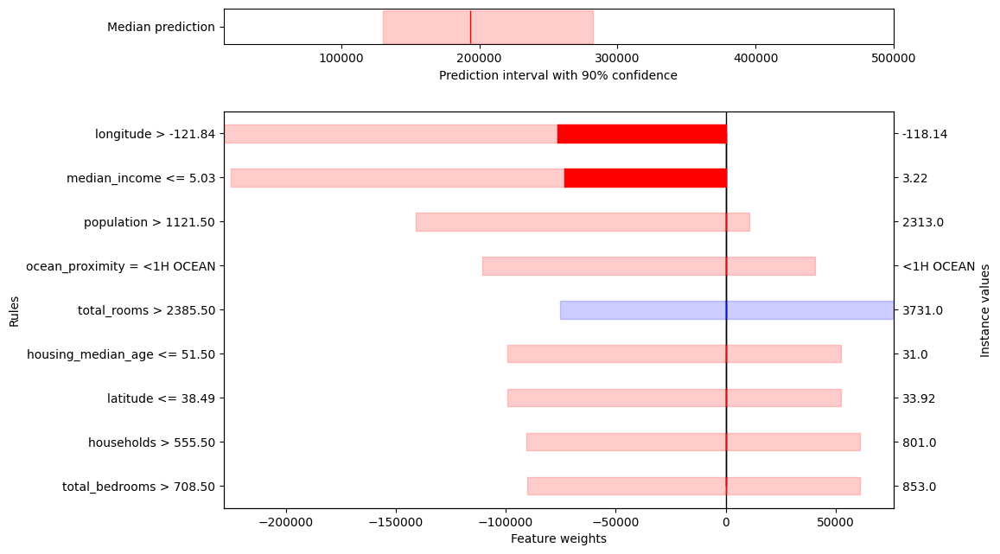

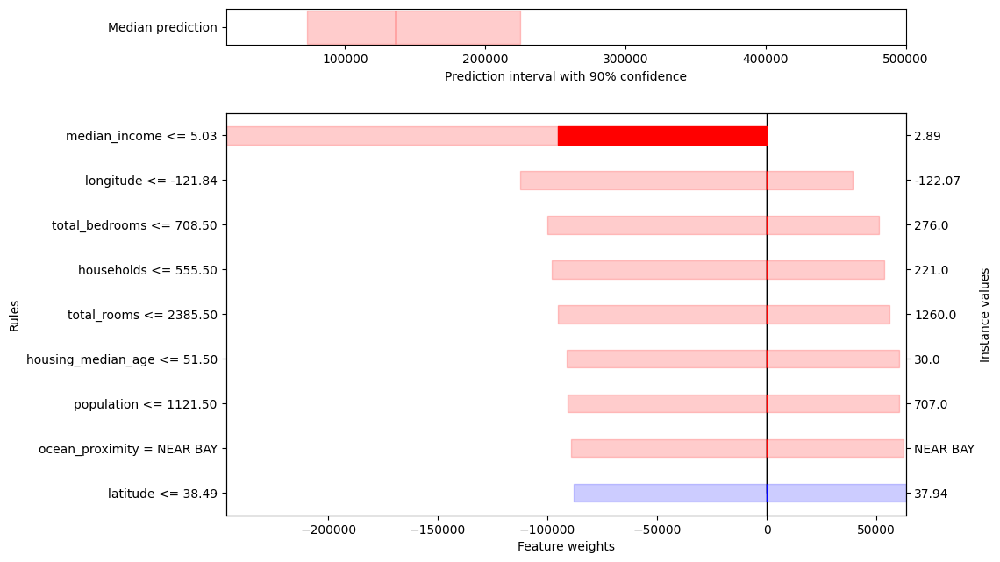

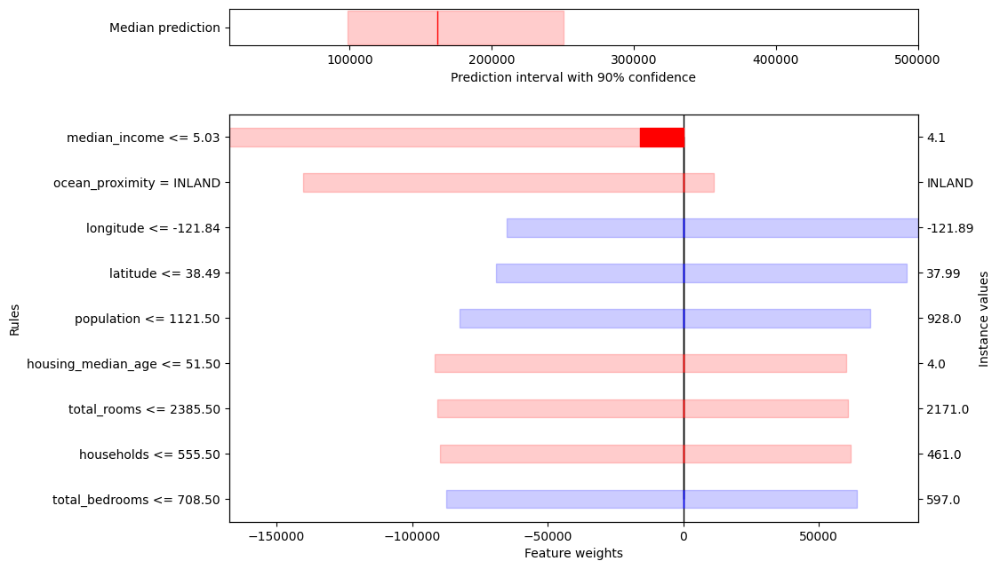

In [12]:
factual_explanation.plot(uncertainty=True)

It is also possible to add conjunctive rules through the `add_conjunctions` method. Two rules are combined by default when called without parameters but up to three rules can be combined if the parameter `num_rule_size=3`. By default, only the 5 most important rules are combined with other rules but this number can also be adjusted through the parameter `num_to_include`.


Instance 0

Factual Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 203743.520
Prediction Interval: [140733.020, 292262.020]

Factors impacting the calibrated prediction positively:
(housing_median_age (20.0) <= 51.50 AND total_rooms (961.0) <= 2385.50 AND longitude (-117.24) > -121.84 AND total_bedrooms (278.0) <= 708.50)                                                                                                                  — weight ≈ 125333.262 [62322.762, 213851.762]
(total_rooms (961.0) <= 2385.50 AND housing_median_age (20.0) <= 51.50 AND ocean_proximity (NEAR OCEAN) = NEAR OCEAN AND longitude (-117.24) > -121.84 AND total_bedrooms (278.0) <= 708.50)                                                                    — weight ≈ 125333.262 [62322.762, 213851.762]
(households (254.0) <= 555.50 AND total_rooms (961.0) <= 2385.50 AND housing_median_age (20.0) <= 51.50 AND ocean_proximity (NEAR OCE

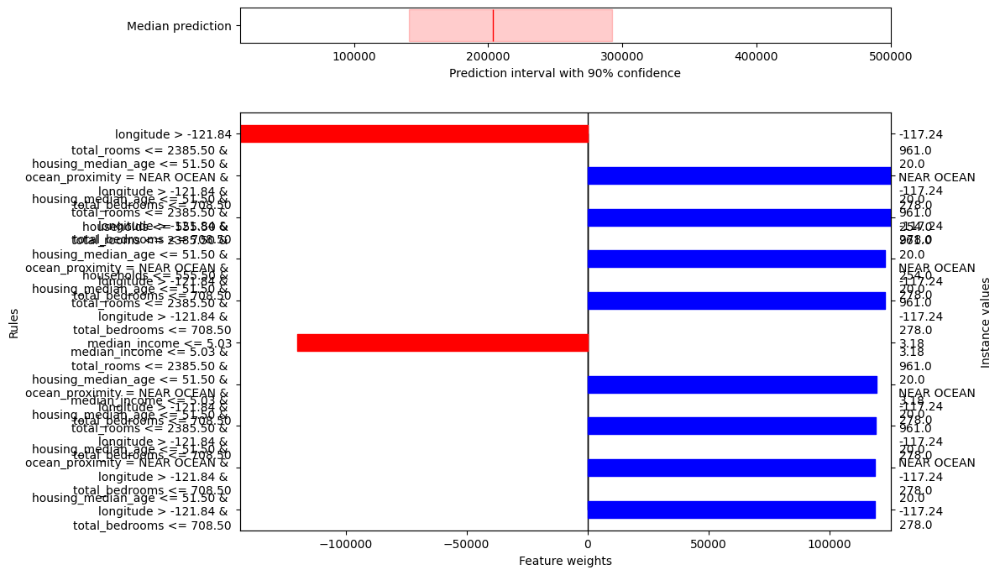

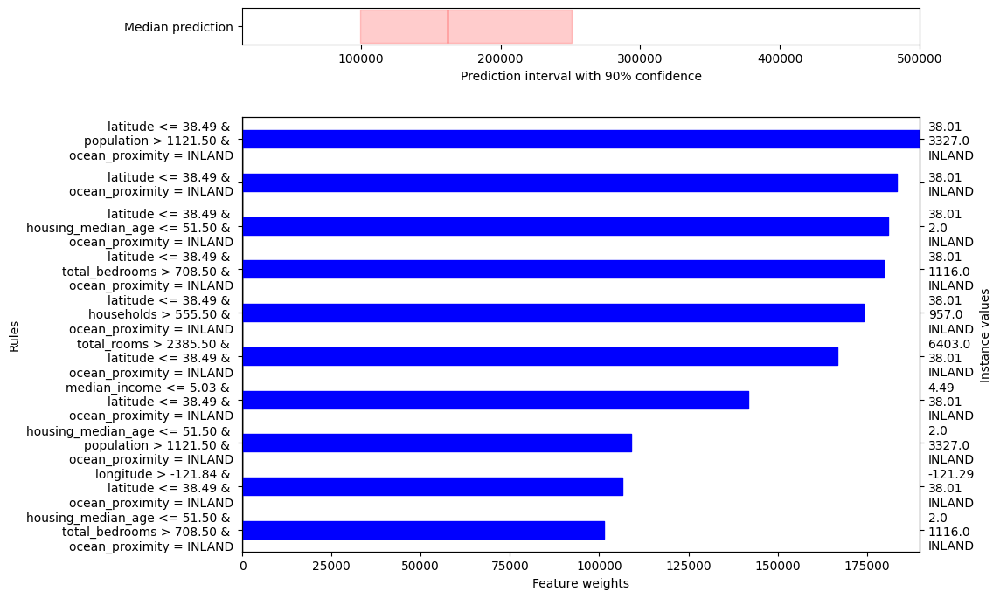

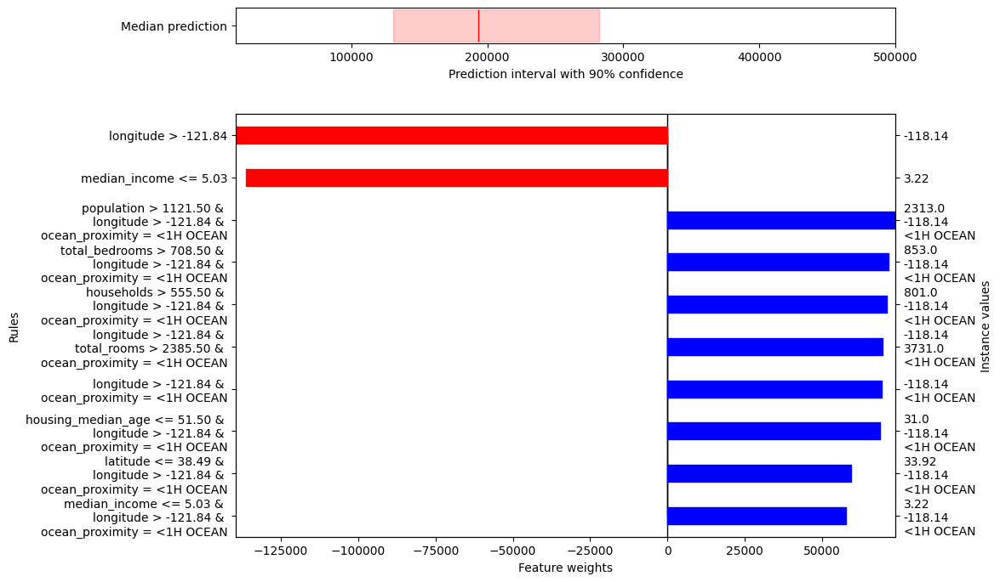

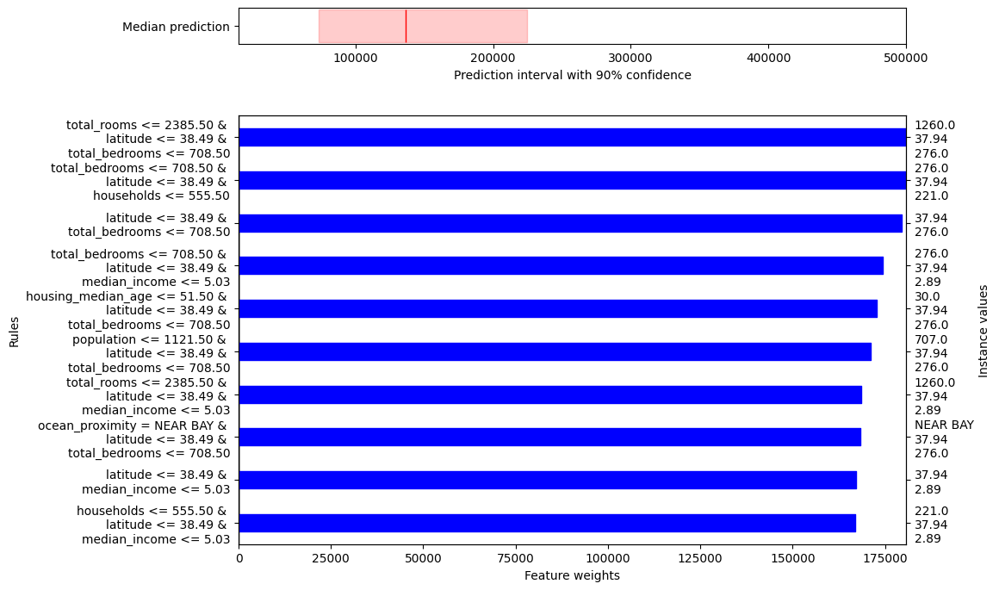

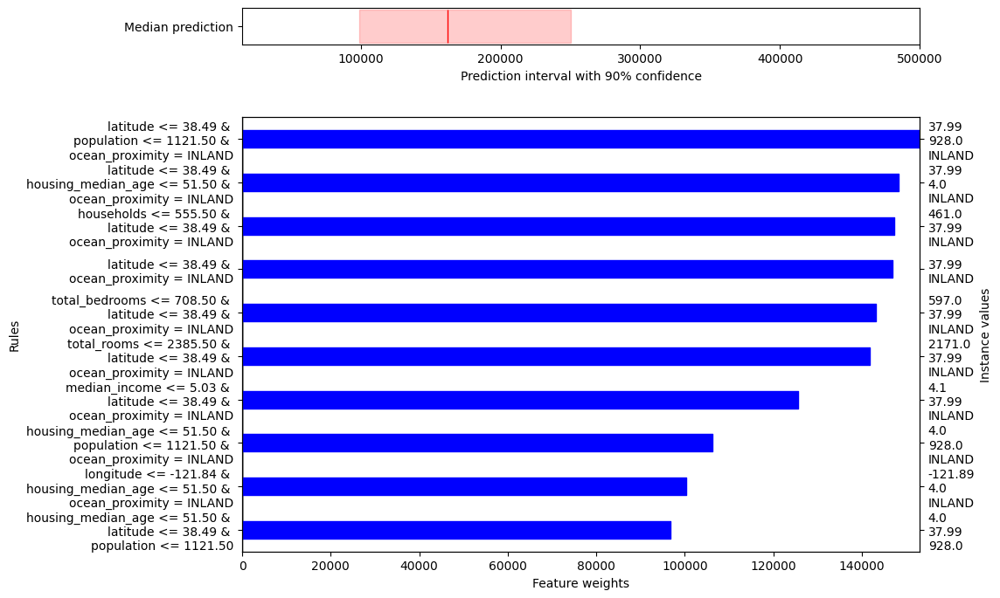

In [13]:
factual_explanation.add_conjunctions(max_rule_size=3).plot()
print(factual_explanation.to_narrative(output_format="text"))

If the conjunctions are no longer wanted, they can be removed with `remove_conjunctions`.

In [14]:
factual_explanation.remove_conjunctions()

CalibratedExplanations(5 explanations):
Prediction [ Low ,  High]
203743.520 [140733.020, 292262.020]
Value : Feature                                  Weight [ Low  ,  High ]
-117.24: longitude > -121.84                      -143670.247 [-232188.747, -80659.747]
3.18  : median_income <= 5.03                    -120023.780 [-208542.280, -57013.280]
20.0  : housing_median_age <= 51.50              -90661.060 [-179179.560, -27650.560]
278.0 : total_bedrooms <= 708.50                 -40508.403 [-129026.903, 22502.097]
525.0 : population <= 1121.50                    23417.667 [-65100.833, 86428.167]
NEAR OCEAN: ocean_proximity = NEAR OCEAN             16952.737 [-71565.763, 79963.237]
961.0 : total_rooms <= 2385.50                   -16310.697 [-104829.197, 46699.803]
32.79 : latitude <= 38.49                        11063.020 [-77455.480, 74073.520]
254.0 : households <= 555.50                     9848.667 [-78669.833, 72859.167]

Prediction [ Low ,  High]
162243.500 [99233.000, 250762.00

#### One-sided lower-bounded interval with 95% confidence
To change confidence or interval type, new explanations must be extracted. Here `low_high_percentiles=osli` to get a one-sided lower-bounded interval.

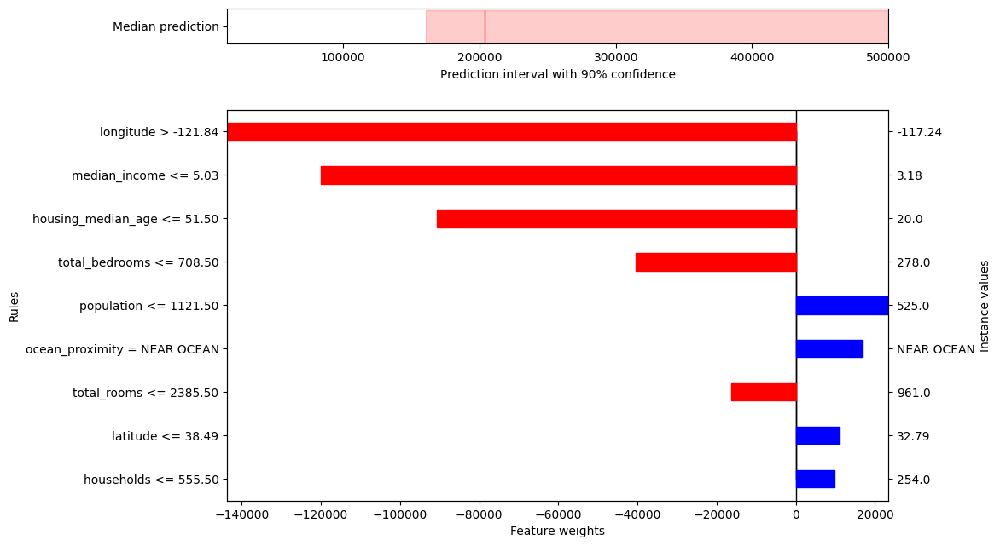

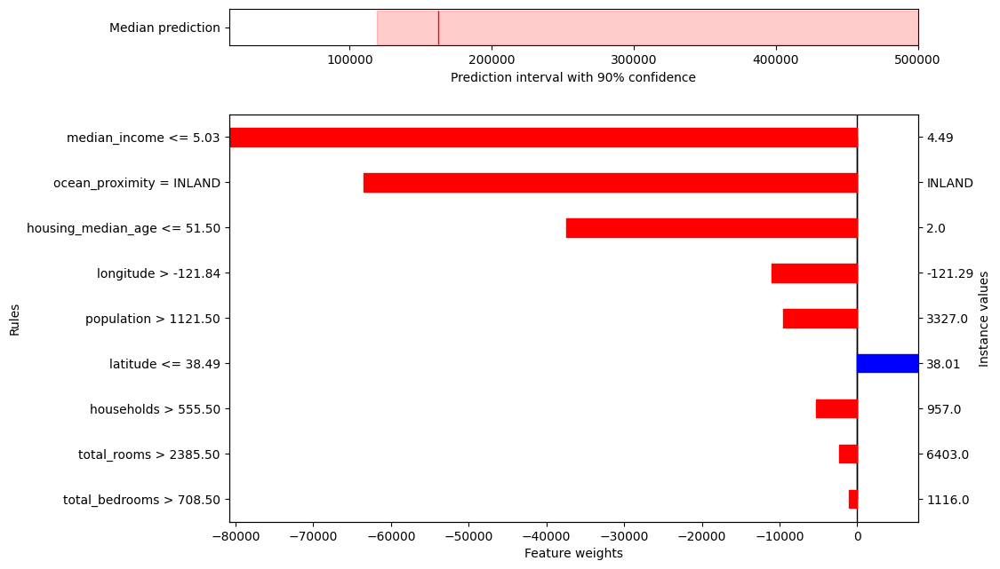

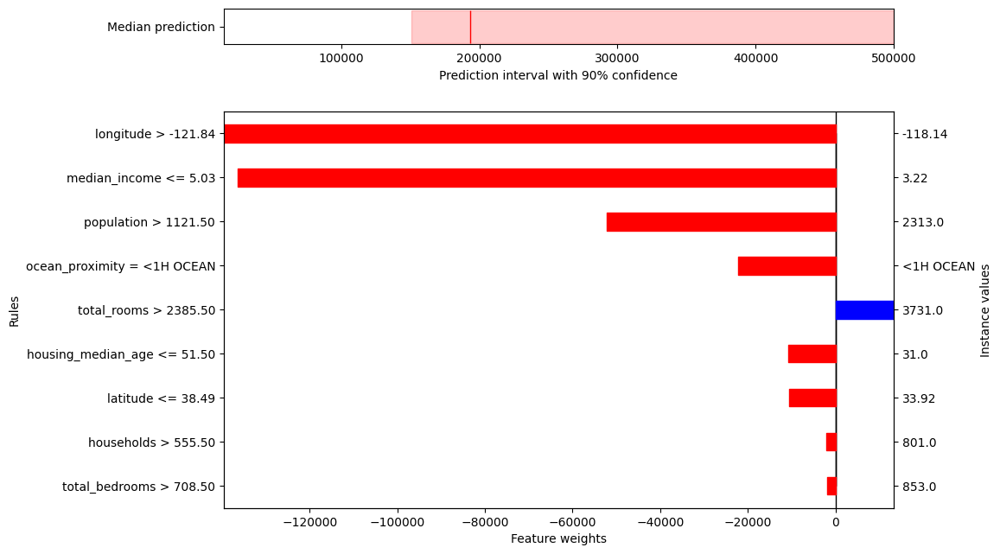

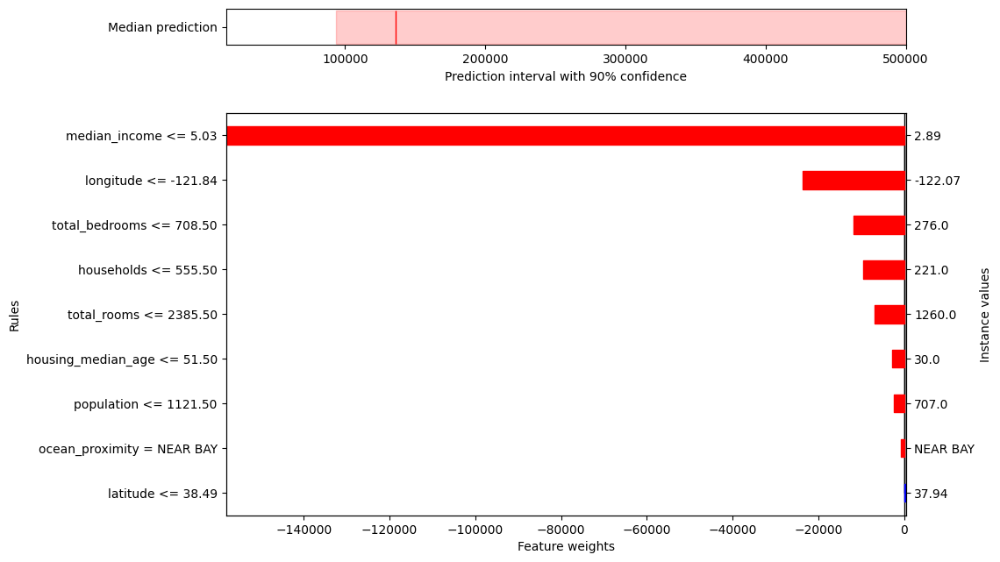

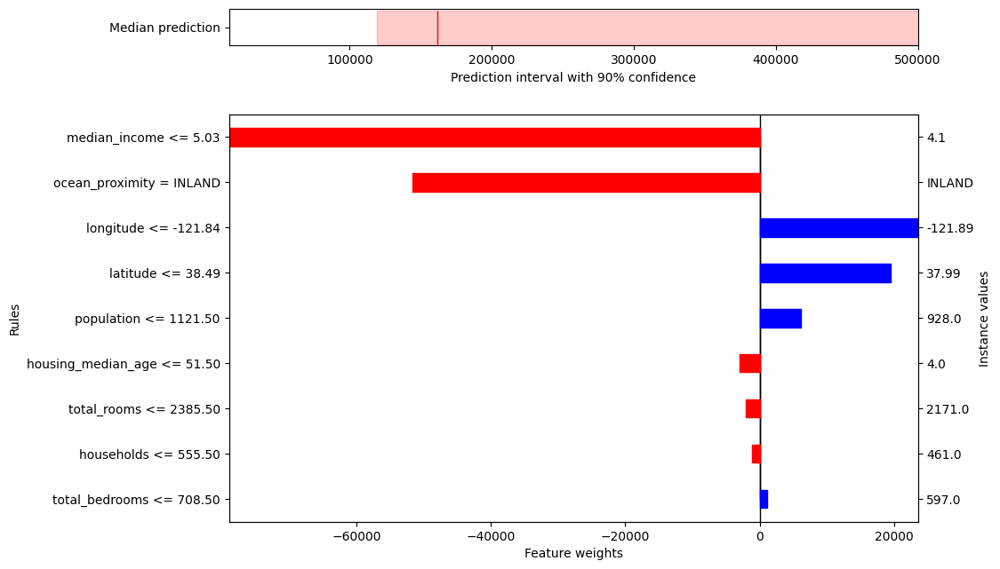

In [15]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osli)
factual_explanation.plot()

#### One-sided upper-bounded interval with 95% confidence
Here `low_high_percentiles=osui` to get a one-sided upper-bounded interval.

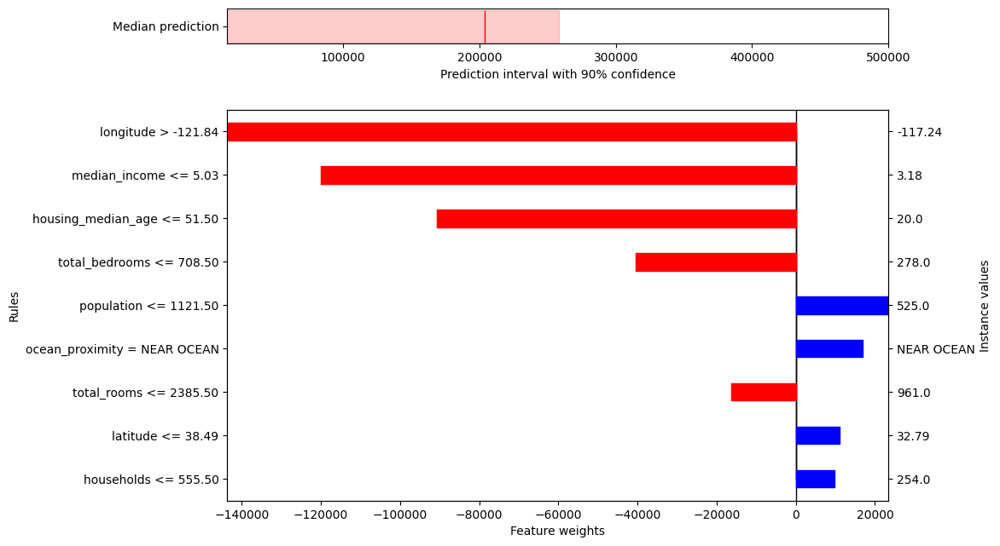

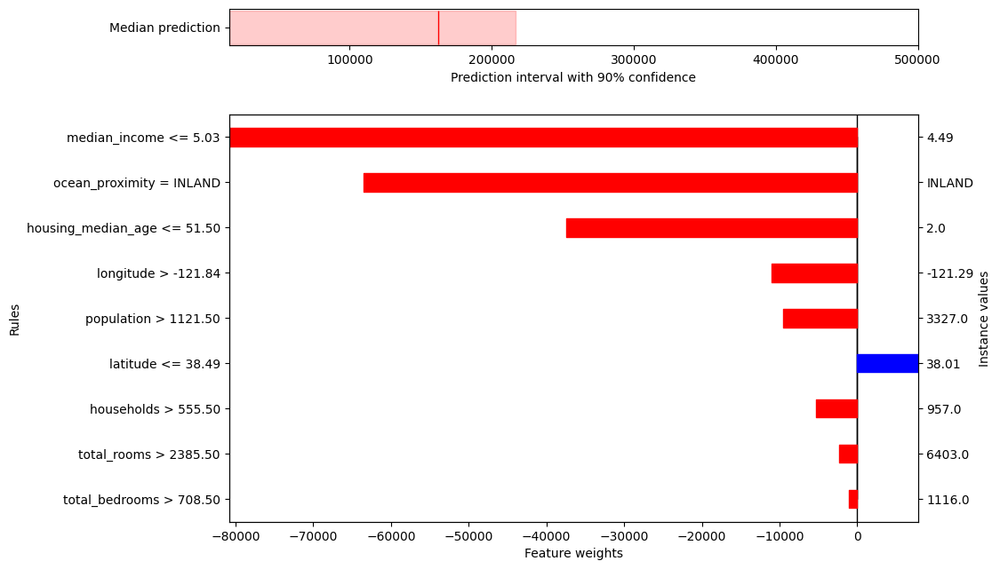

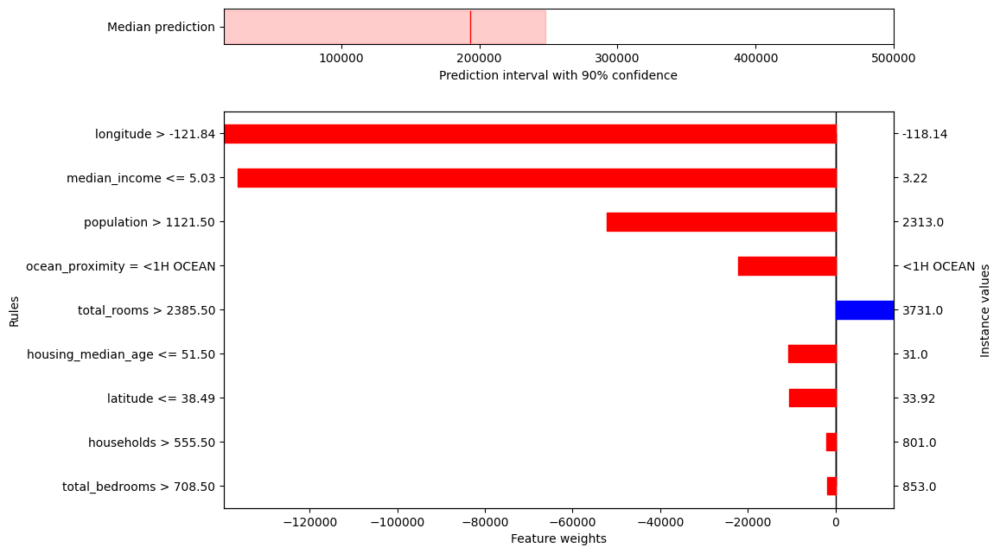

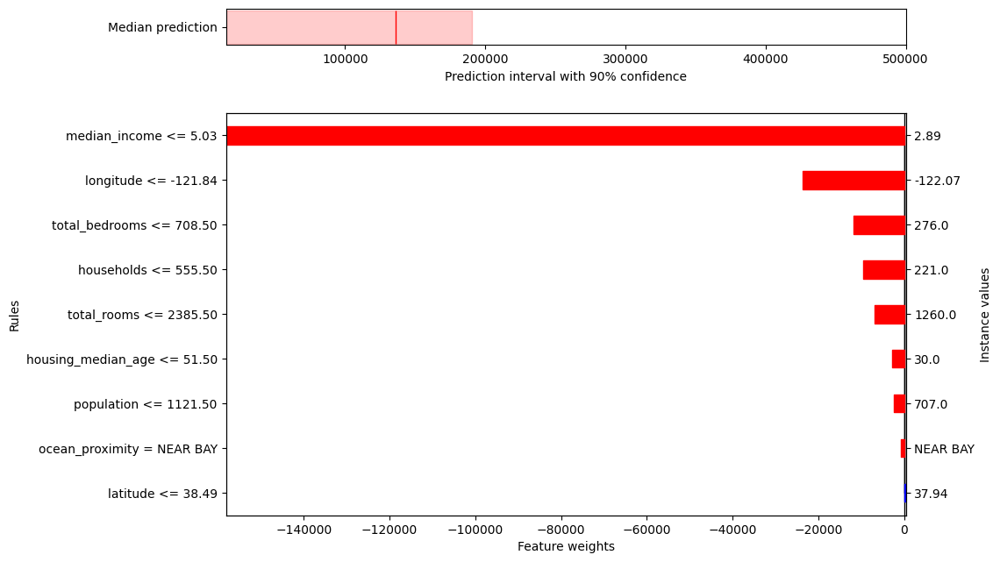

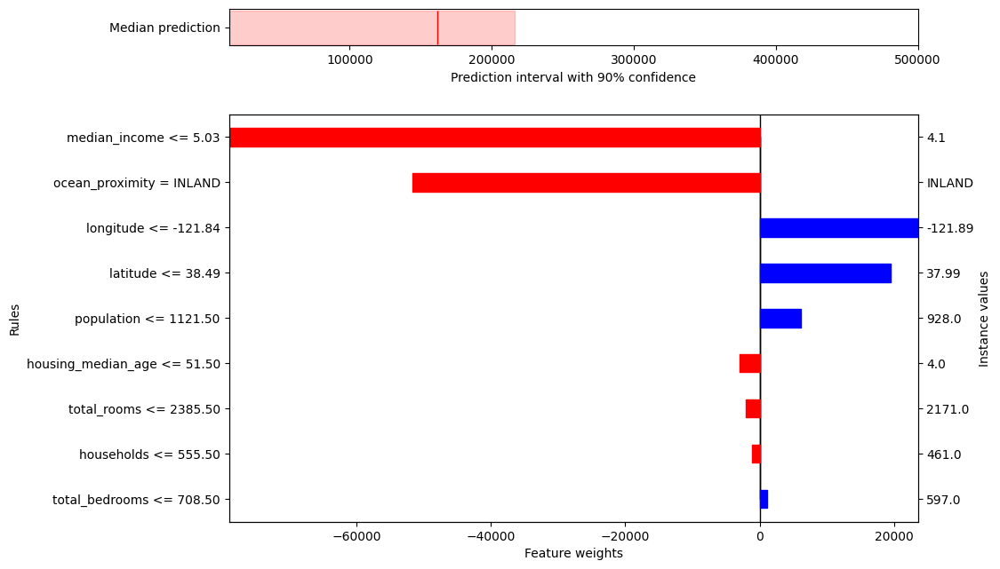

In [16]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osui)
factual_explanation.plot()

#### Two-sided alternative rules 

In [17]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=tsi)
display(ce)

WrapCalibratedExplainer(learner=RandomForestRegressor(oob_score=True), fitted=True, calibrated=True, 
		explainer=CalibratedExplainer(mode=regression, discretizer=RegressorDiscretizer(), learner=RandomForestRegressor(oob_score=True), difficulty_estimator=None))


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 203743.520
Prediction Interval: [140733.020, 292262.020]

Alternatives to increase the Calibrated Prediction compared to 203743.520:
- If longitude < -118.33         then 347697.447 [284686.947, 436215.947]
- If housing_median_age > 20.50  then 264297.893 [201287.393, 352816.393]
- If median_income > 4.07        then 260558.210 [197547.710, 349076.710]
- If total_bedrooms > 708.50     then 244251.923 [181241.423, 332770.423]
- If total_rooms > 1752.50       then 218786.543 [155776.043, 307305.043]
- If households < 251.50         then 207423.533 [144413.033, 295942.033]

Alternatives to decrease the Calibrated Prediction compared to 203743.520:
- If ocean_proximity = INLAND    then 163524.530 [100514.030, 252043.030]
- If population > 1112.50        then 181000.853 [117990.353, 269519.353]
- If ocean_proximity = <1H OCEAN then 189947.5

c:\Users\loftuw\Documents\Github\moffran-calibrated_explanations\calibrated_explanations\venv-wheel\Lib\site-packages\calibrated_explanations\plotting.py:1085: Warning: All uncertainties are (almost) identical.
  legacy.plot_triangular(


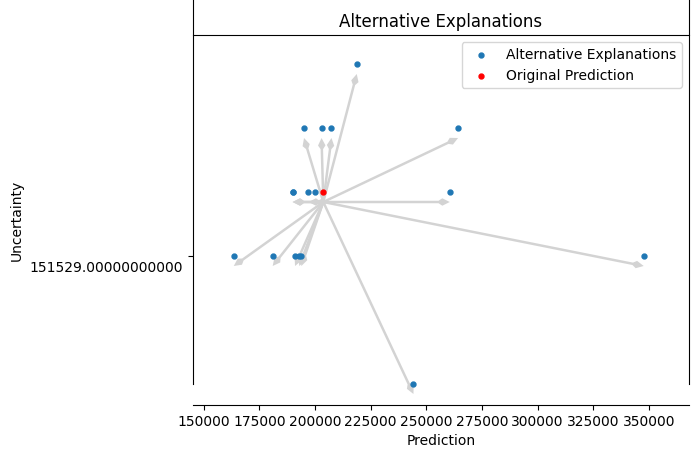


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 203743.520
Prediction Interval: [140733.020, 292262.020]

Alternatives to increase the Calibrated Prediction compared to 203743.520:
- If (population < 360.00 AND households < 251.50 AND housing_median_age < 4.50 AND longitude < -118.33 AND total_bedrooms > 708.50)                              then 360101.571 [297091.071, 448620.071]
- If (population < 360.00 AND housing_median_age < 4.50 AND longitude < -118.33 AND total_bedrooms > 708.50)                                                      then 360101.571 [297091.071, 448620.071]
- If (households < 251.50 AND housing_median_age < 4.50 AND longitude < -118.33 AND total_bedrooms > 708.50)                                                      then 359467.793 [296457.293, 447986.293]
- If (housing_median_age < 4.50 AND longitude < -118.33 AND total_bedrooms > 708.50)                     

c:\Users\loftuw\Documents\Github\moffran-calibrated_explanations\calibrated_explanations\venv-wheel\Lib\site-packages\calibrated_explanations\plotting.py:1085: Warning: All uncertainties are (almost) identical.
  legacy.plot_triangular(


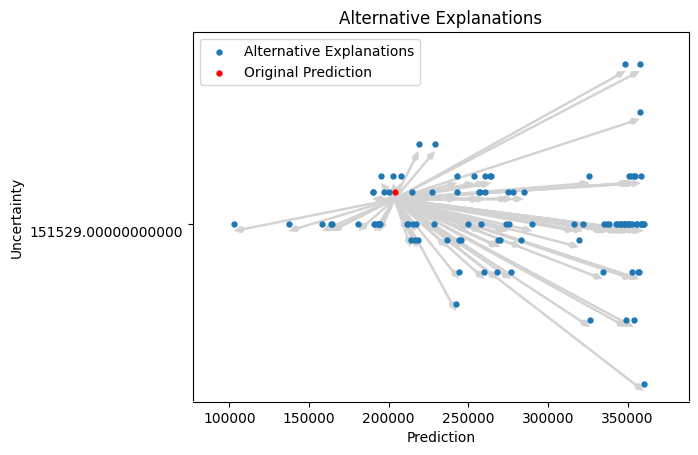

In [18]:
print(alternative_explanation[0].remove_conjunctions().to_narrative(expertise_level="advanced", output_format="text"))
alternative_explanation[0].plot(style="triangular")
print(alternative_explanation[0].add_conjunctions(max_rule_size=7).to_narrative(expertise_level="advanced", output_format="text"))
alternative_explanation[0].plot(style="triangular")

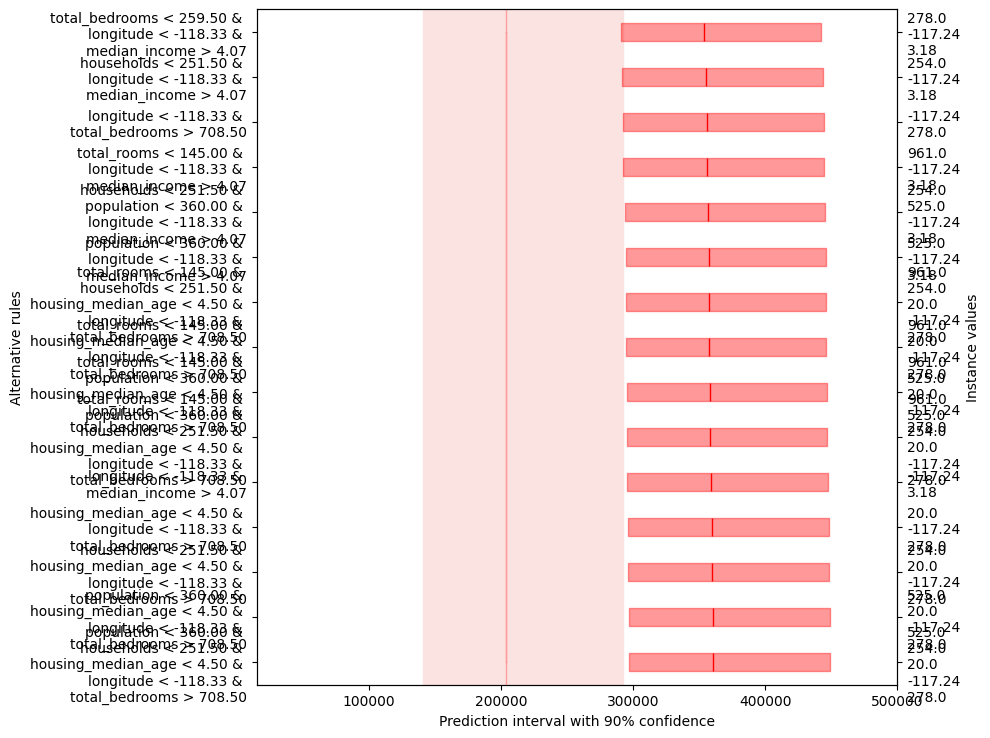

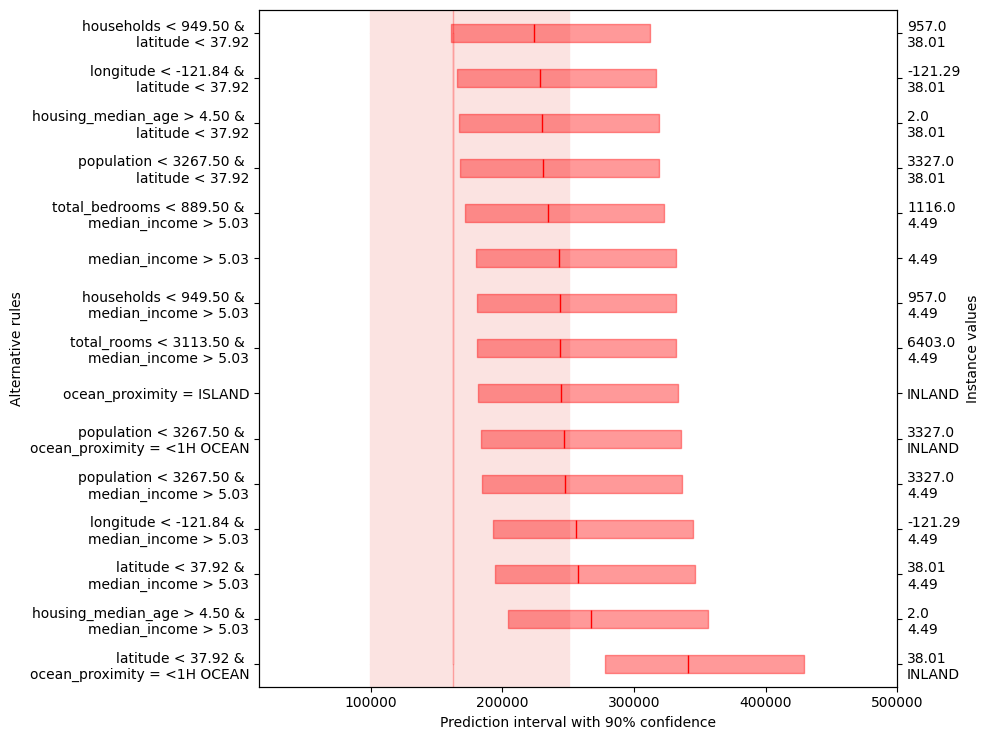

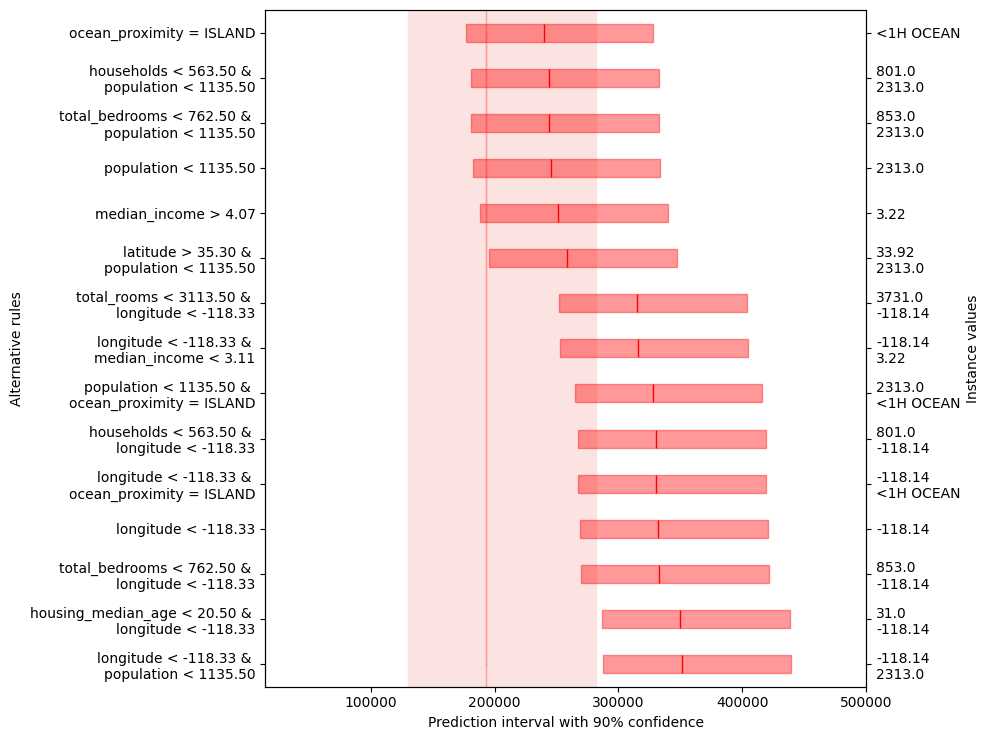

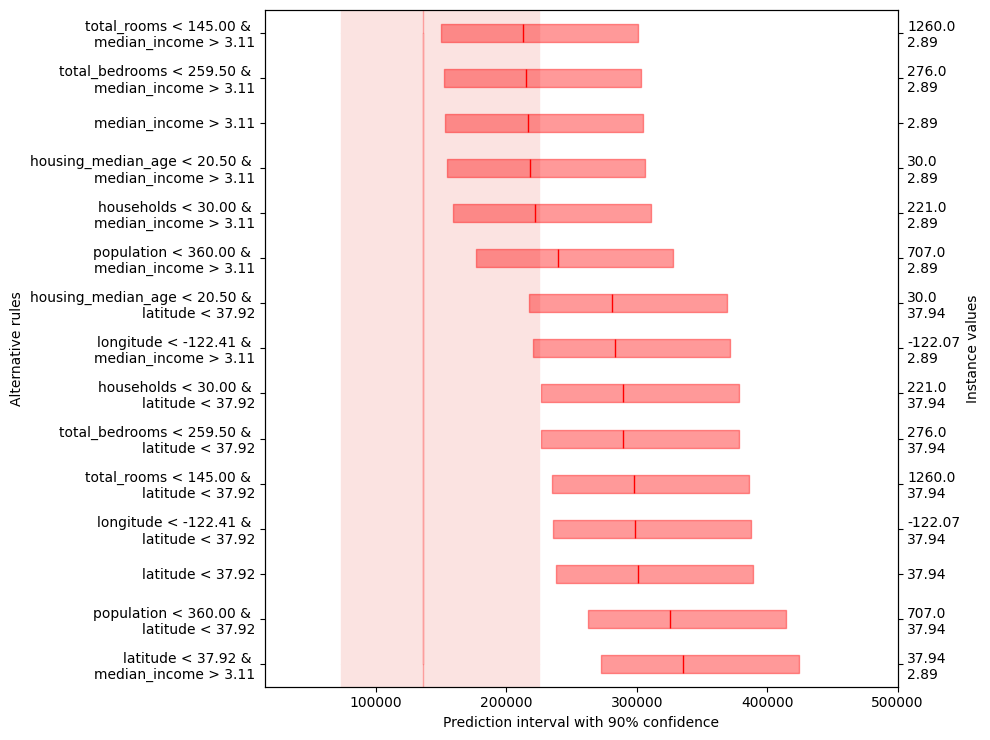

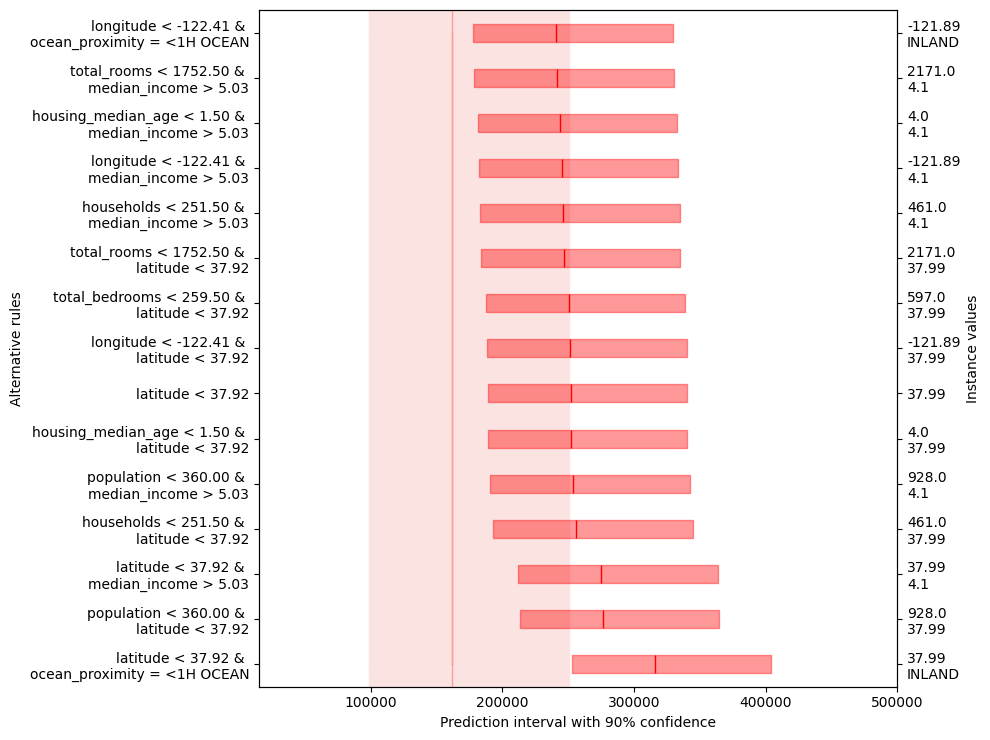

In [19]:
alternative_explanation.add_conjunctions(n_top_features=5).plot(filter_top=15)

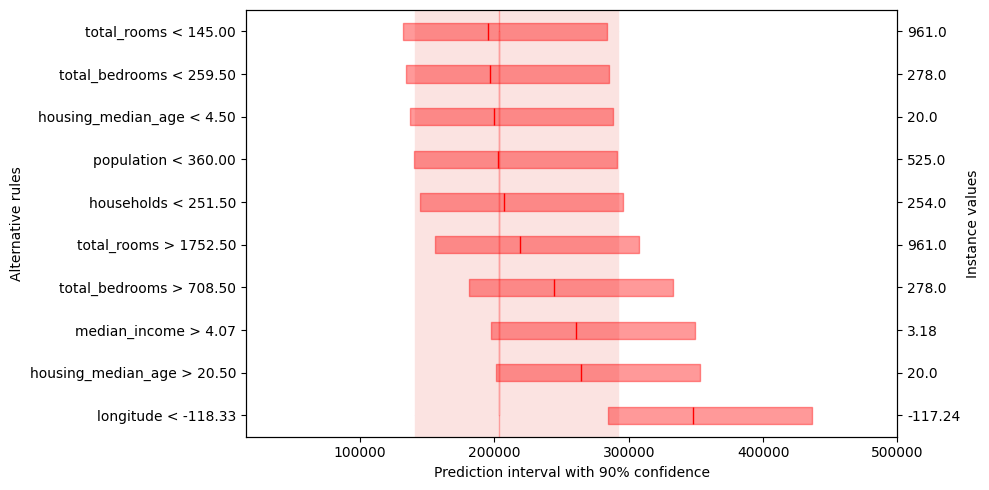

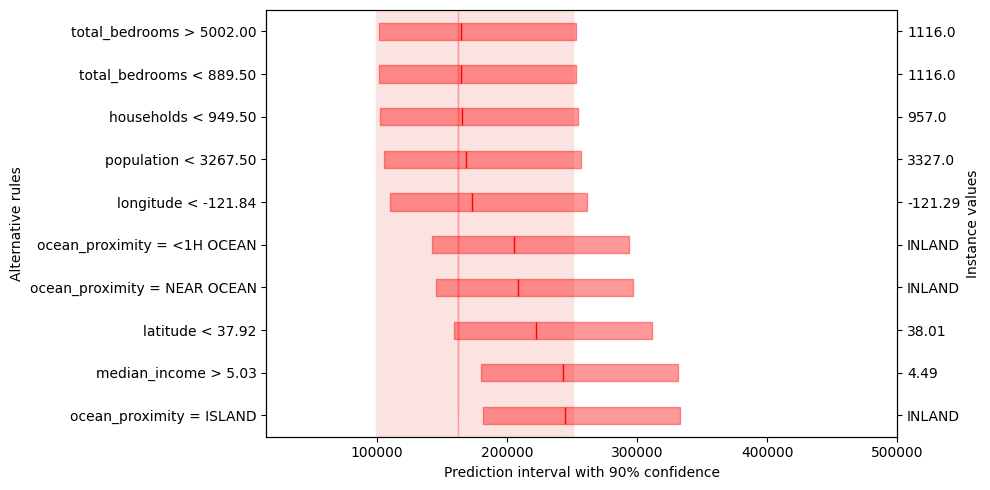

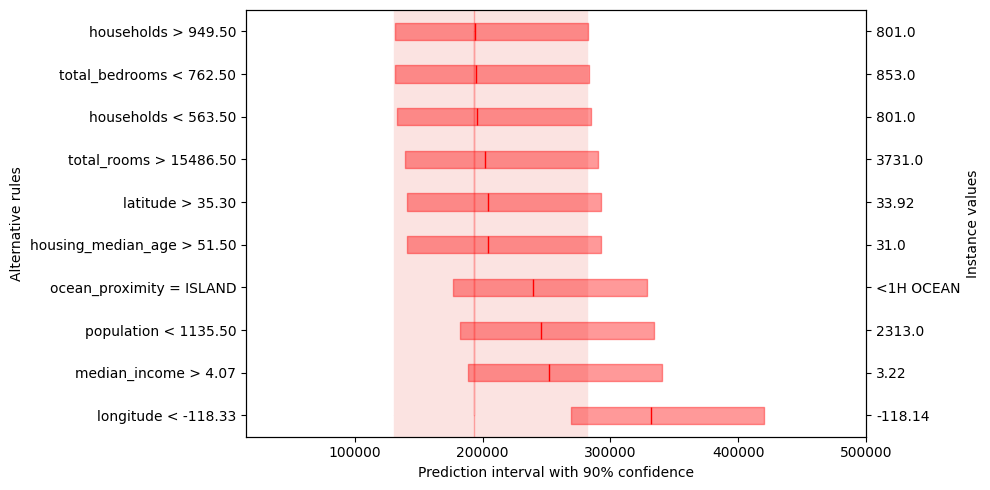

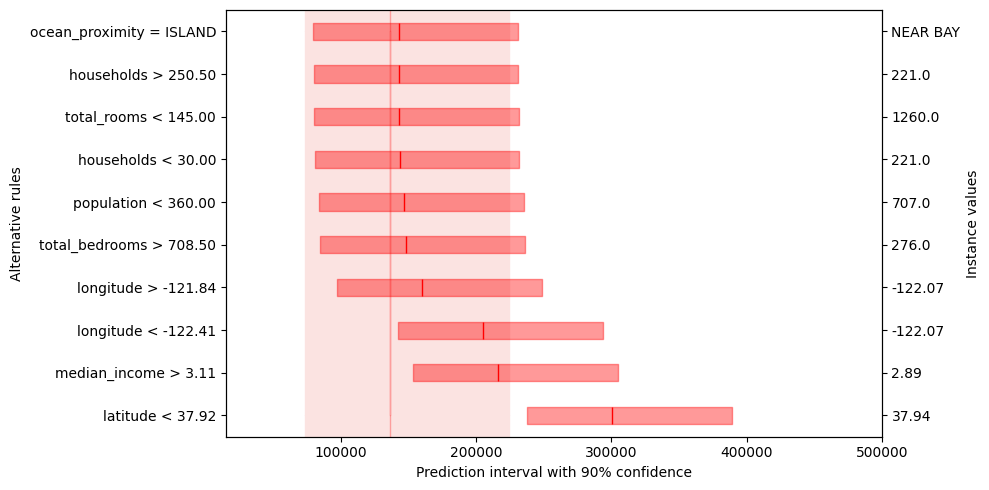

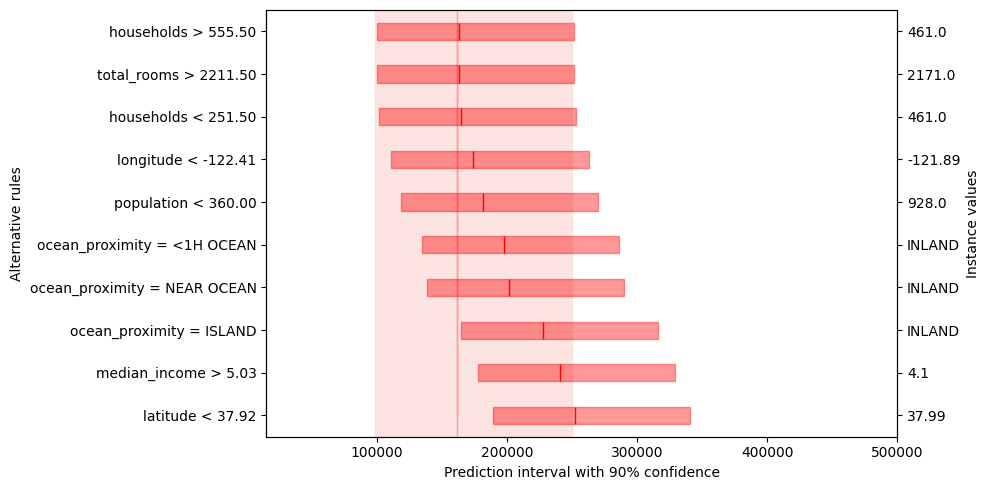

In [20]:
alternative_explanation.remove_conjunctions().plot()

#### One-sided alternative rules

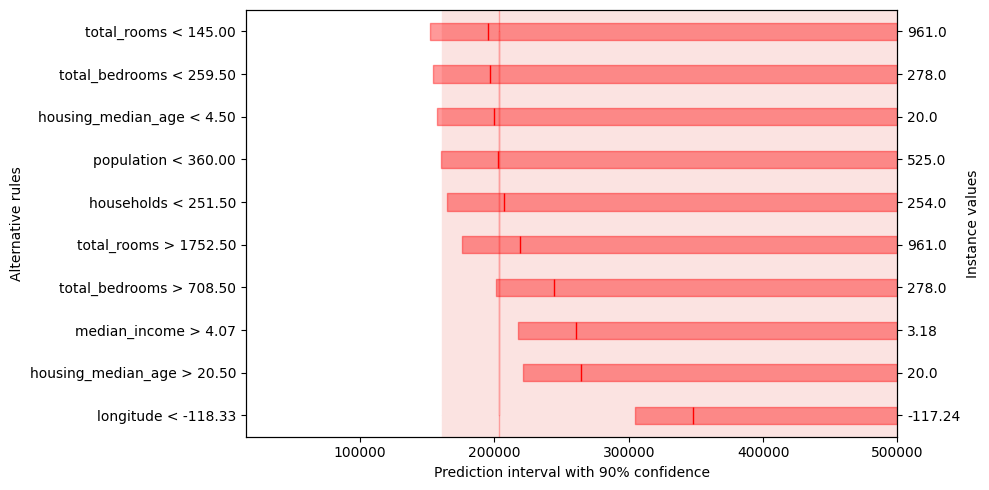

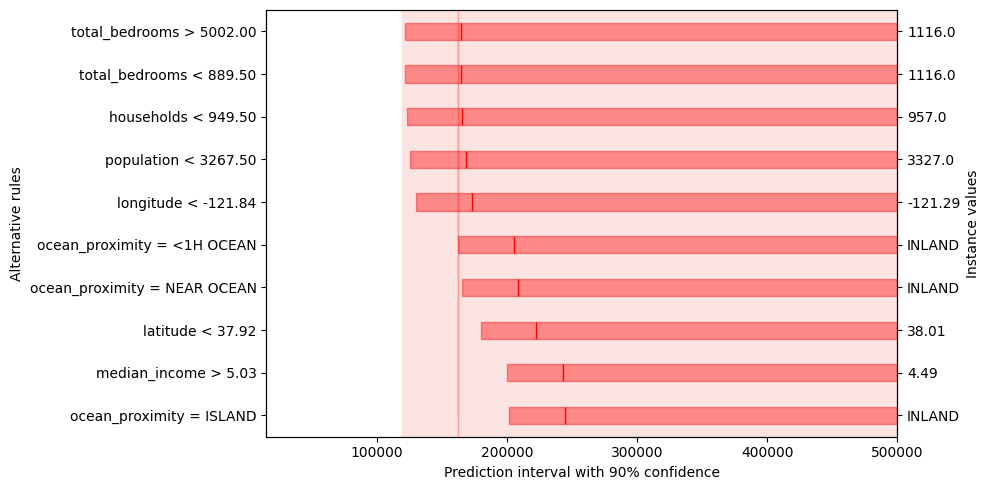

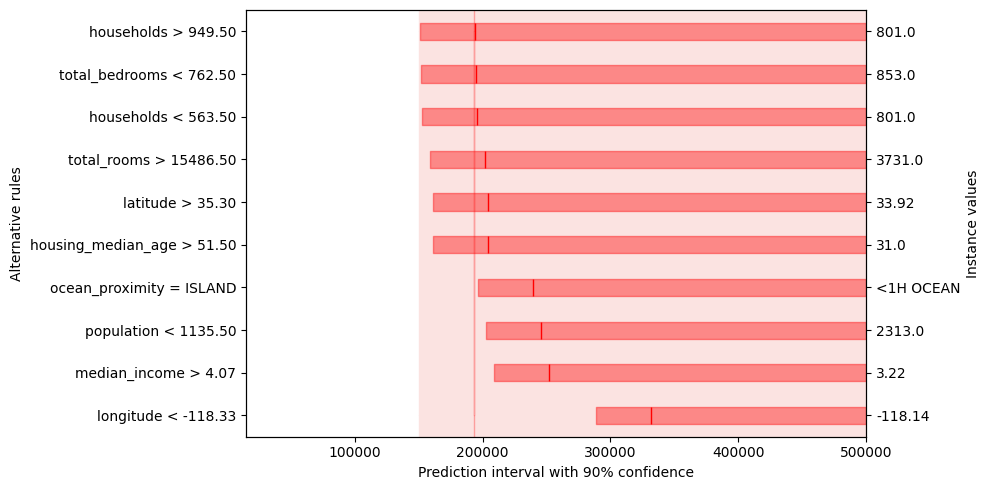

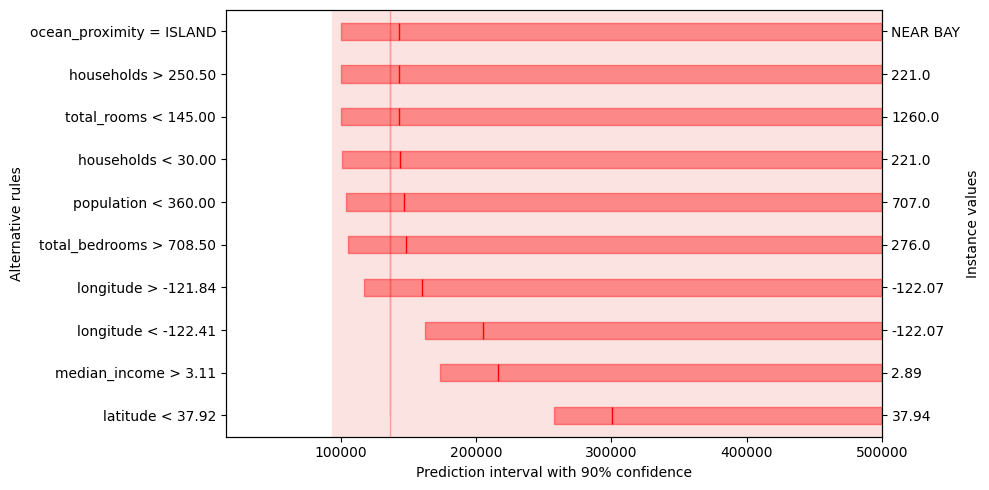

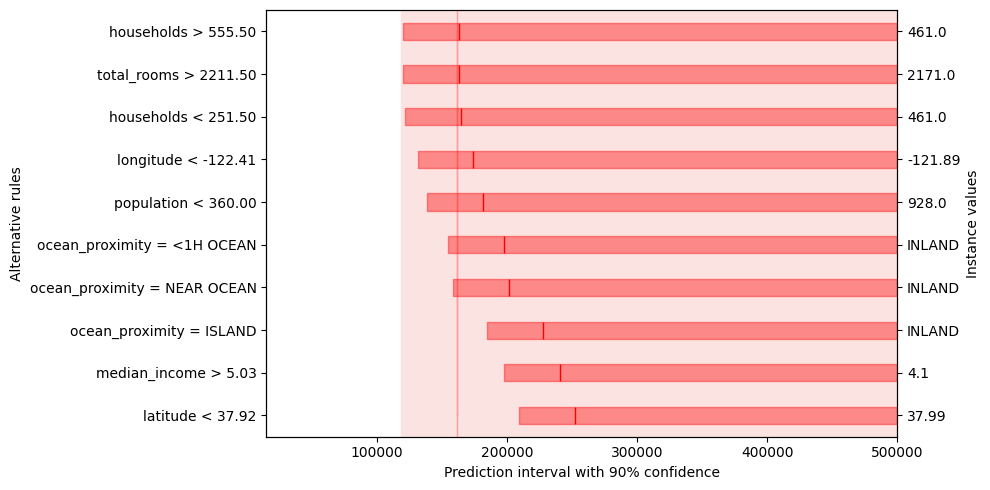

In [21]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osli)
alternative_explanation.plot()

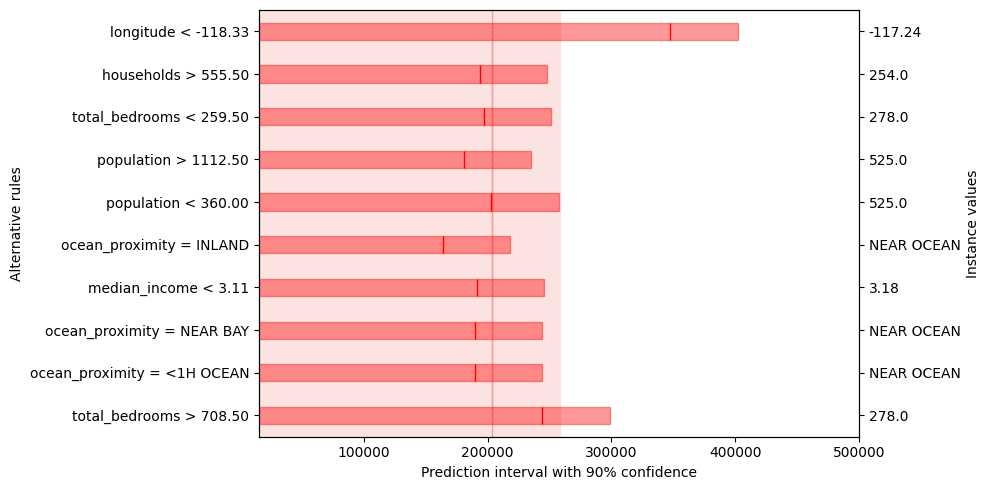

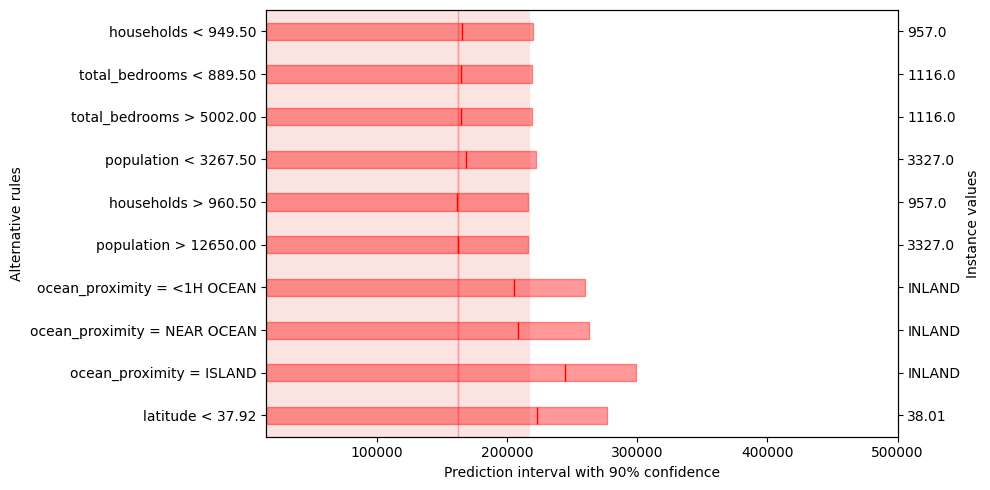

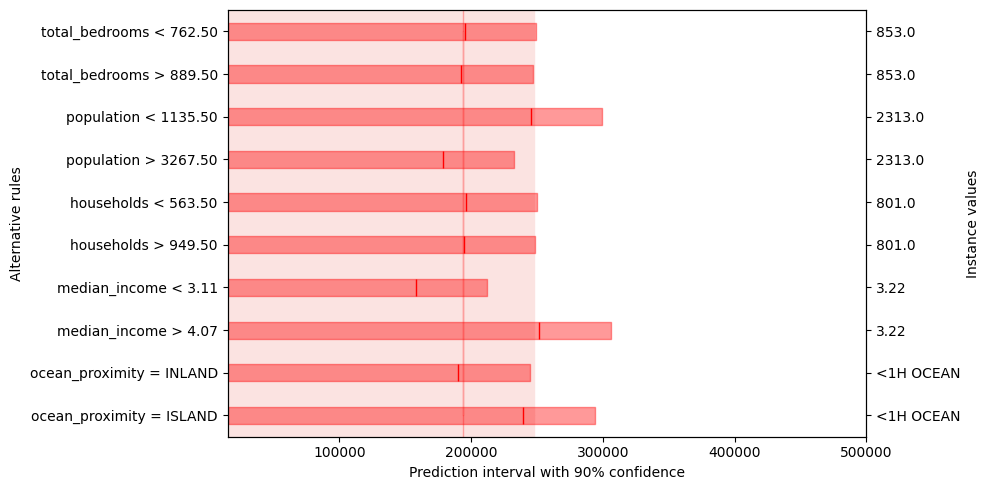

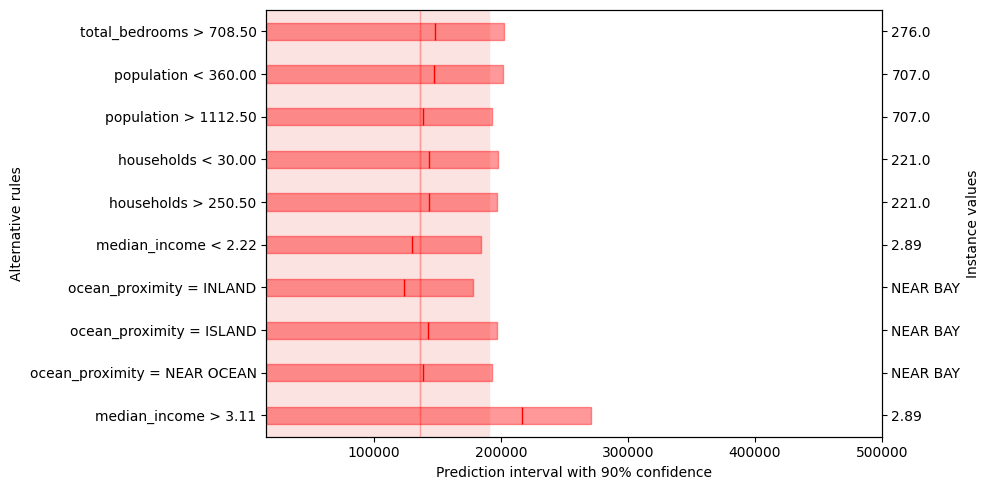

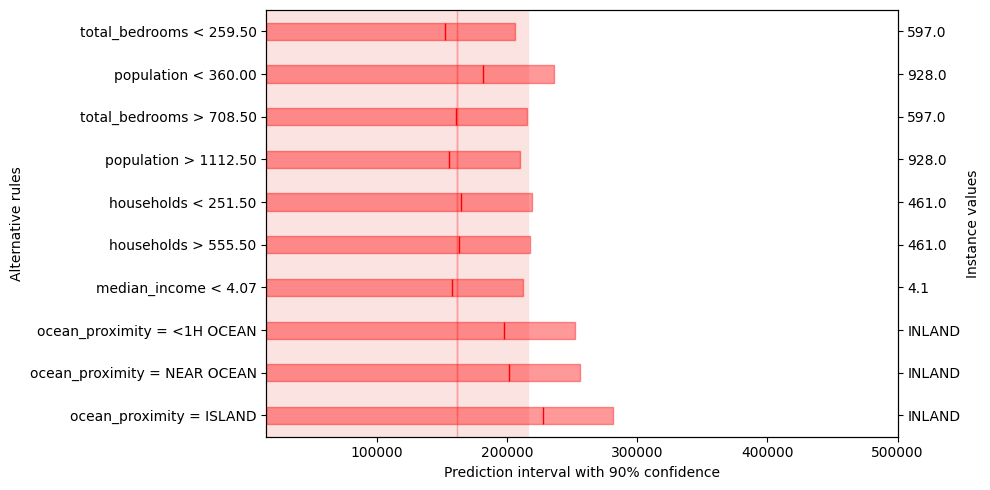

In [22]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osui)
alternative_explanation.plot()

### Normalized explanations
Normalized explanations can be achieved through the use k-nearest neighbor or by using the variance (if using an ensemble model like a RandomForestRegressor).

#### Normalized explanations using knn

There are three ways to set the difficulty estimator (sigma) for the WrapCalibratedExplainer when using k-nearest neighbor.
* alternative 1: by the (Euclidean) distances to the nearest neighbors
* alternative 2: by the standard deviation of the targets of the nearest neighbors
* alternative 3: by the absolute errors of the k nearest neighbors

See the documentation of crepes for further details on how the `DifficultyEstimator` works, see [here](https://crepes.readthedocs.io/en/latest/).

In [23]:
# alternative 1: by the (Euclidean) distances to the nearest neighbors
ce.set_difficulty_estimator(DifficultyEstimator().fit(X=X_prop_train, scaler=True))

# alternative 2: by the standard deviation of the targets of the nearest neighbors
ce.set_difficulty_estimator(DifficultyEstimator().fit(X=X_prop_train, y=y_prop_train, scaler=True))

# alternative 3: by the absolute errors of the k nearest neighbors
oob_predictions = model.oob_prediction_  # requires the model to have been trained with oob_score=True, available for RandomForestRegressor
residuals_oob = y_prop_train - oob_predictions
ce.set_difficulty_estimator(
    DifficultyEstimator().fit(X=X_prop_train, residuals=residuals_oob, scaler=True)
)

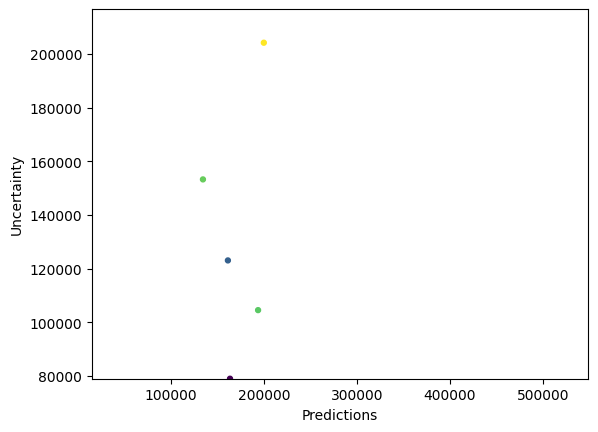

In [24]:
ce.plot(x_test, y_test, style="triangular")

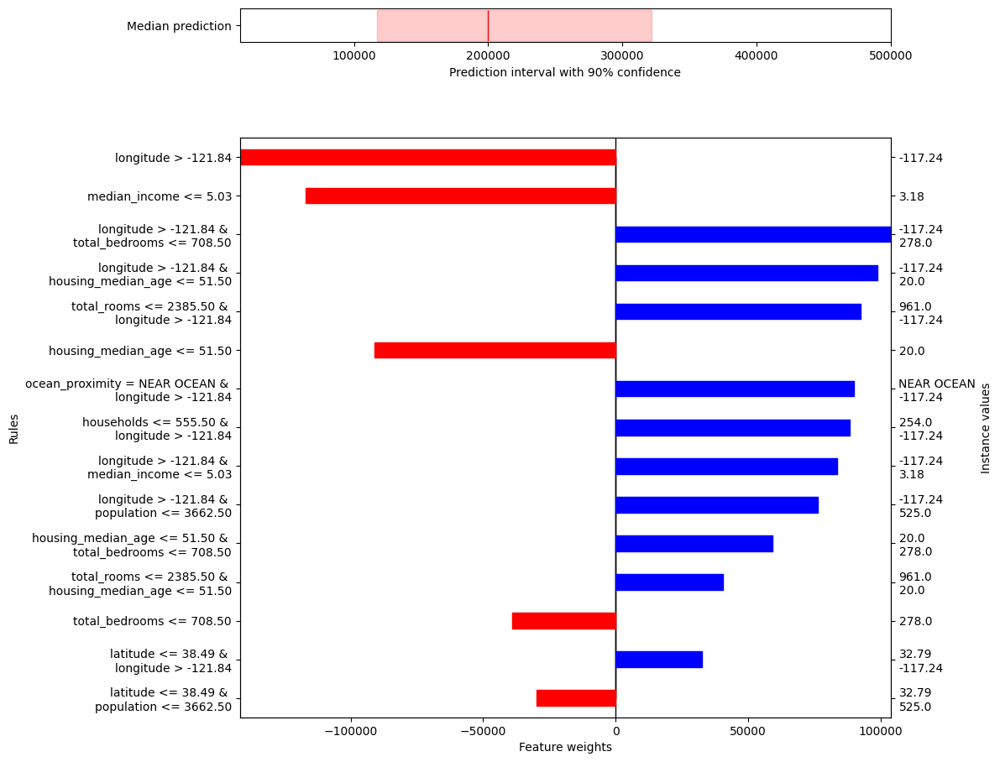

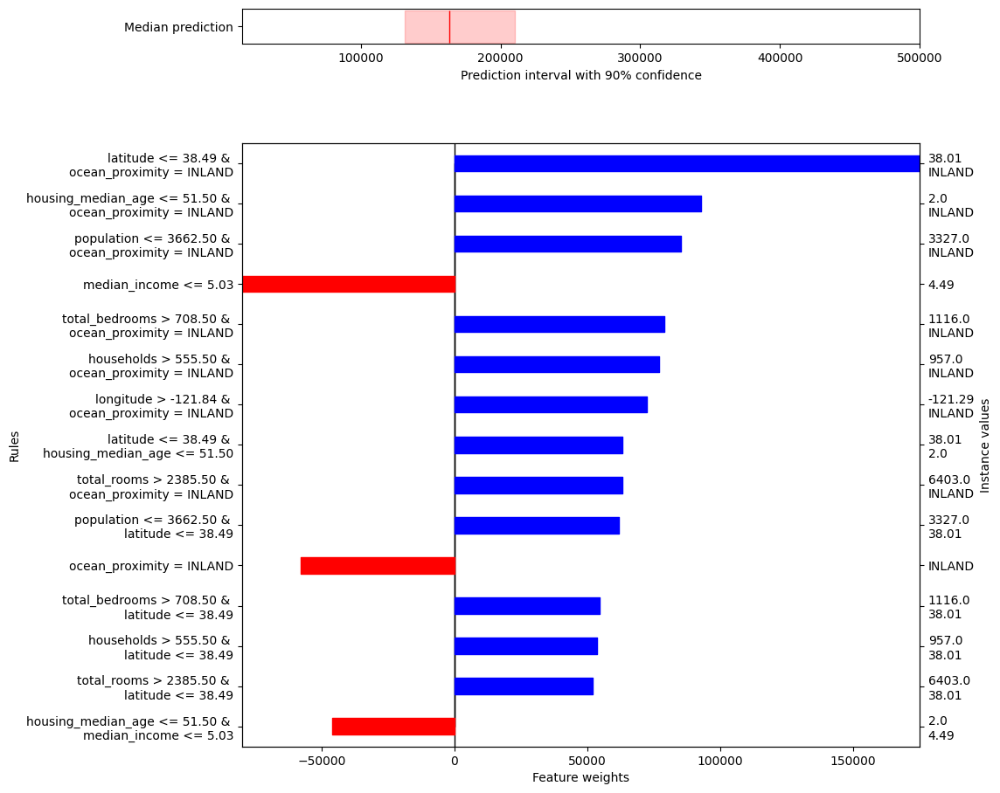

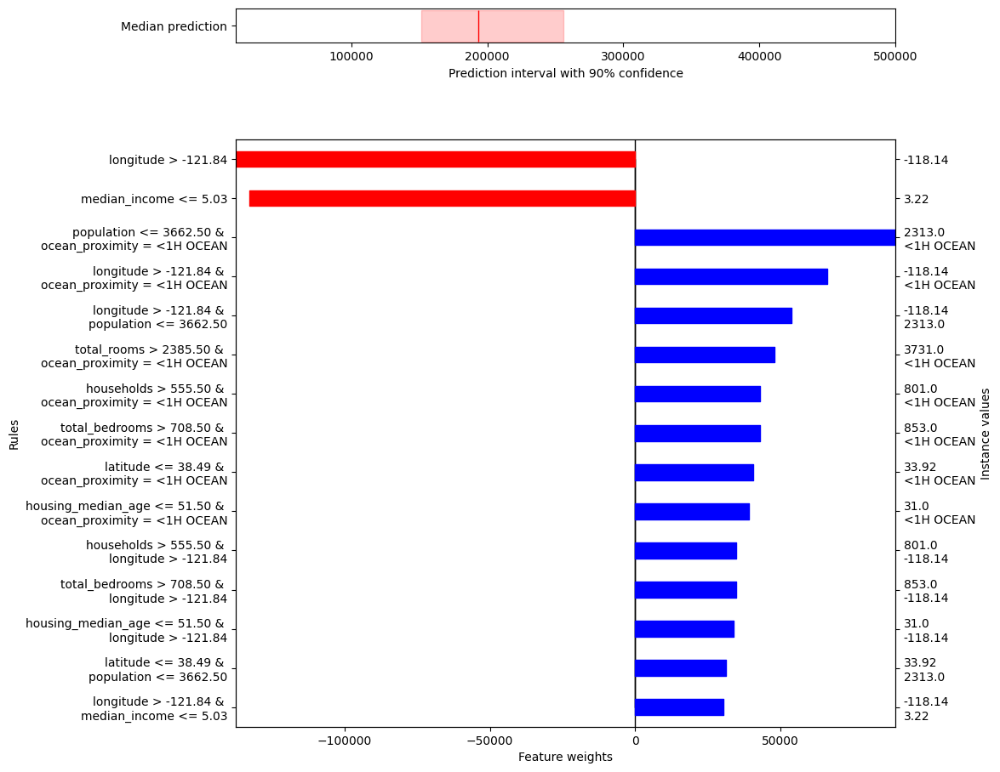

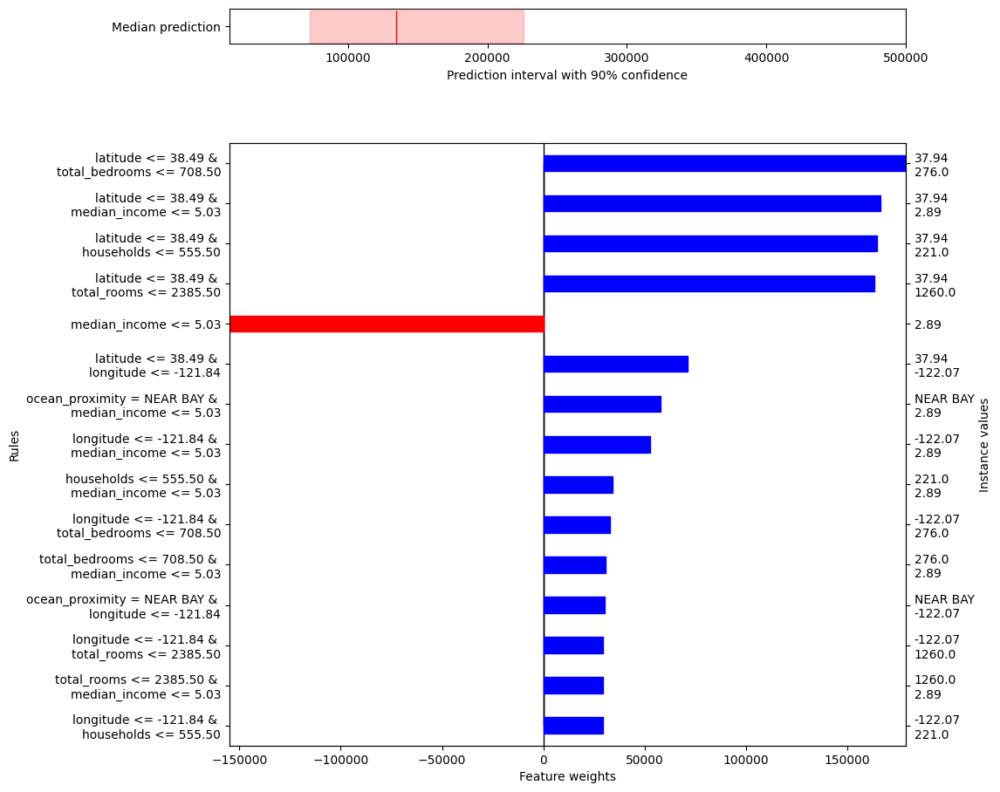

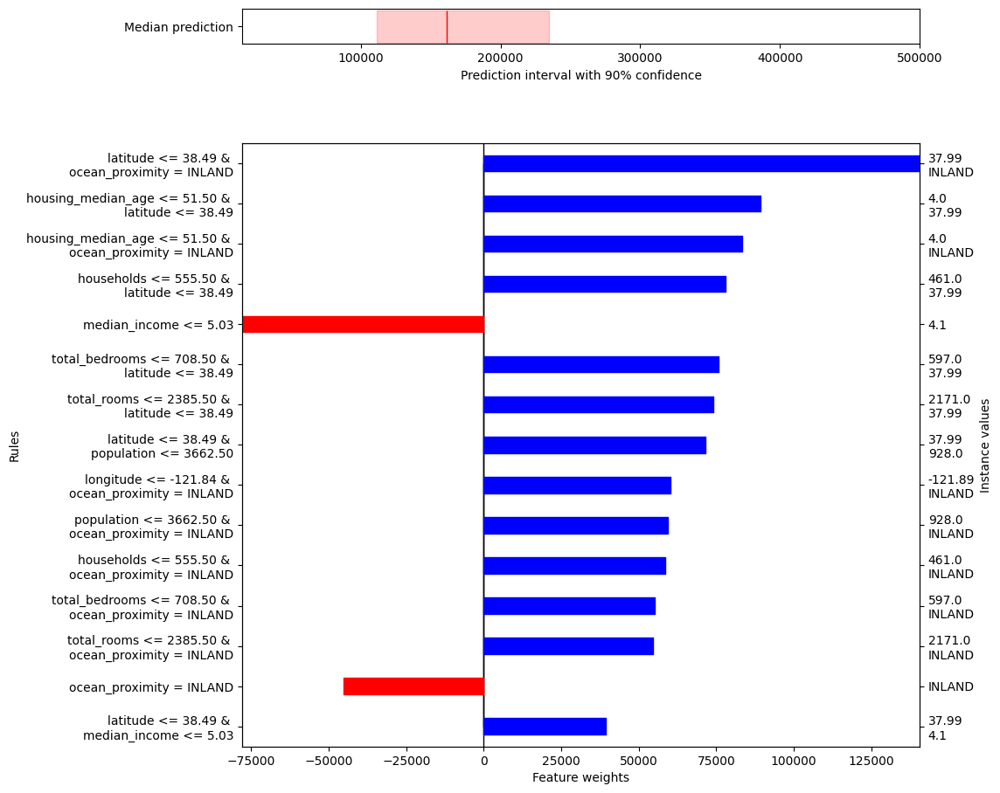

In [25]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=tsi)
factual_explanation.add_conjunctions(n_top_features=5)
factual_explanation.plot(filter_top=15)

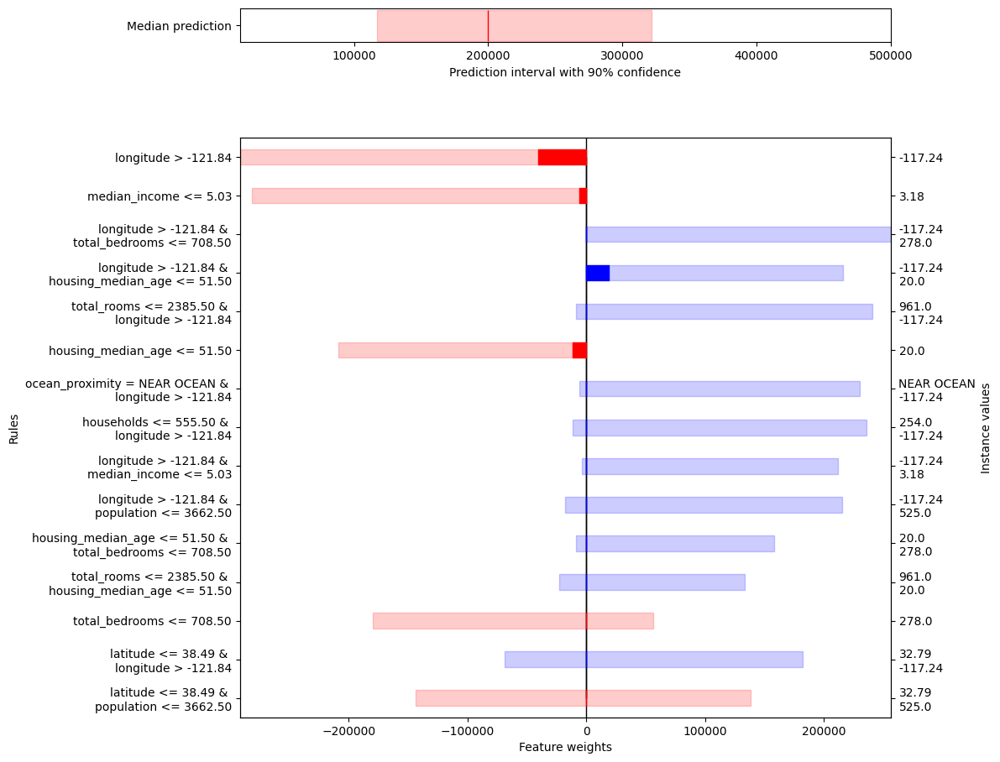

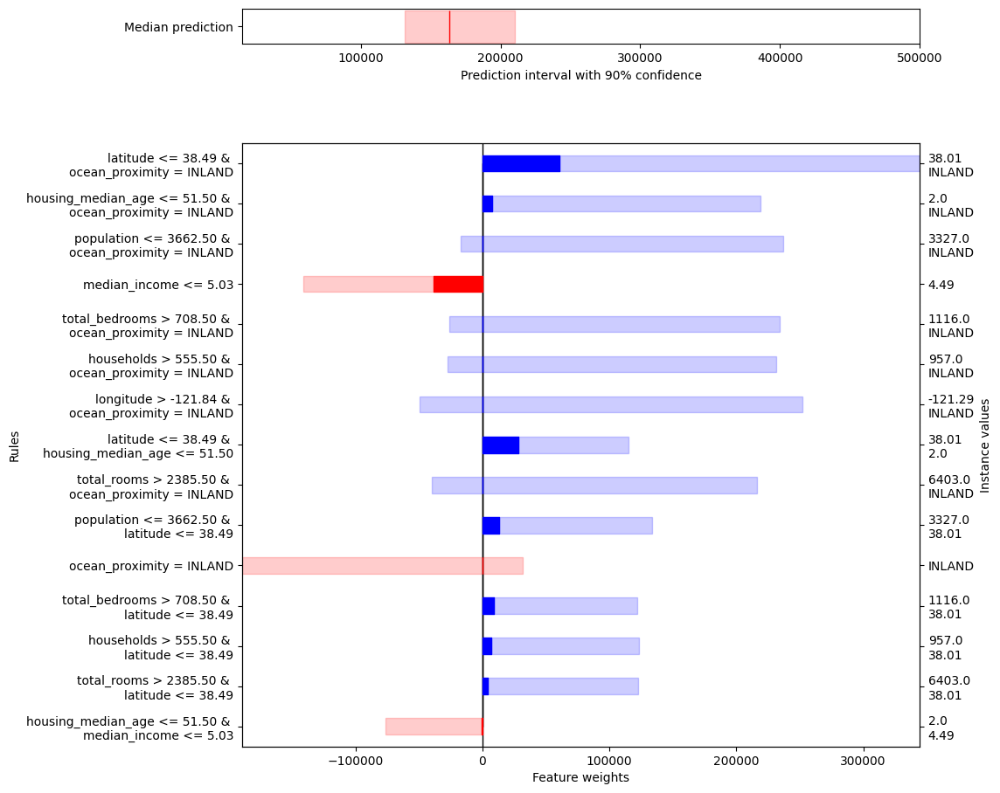

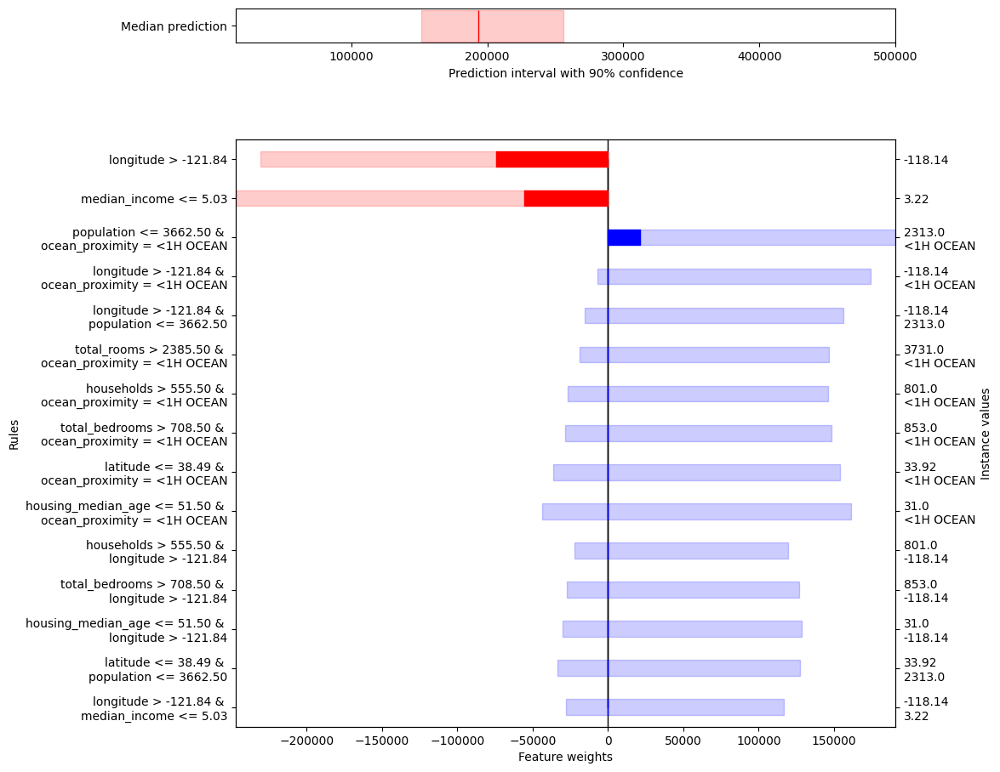

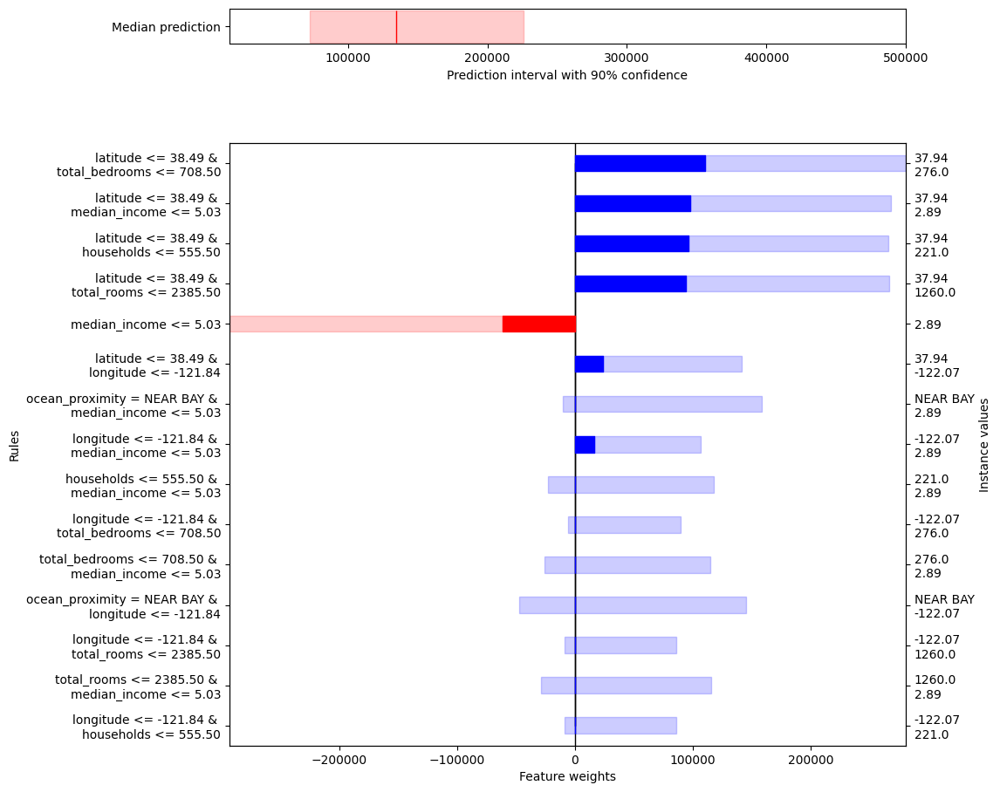

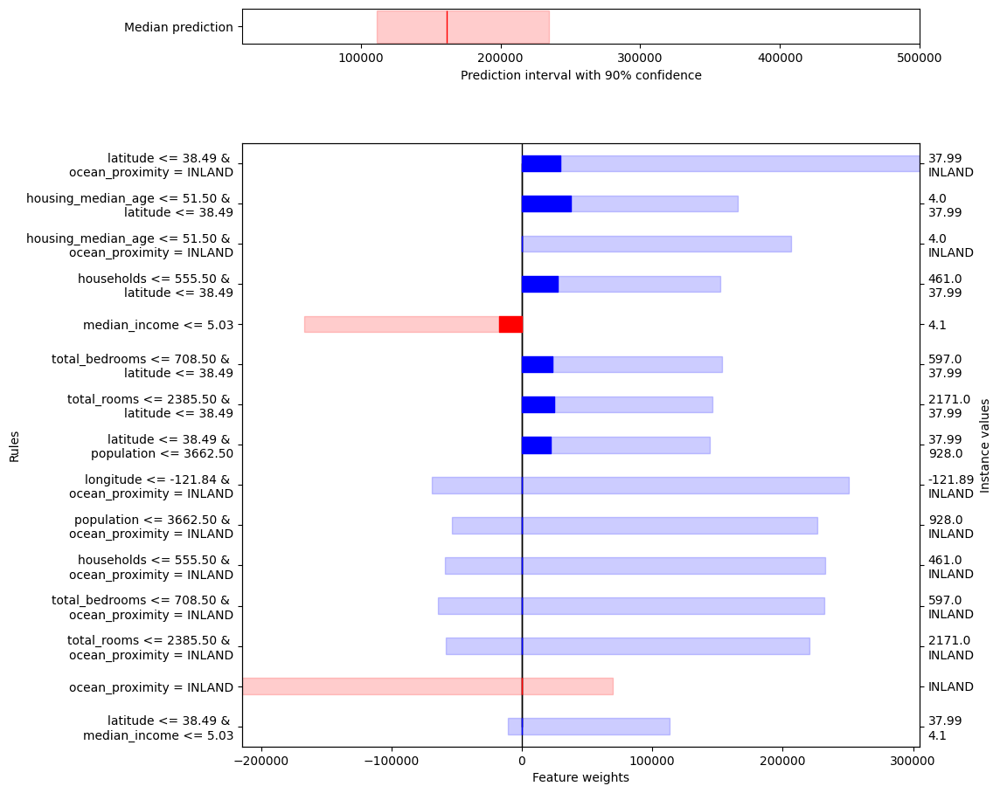

In [26]:
factual_explanation.plot(uncertainty=True, filter_top=15)

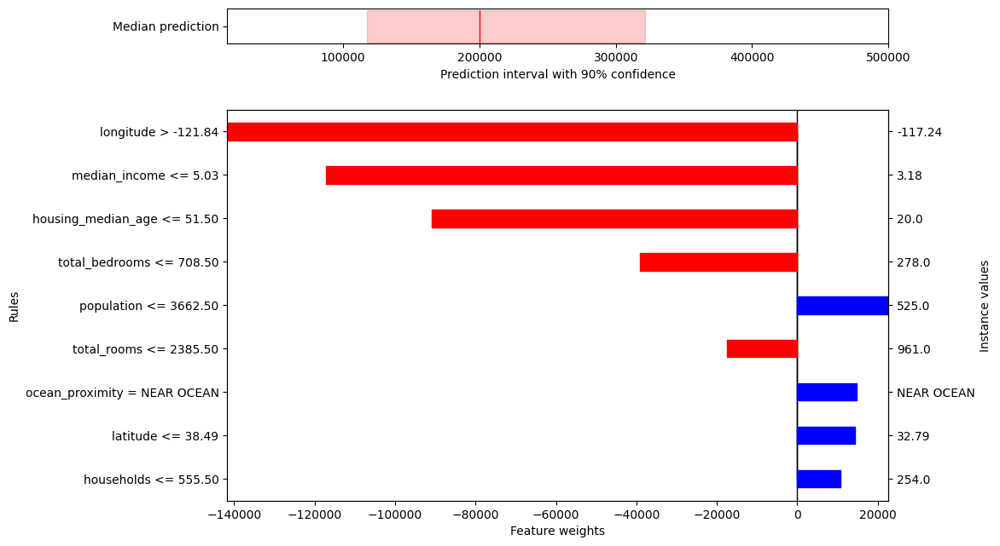

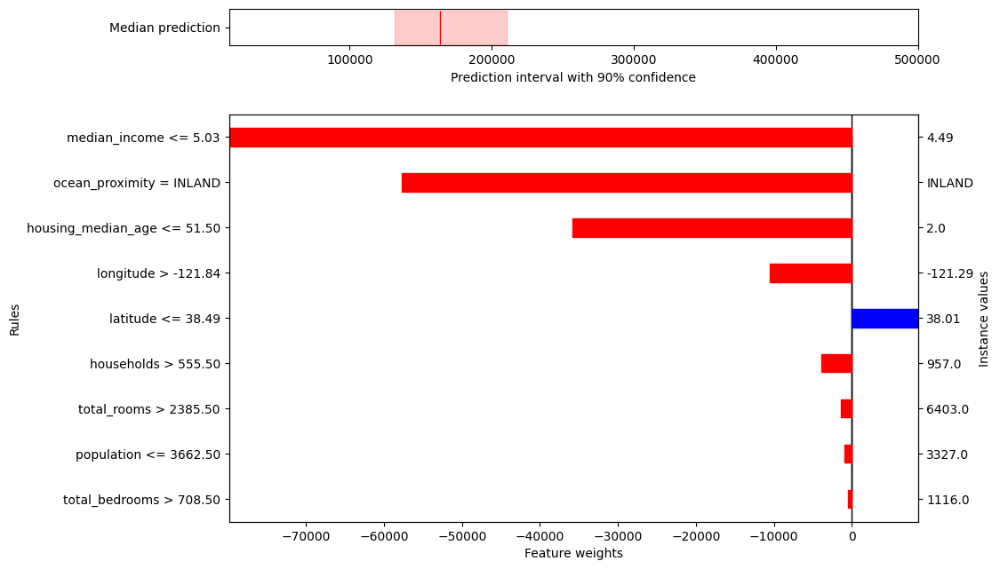

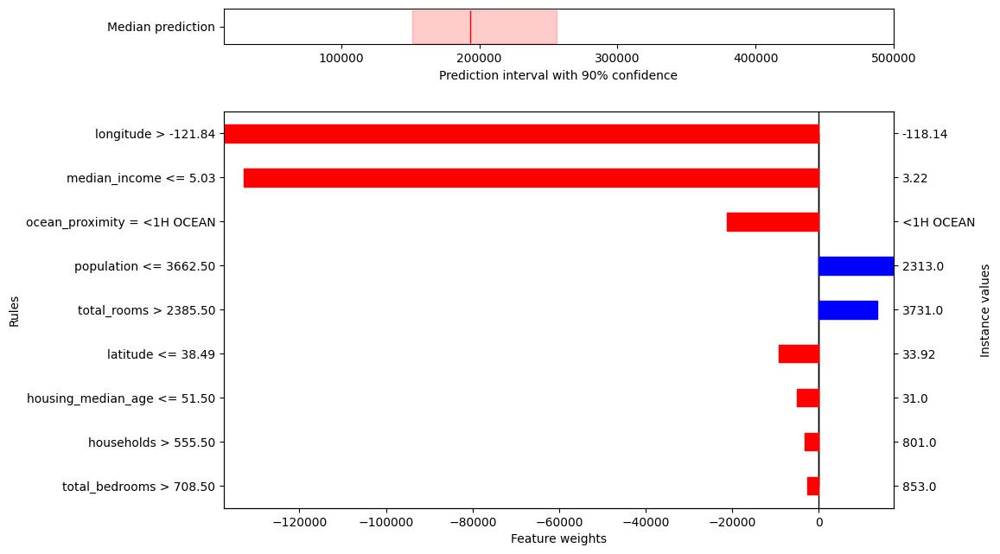

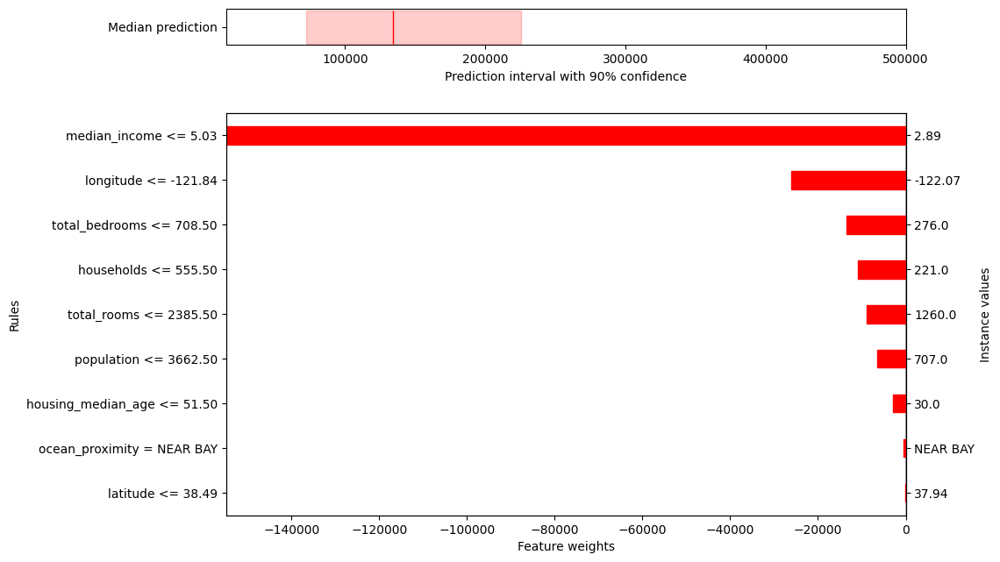

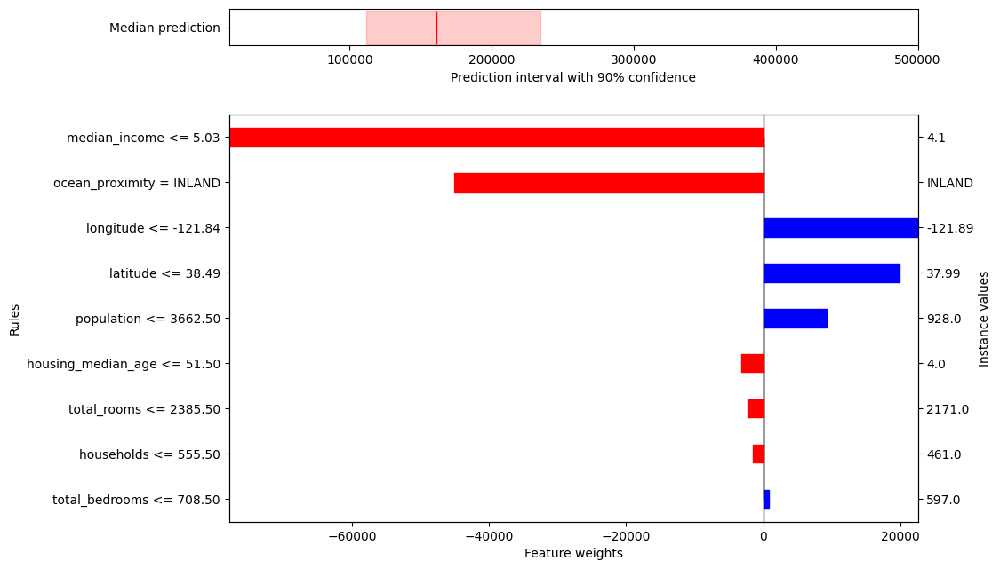

In [27]:
factual_explanation.remove_conjunctions()
factual_explanation.plot()

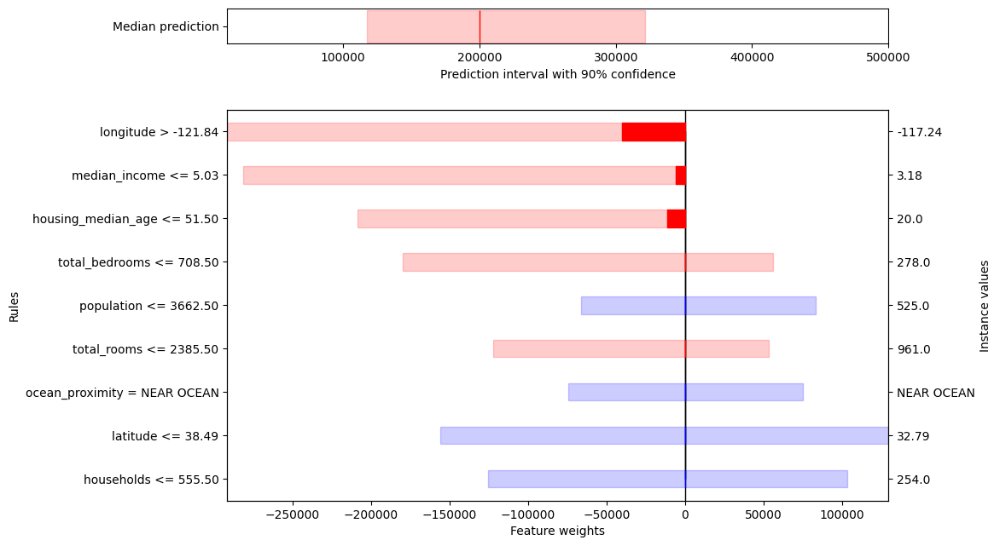

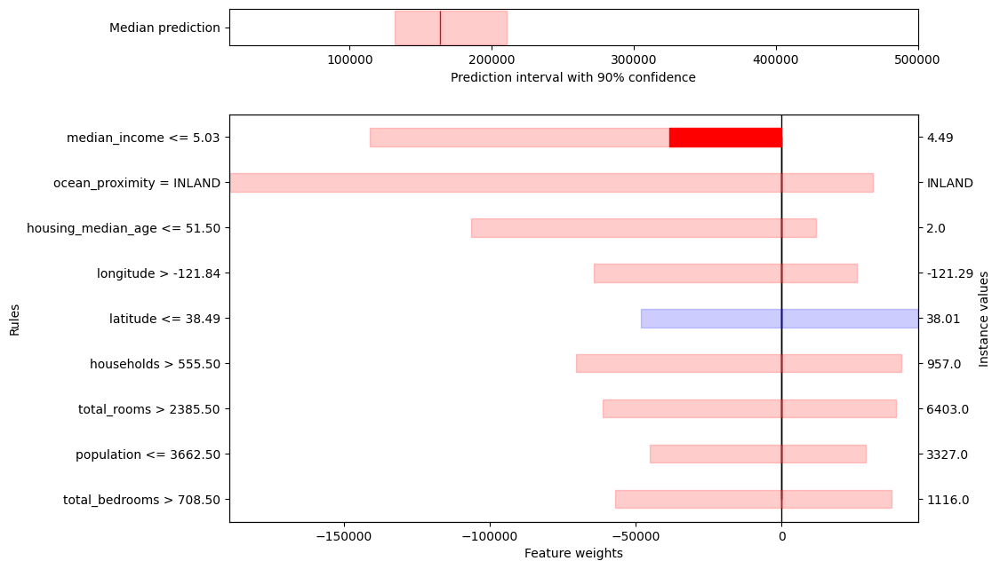

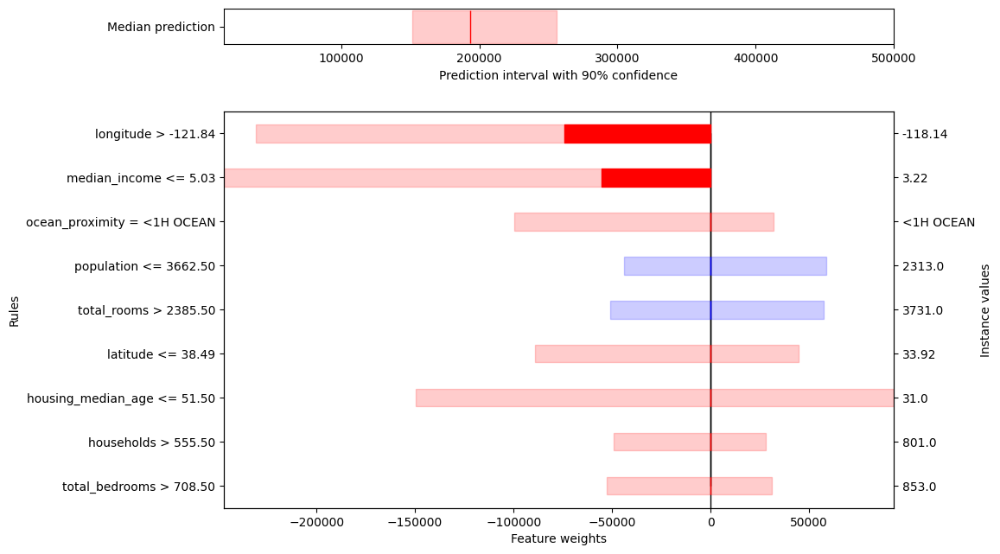

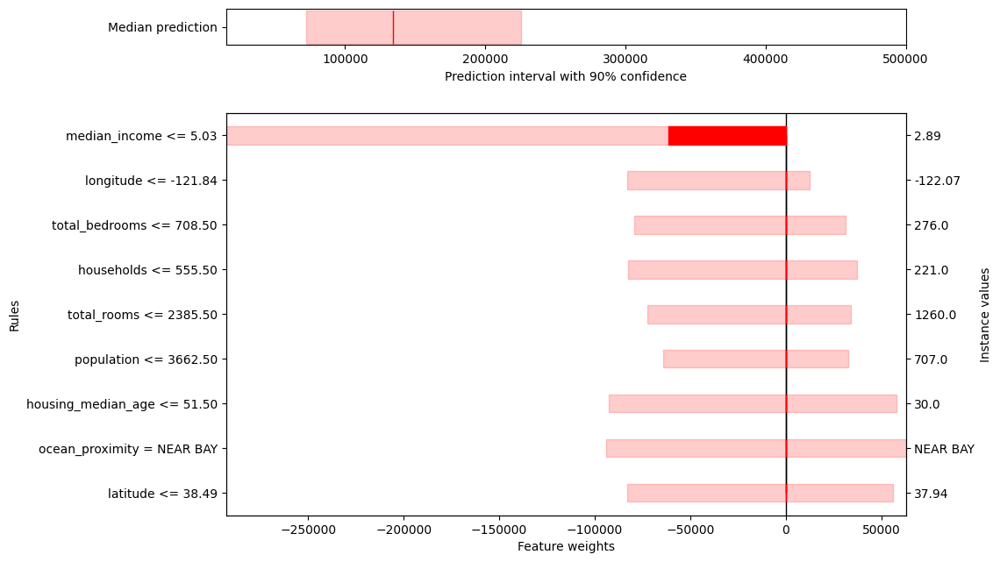

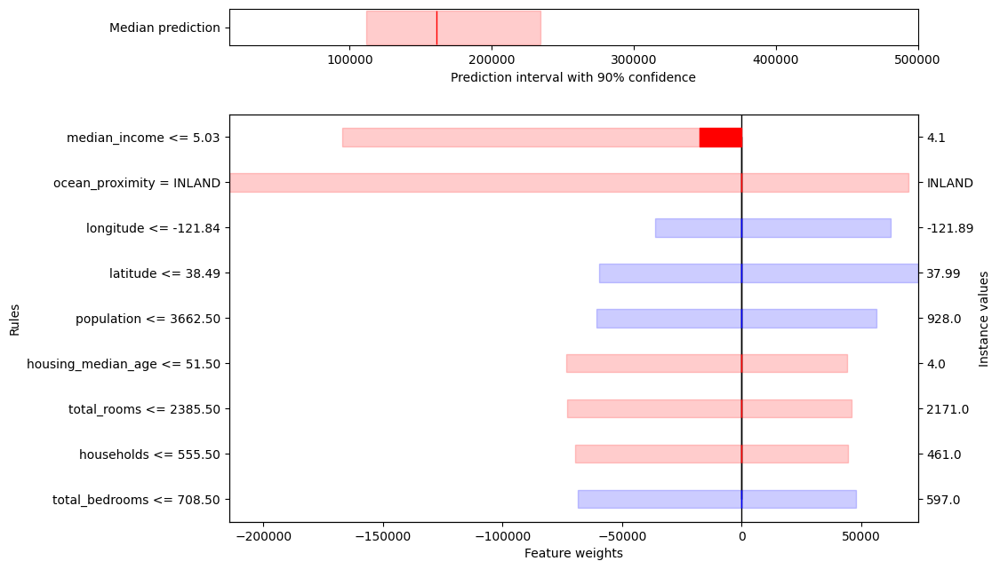

In [28]:
factual_explanation.plot(uncertainty=True)

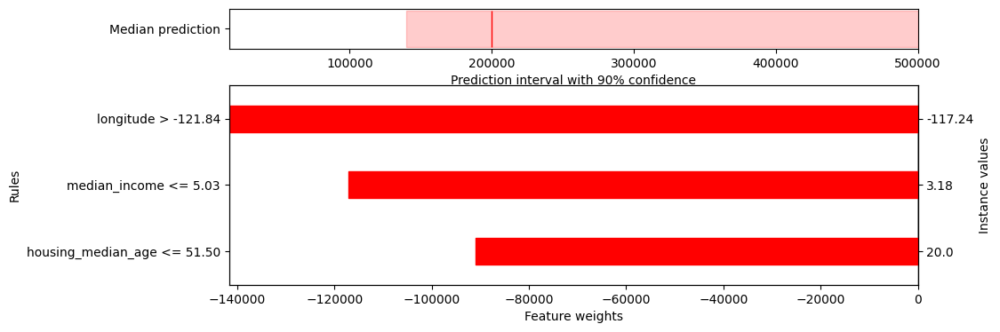

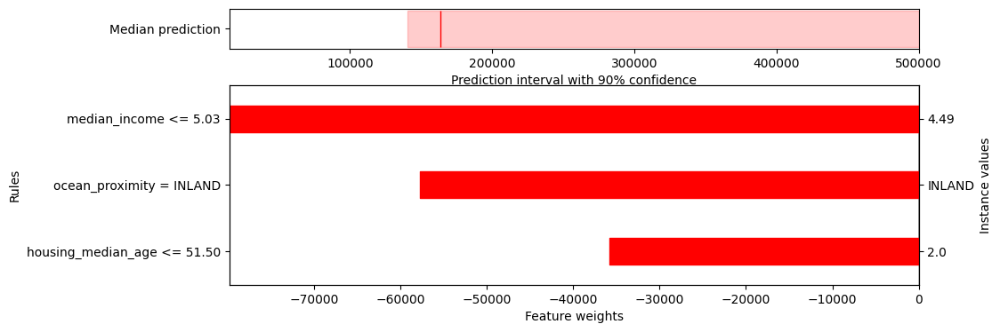

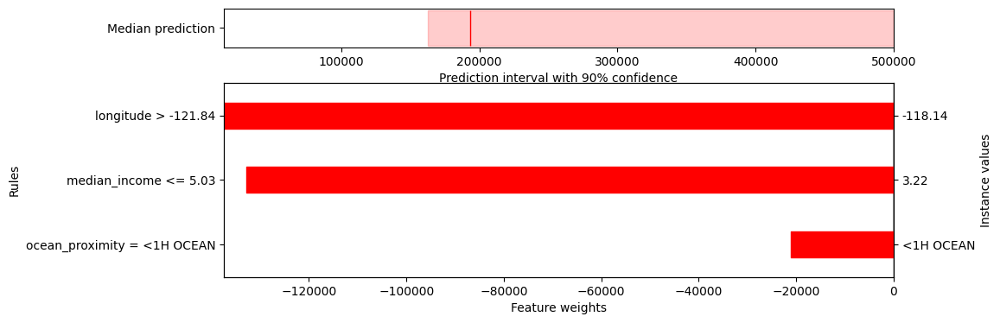

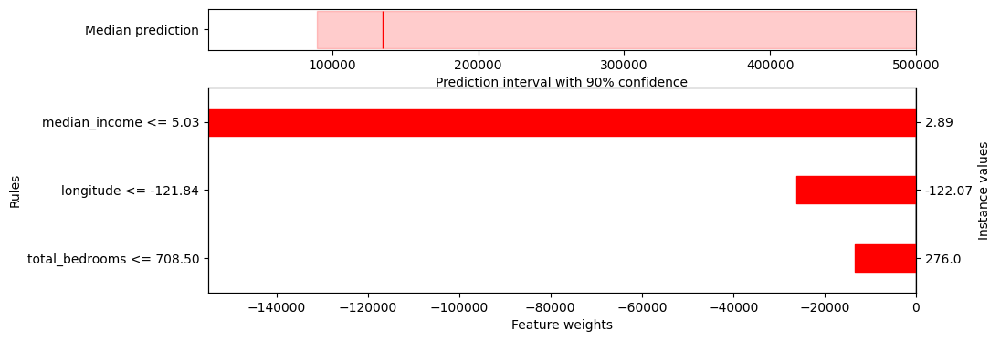

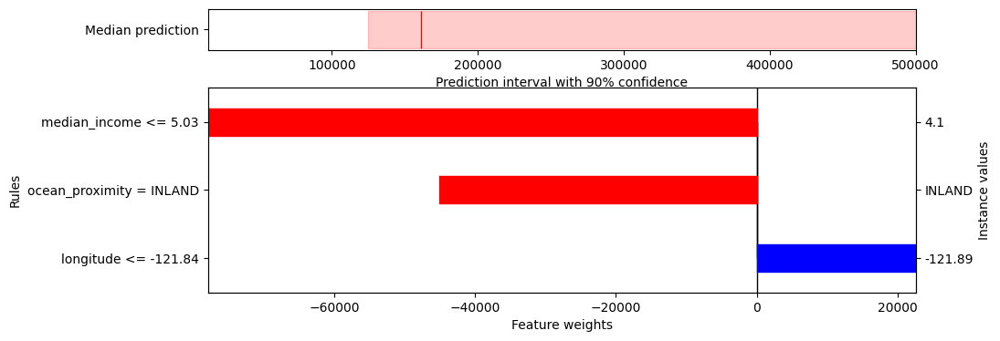

In [29]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osli)
factual_explanation.plot(filter_top=3)

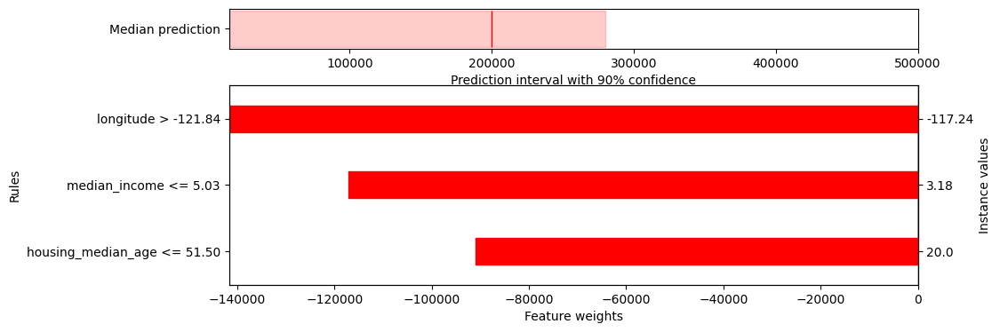

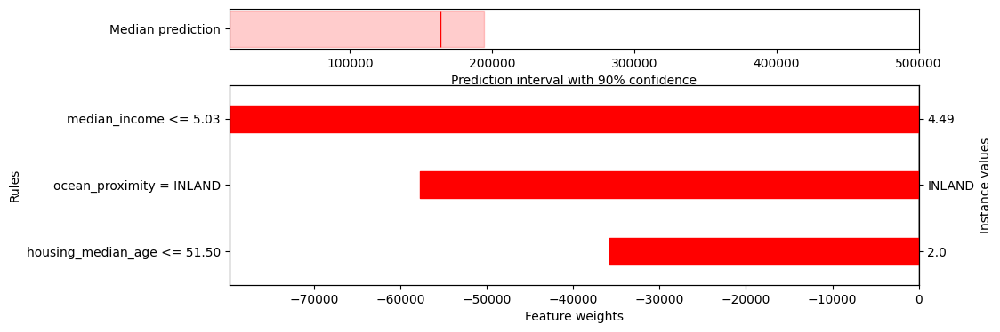

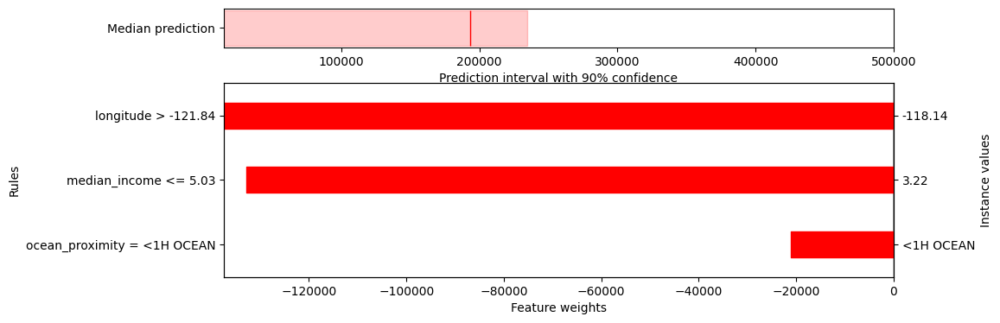

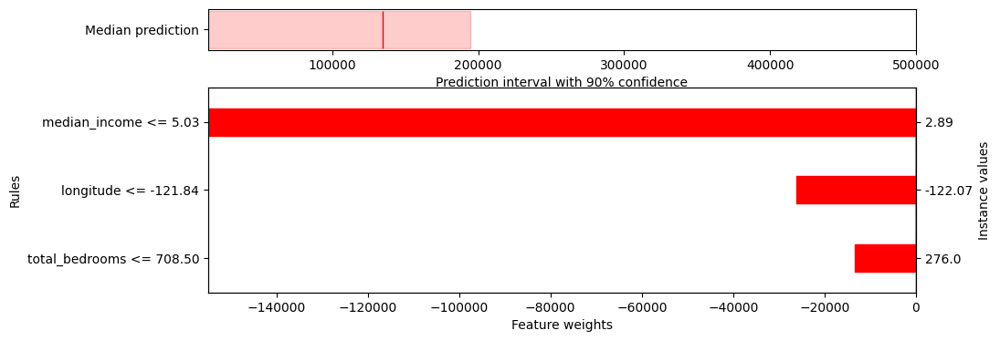

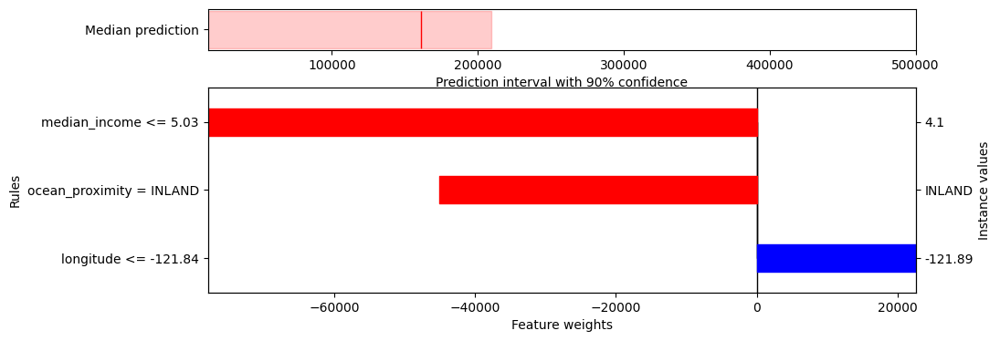

In [30]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osui)
factual_explanation.plot(filter_top=3)

#### Normalized alternatives using knn 

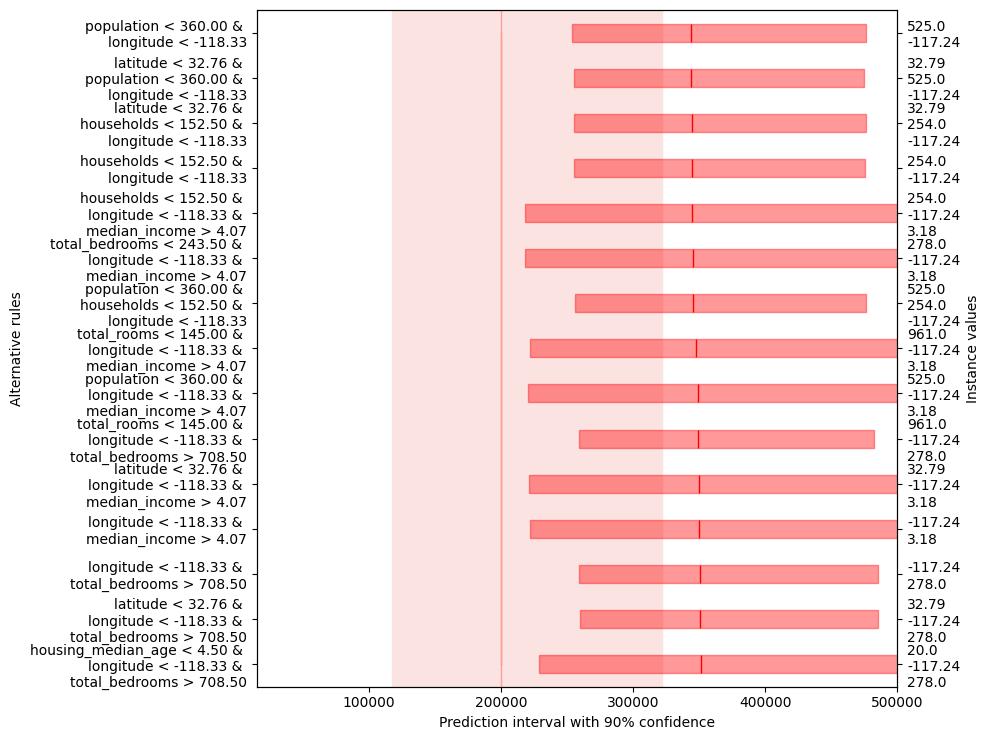

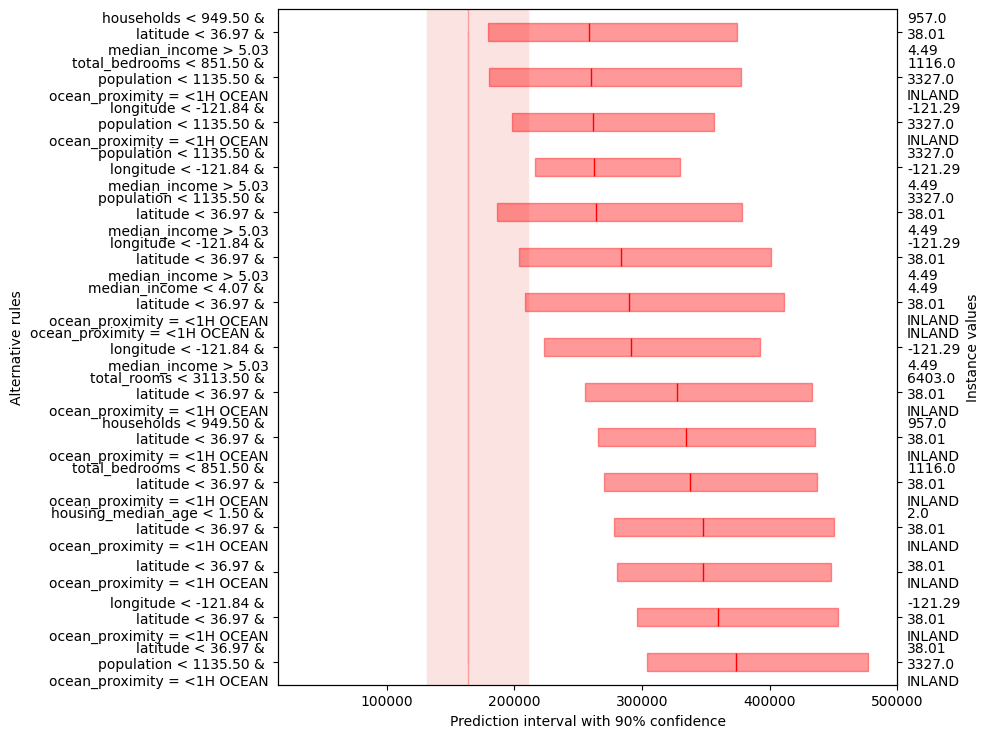

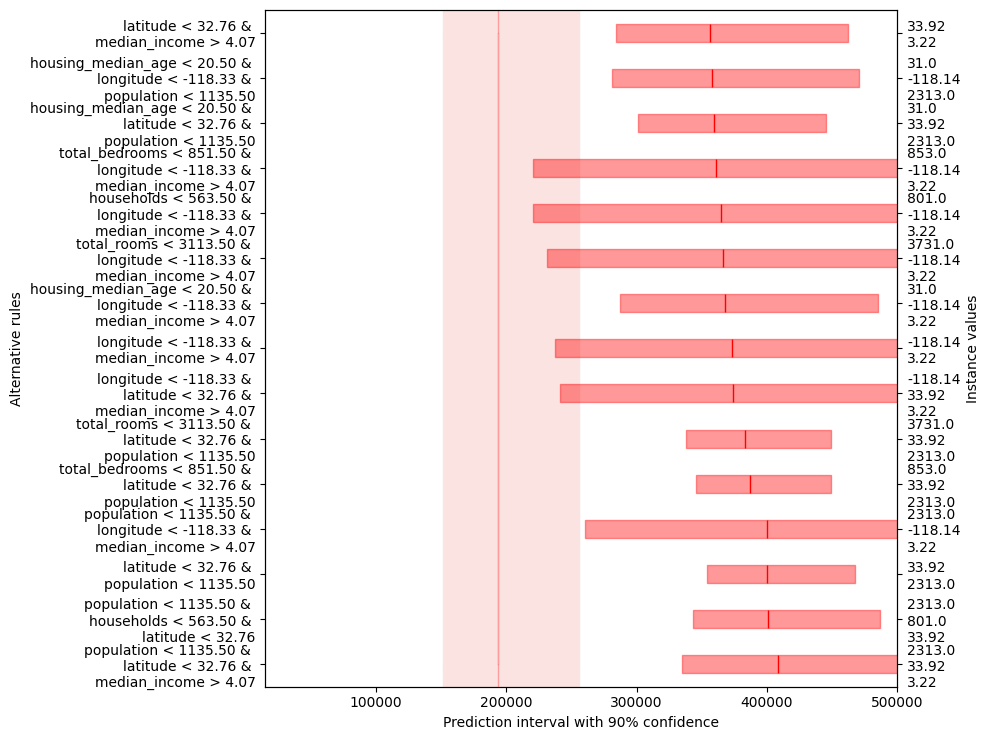

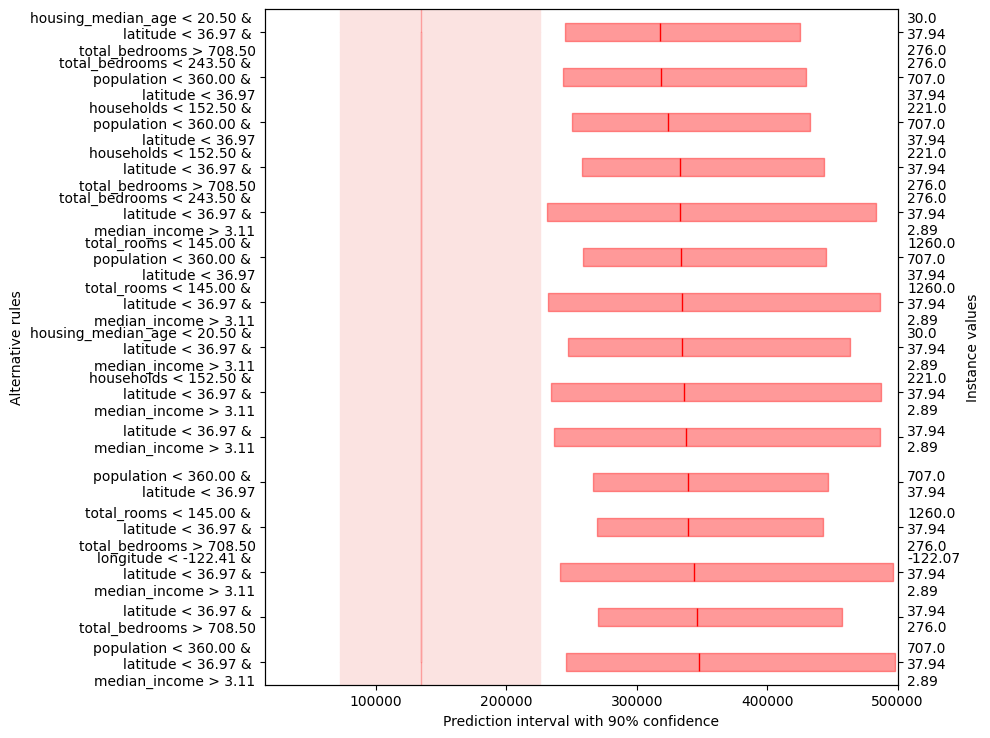

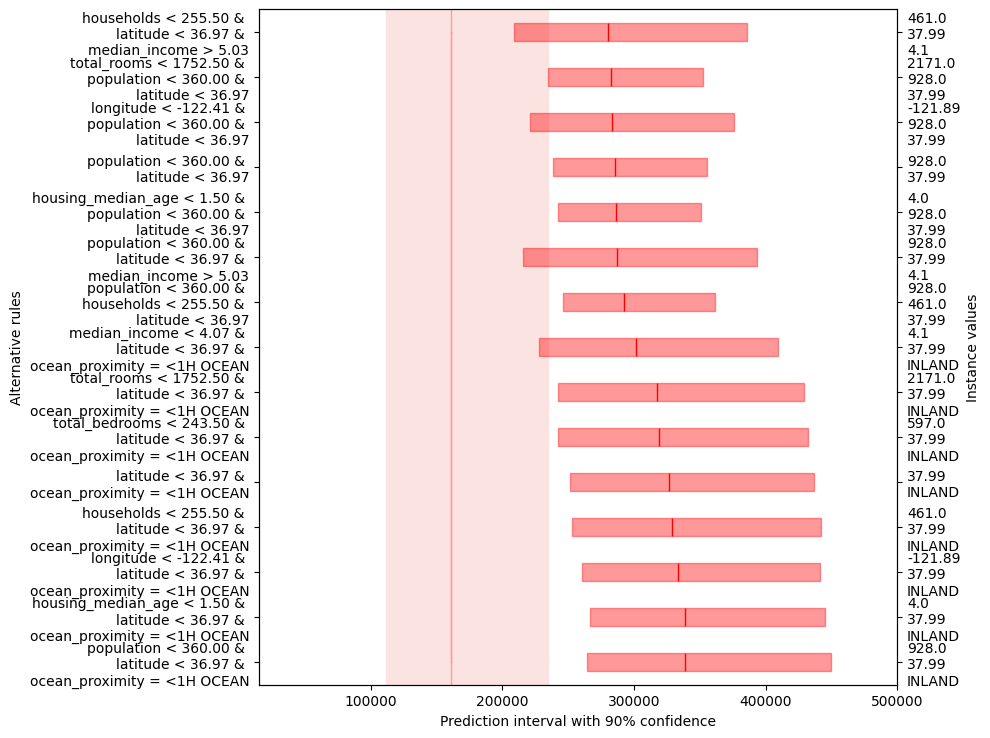

In [31]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=tsi)
alternative_explanation.add_conjunctions(n_top_features=5, max_rule_size=3).plot(filter_top=15, rnk_metric='uncertainty')


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 199779.109
Prediction Interval: [117308.391, 321539.069]

Alternatives to increase the Calibrated Prediction compared to 199779.109:
- If longitude < -118.33         then 342984.523 [253147.326, 475620.368]
- If housing_median_age > 20.50  then 262913.635 [205835.433, 347184.025]
- If median_income > 4.07        then 254458.369 [150971.859, 407246.092]
- If total_bedrooms > 708.50     then 238976.728 [143605.950, 379782.365]
- If latitude < 32.76            then 231650.229 [149179.511, 353410.189]
- If total_rooms > 1752.50       then 215774.995 [142681.852, 323689.880]
- If households < 152.50         then 203814.230 [117309.495, 331530.021]

Alternatives to decrease the Calibrated Prediction compared to 199779.109:
- If ocean_proximity = INLAND    then 162870.623 [112980.161, 236529.017]
- If population > 1121.50        then 177005.2

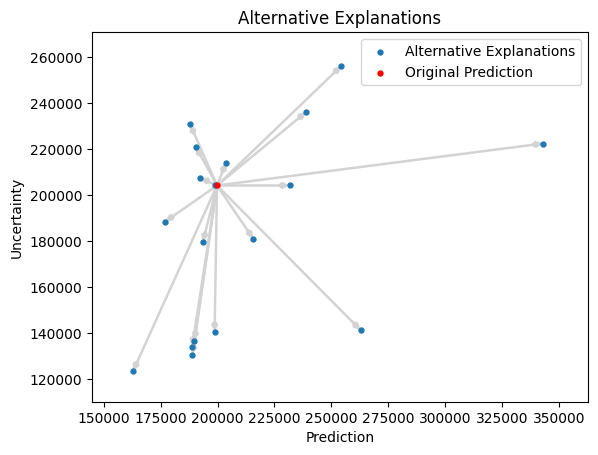


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 199779.109
Prediction Interval: [117308.391, 321539.069]

Alternatives to increase the Calibrated Prediction compared to 199779.109:
- If (population < 360.00 AND housing_median_age < 4.50 AND longitude < -118.33 AND total_bedrooms > 708.50)                                                                           then 352101.134 [229909.941, 532504.493]
- If (latitude < 32.76 AND population < 360.00 AND housing_median_age < 4.50 AND longitude < -118.33 AND total_bedrooms > 708.50)                                                      then 352078.065 [229659.841, 532816.614]
- If (population < 360.00 AND households < 152.50 AND housing_median_age < 4.50 AND longitude < -118.33 AND total_bedrooms > 708.50)                                                   then 351992.284 [228729.844, 533977.234]
- If (latitude < 32.76 AND population < 36

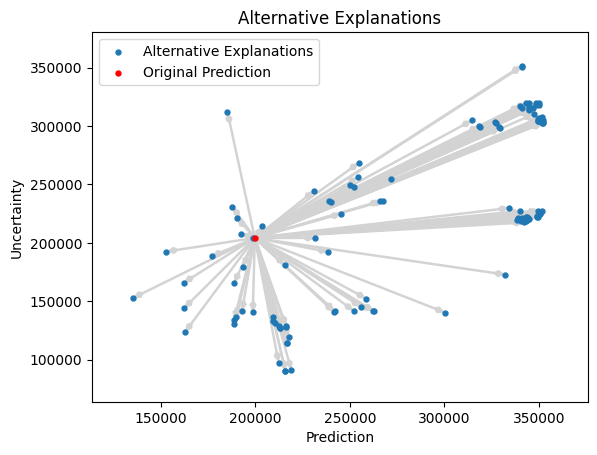

In [32]:
print(alternative_explanation[0].remove_conjunctions().to_narrative(expertise_level="advanced", output_format="text"))
alternative_explanation[0].plot(style="triangular")
print(alternative_explanation[0].add_conjunctions(max_rule_size=7).to_narrative(expertise_level="advanced", output_format="text"))
alternative_explanation[0].plot(style="triangular")

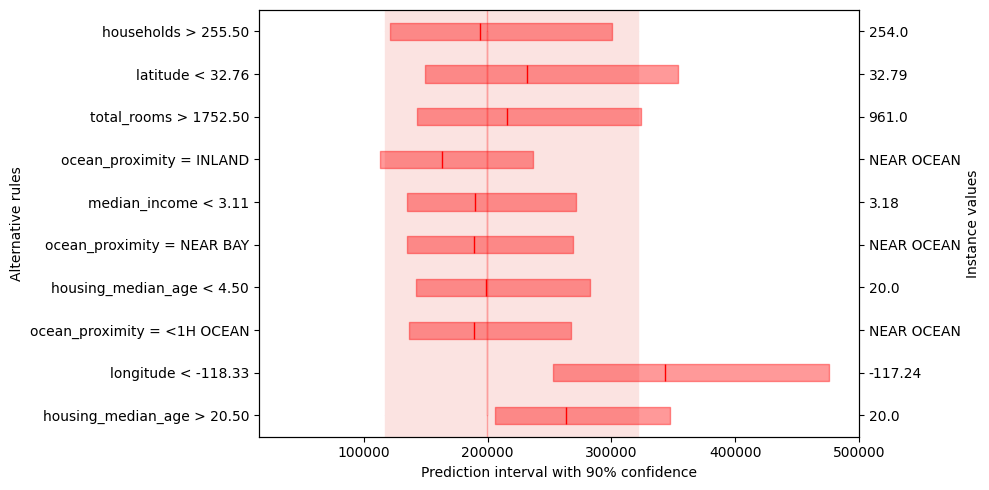

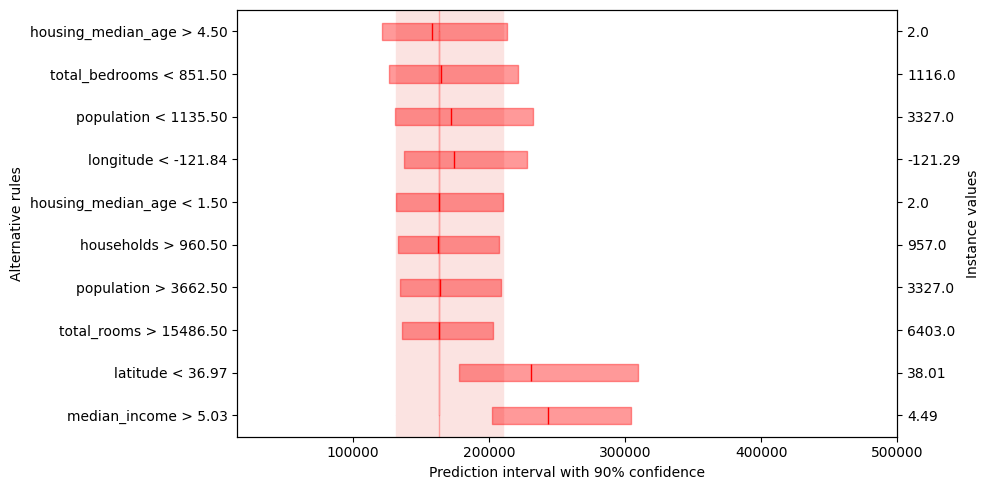

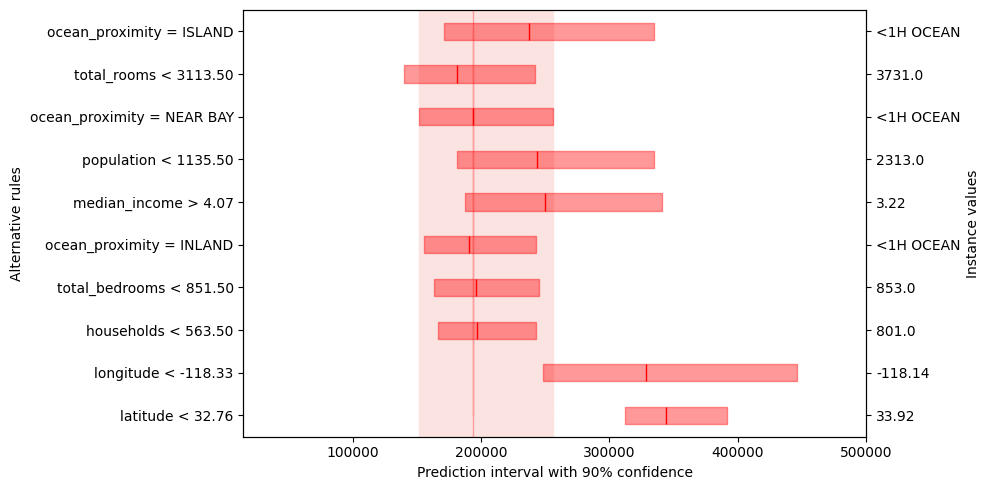

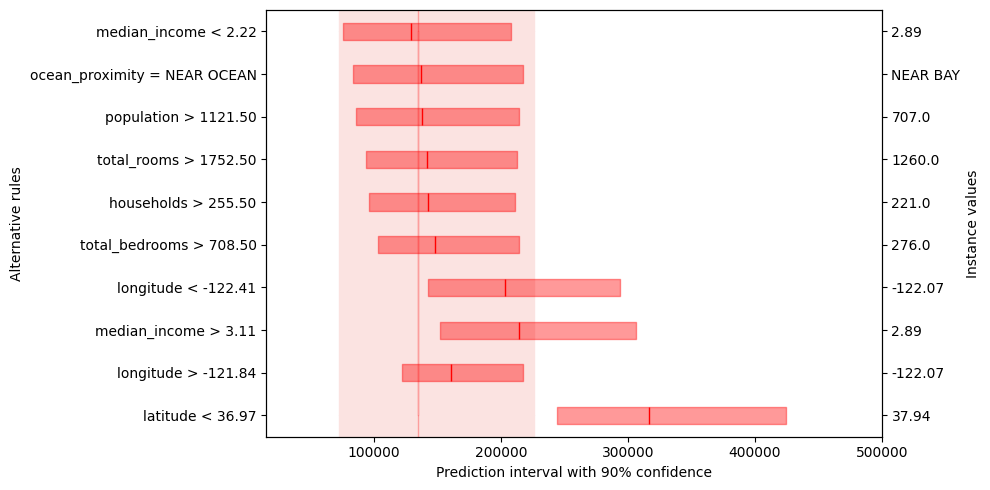

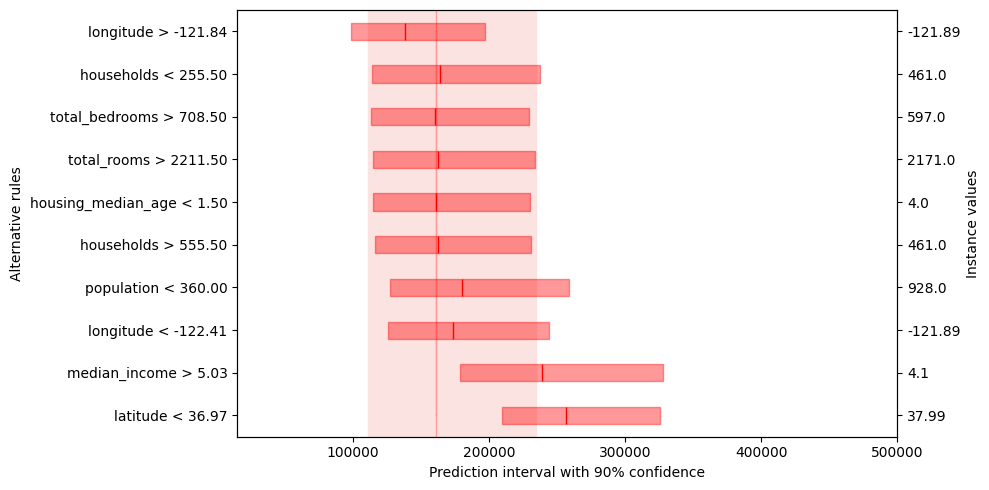

In [33]:
alternative_explanation.remove_conjunctions().plot()

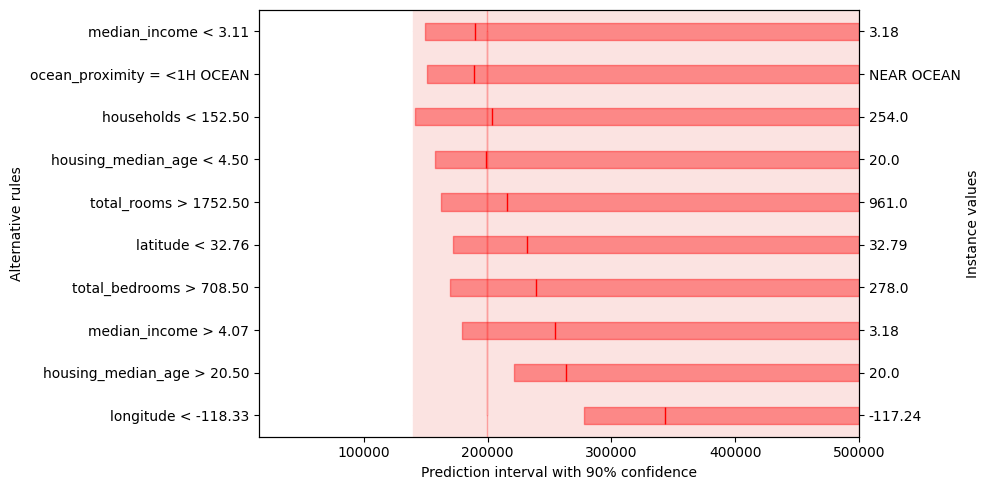

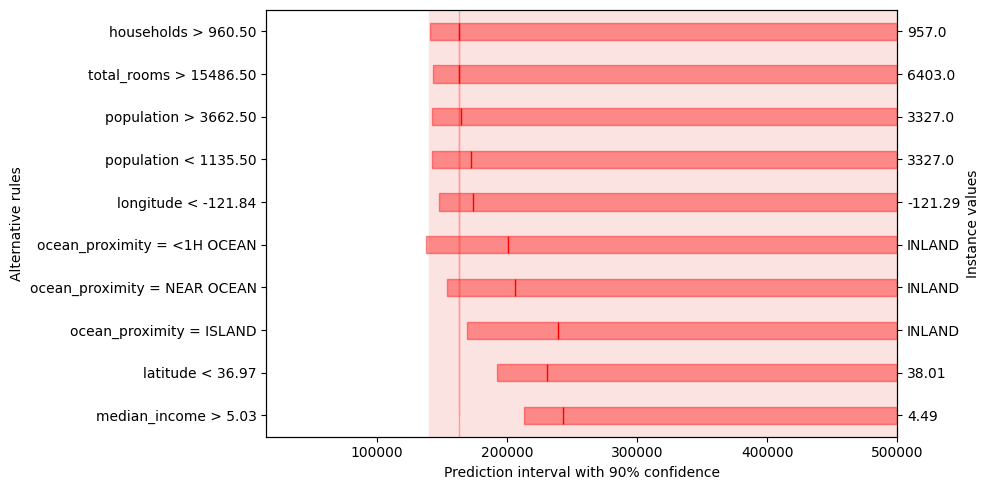

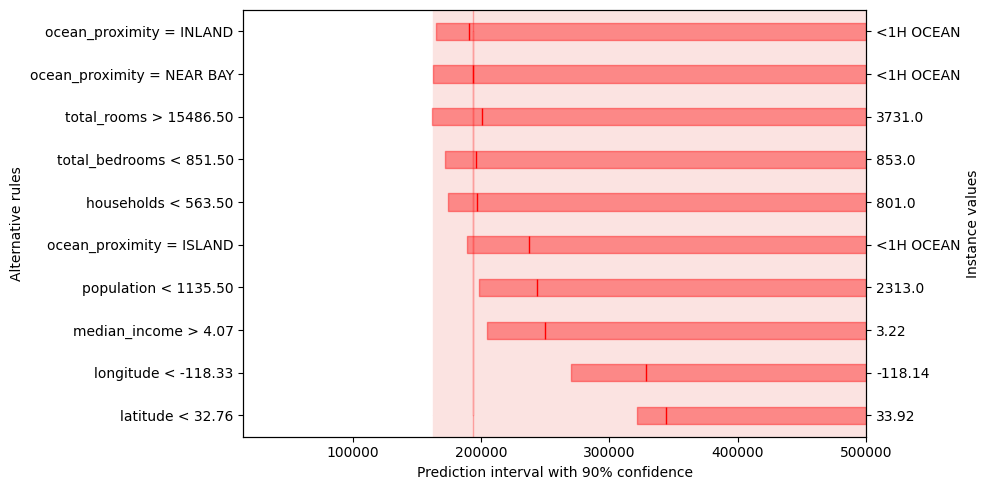

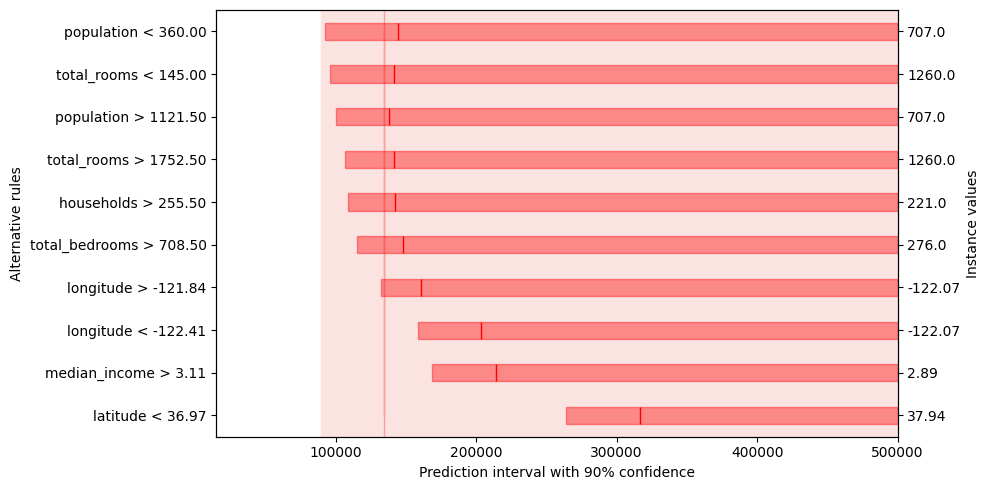

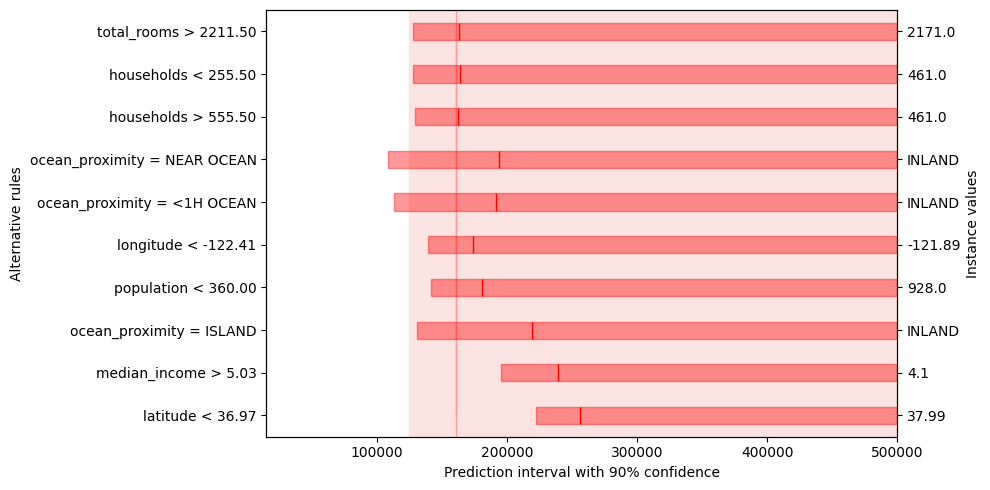

In [34]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osli)
alternative_explanation.plot()

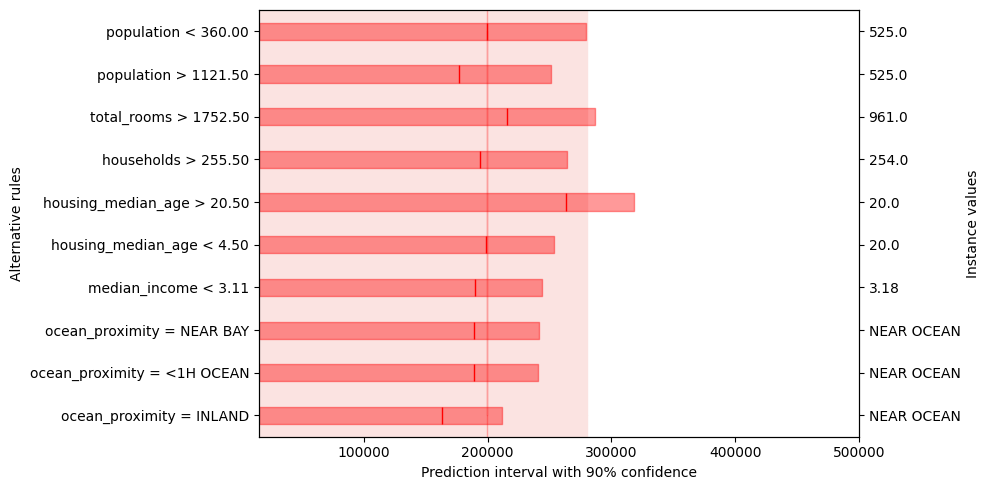

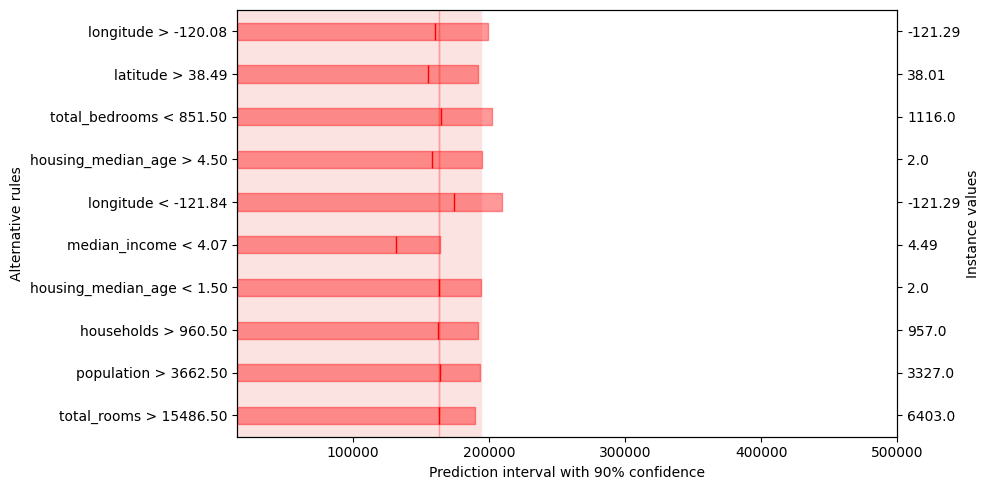

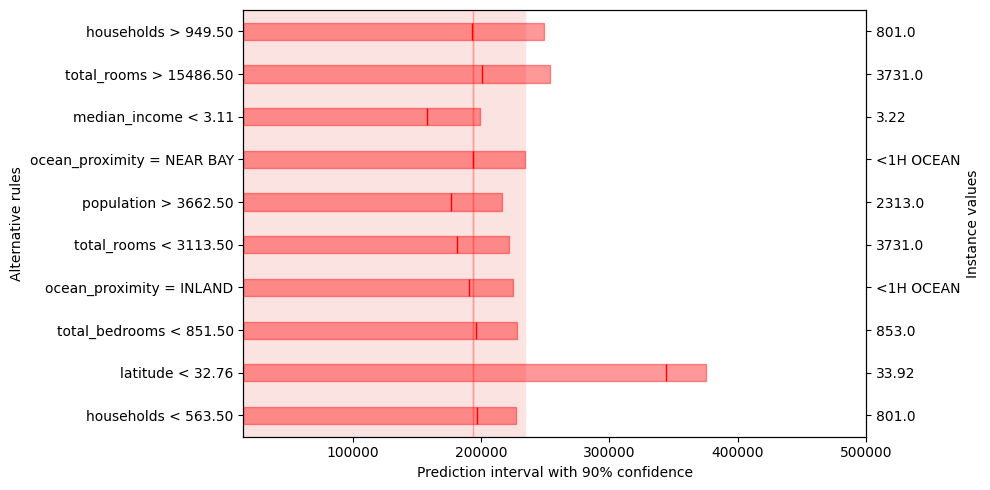

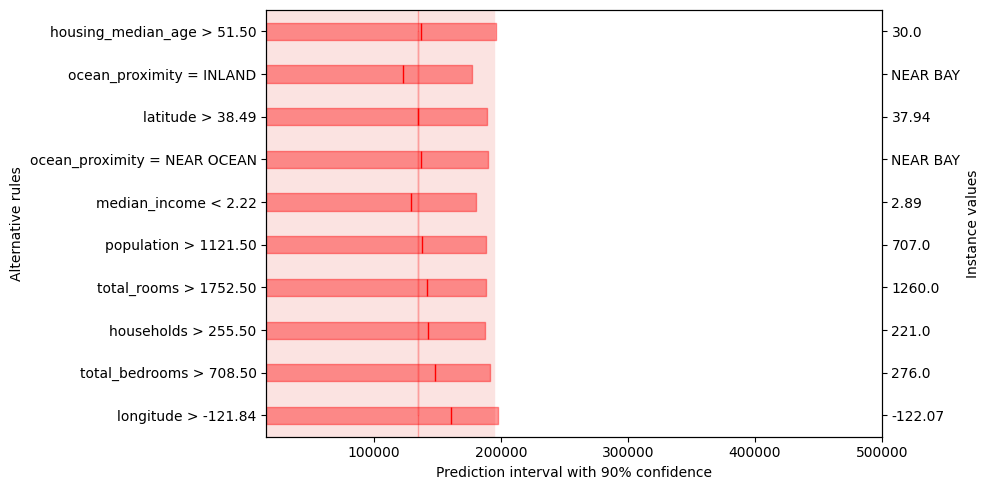

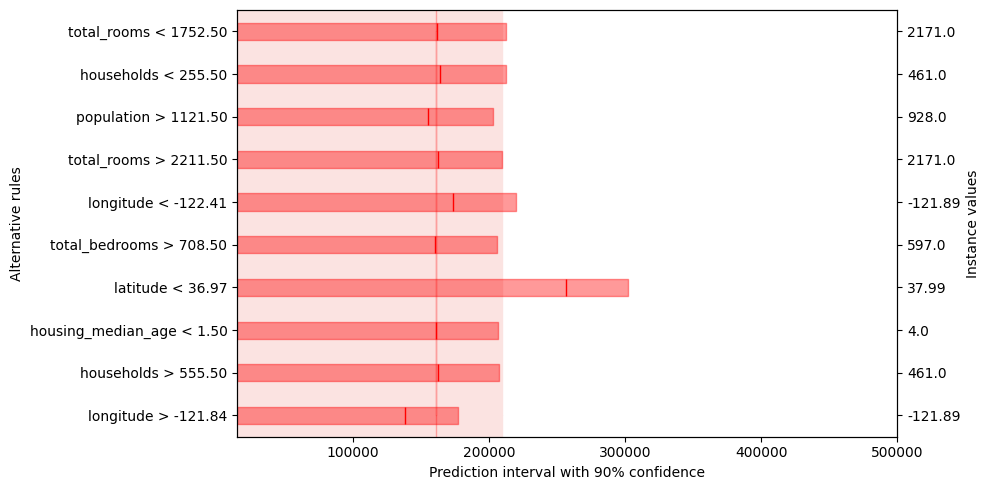

In [35]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osui)
alternative_explanation.plot()

#### Normalized explanations using variance

In [36]:
ce.set_difficulty_estimator(DifficultyEstimator().fit(X=X_prop_train, learner=model, scaler=True))

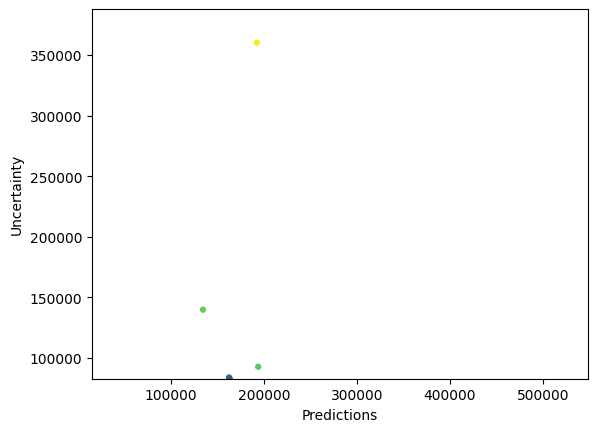

In [37]:
ce.plot(x_test, y_test, style="triangular")

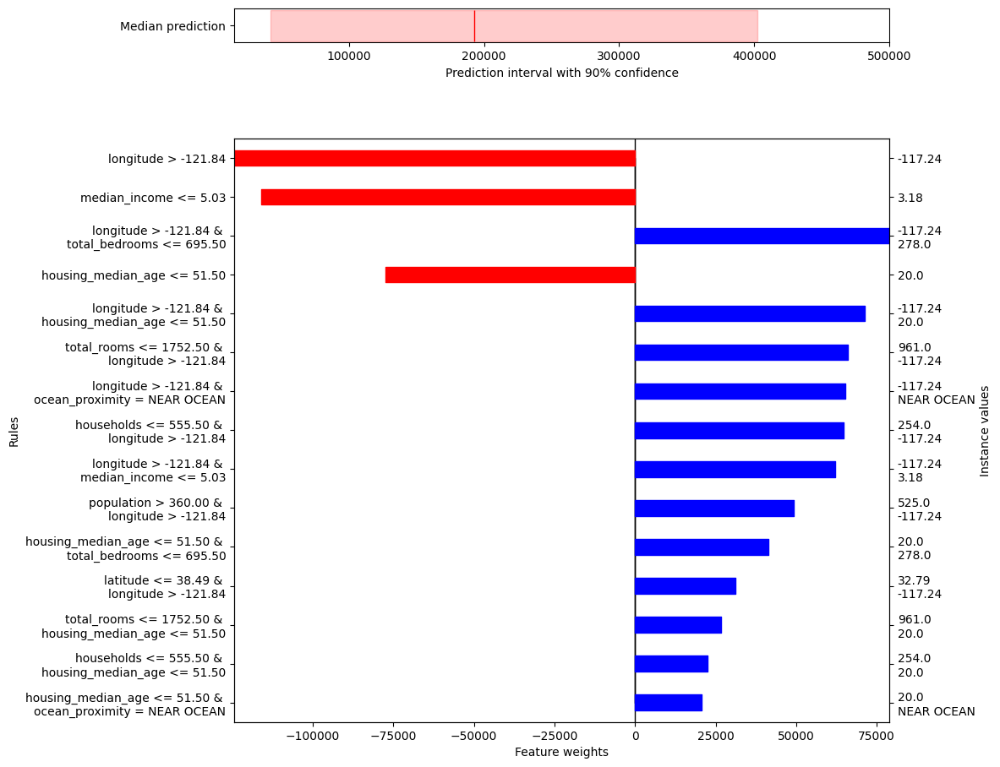

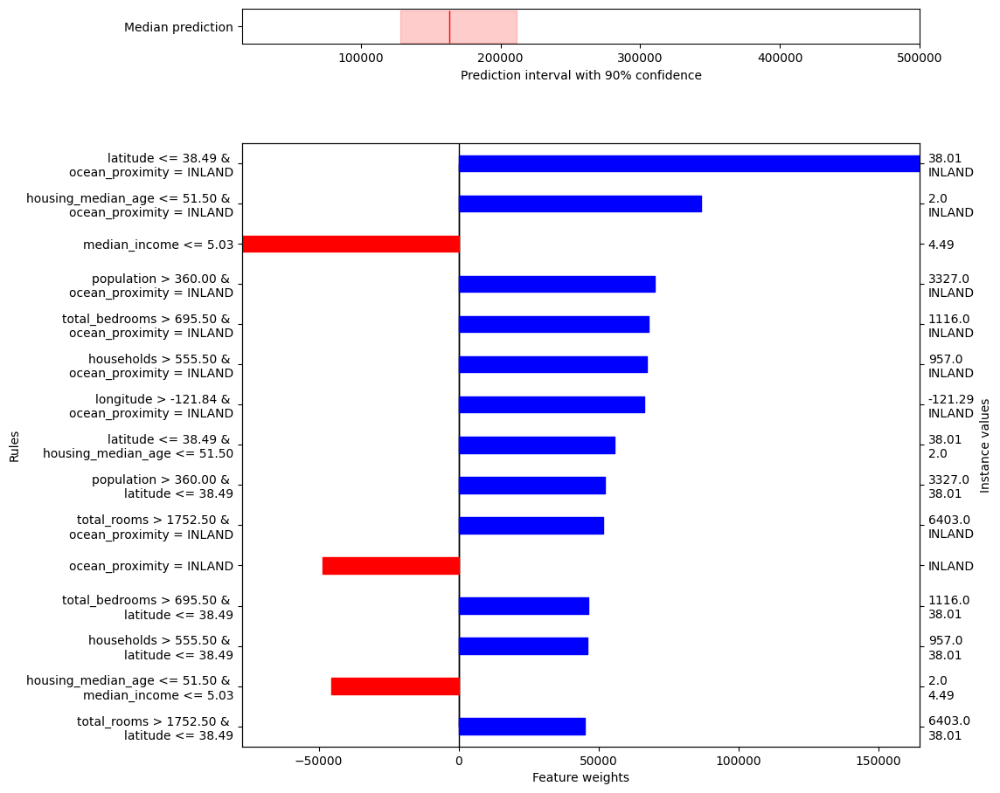

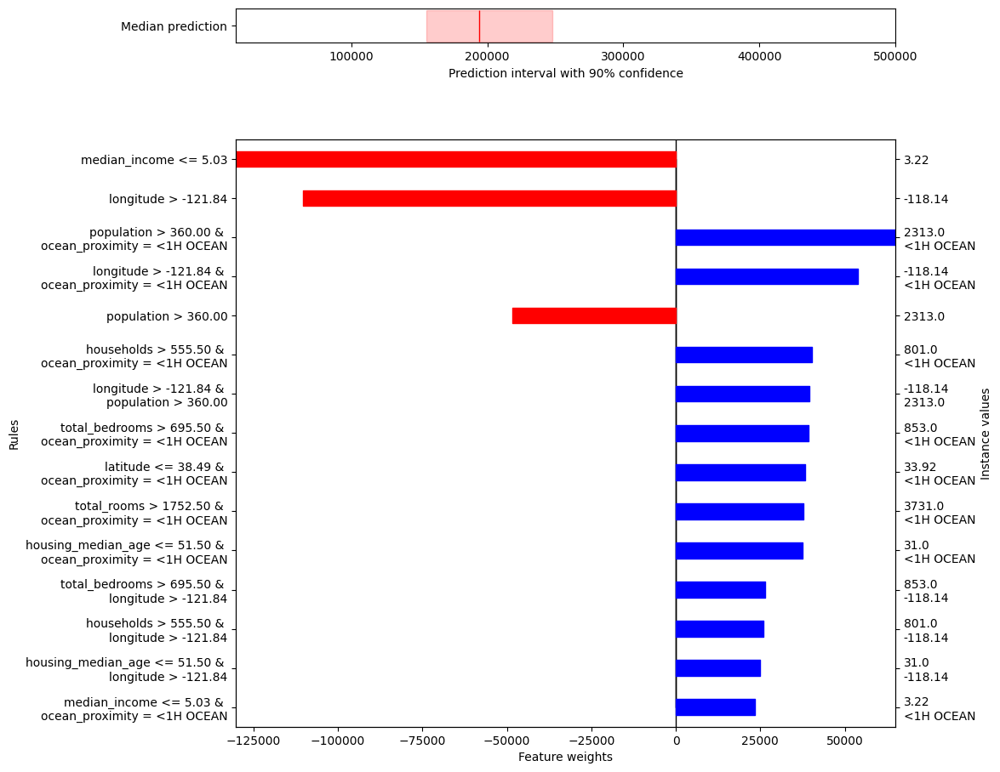

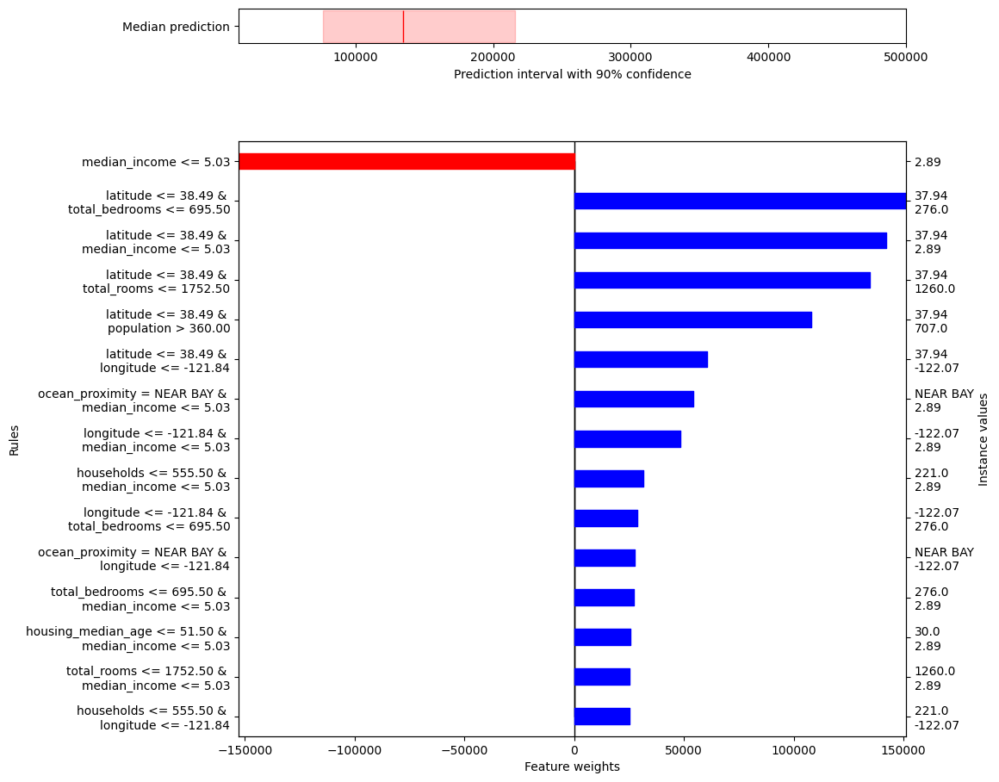

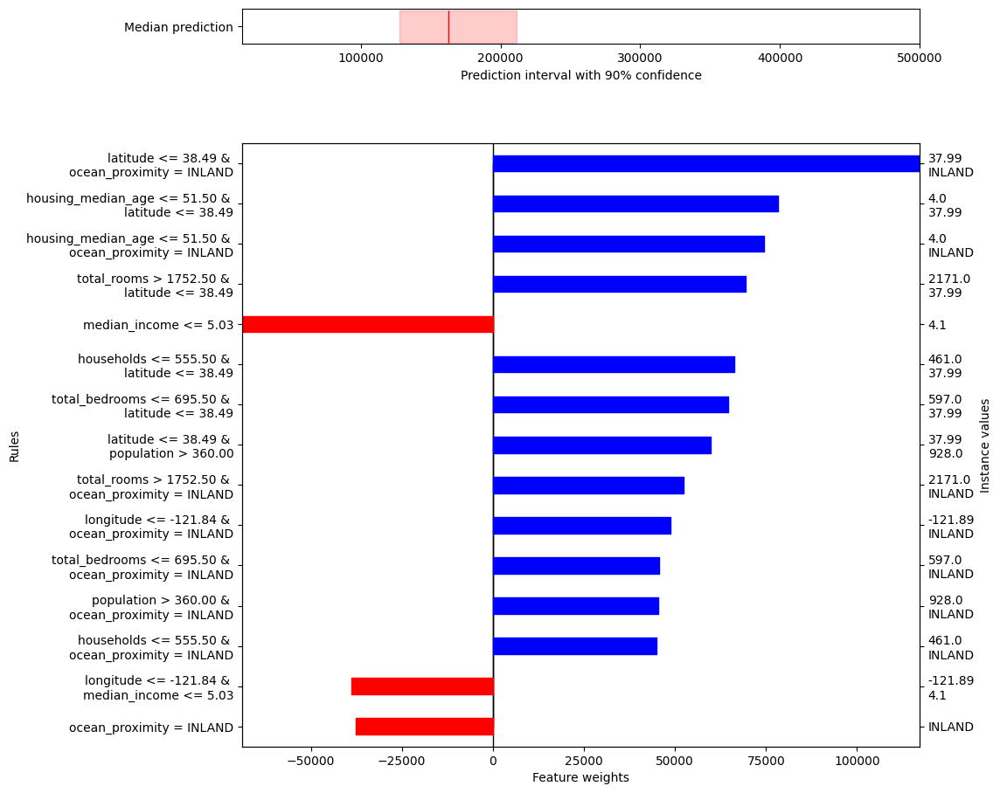

In [38]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=tsi)
factual_explanation.add_conjunctions(n_top_features=5)
factual_explanation.plot(filter_top=15)

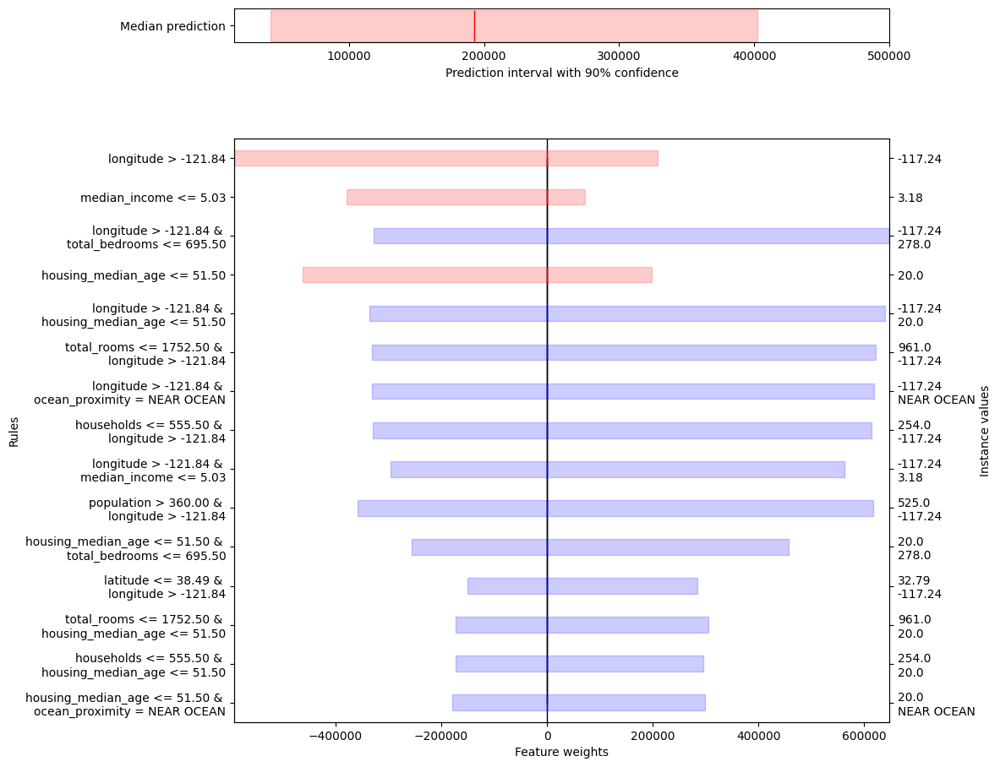

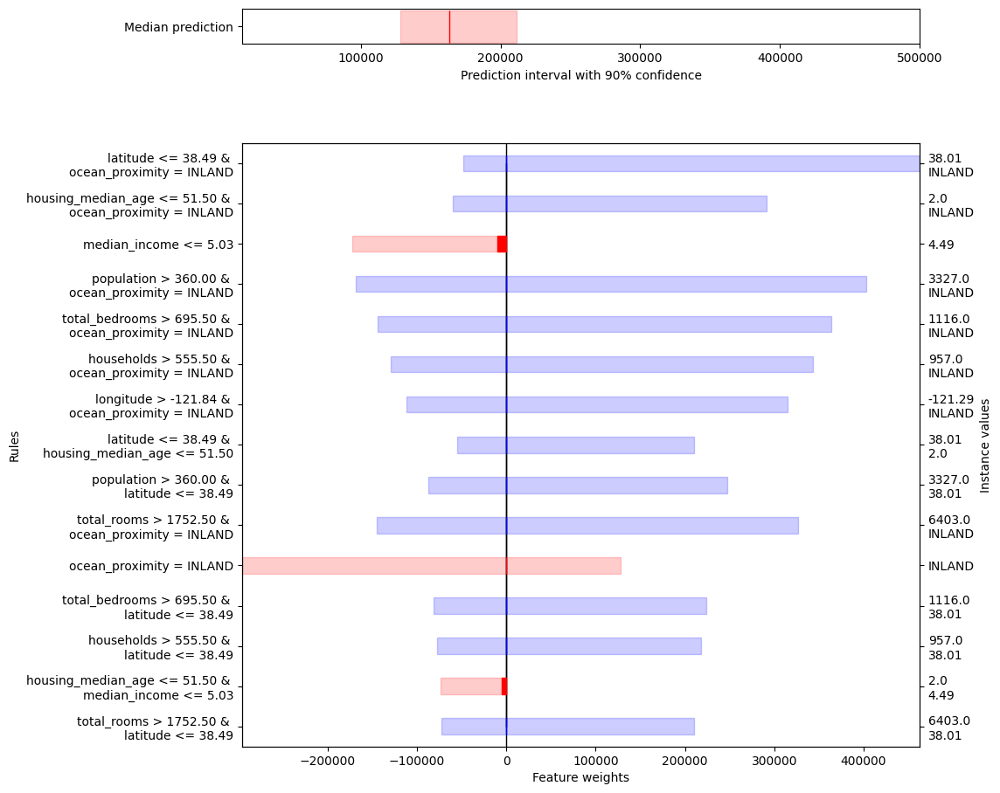

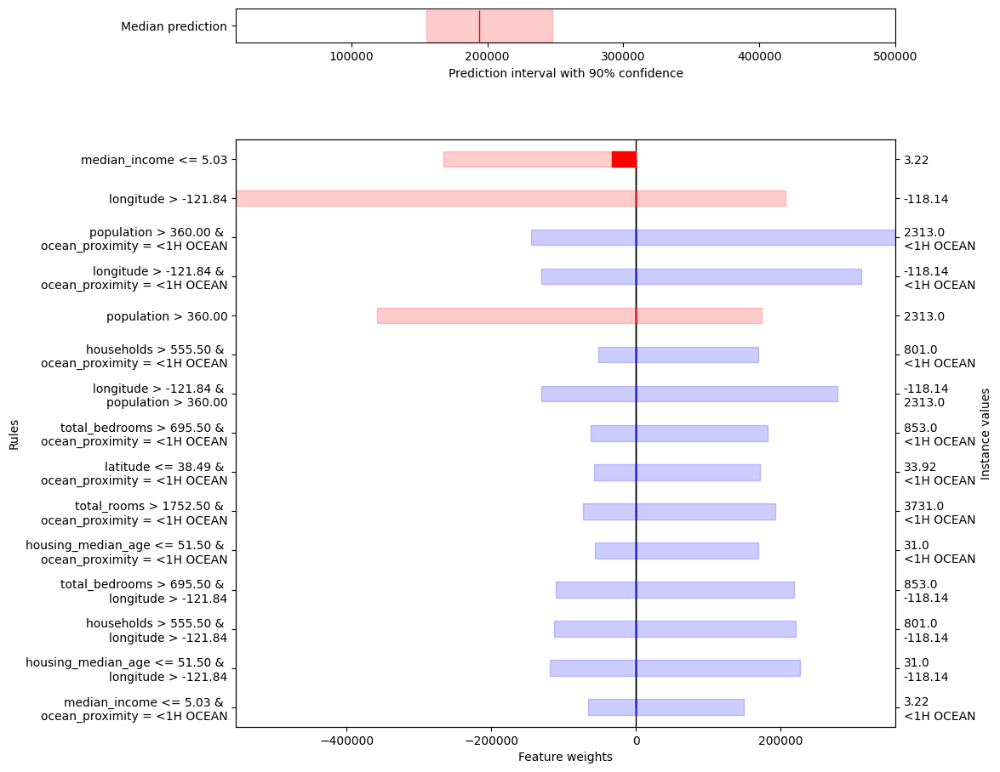

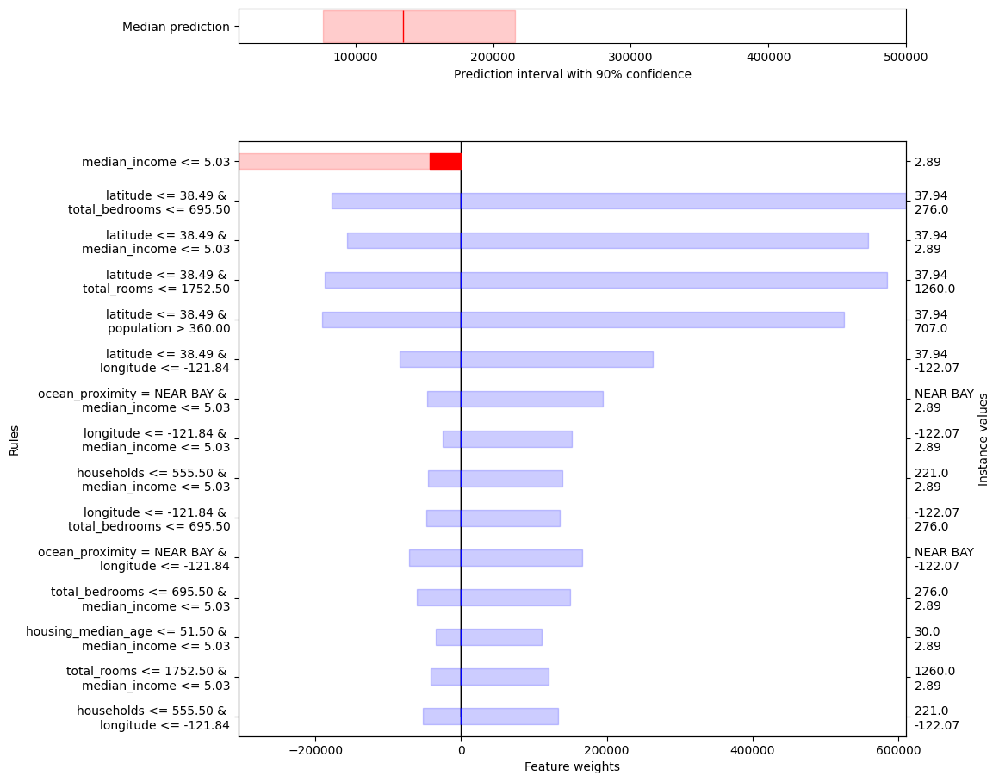

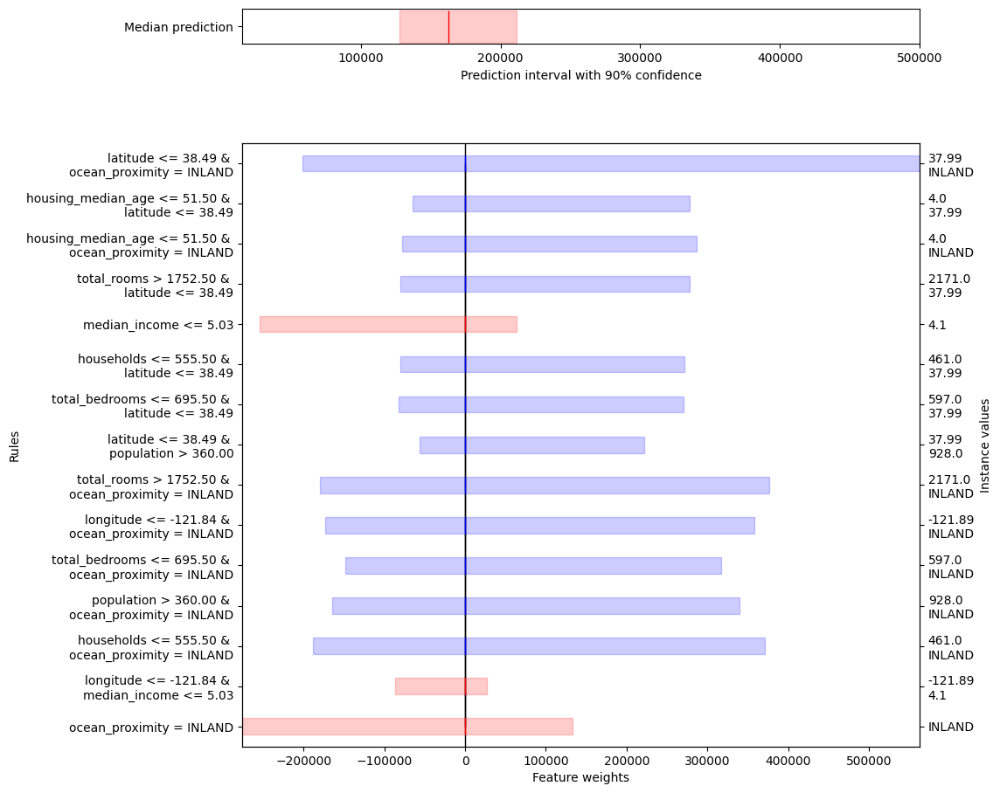

In [39]:
factual_explanation.plot(uncertainty=True, filter_top=15)

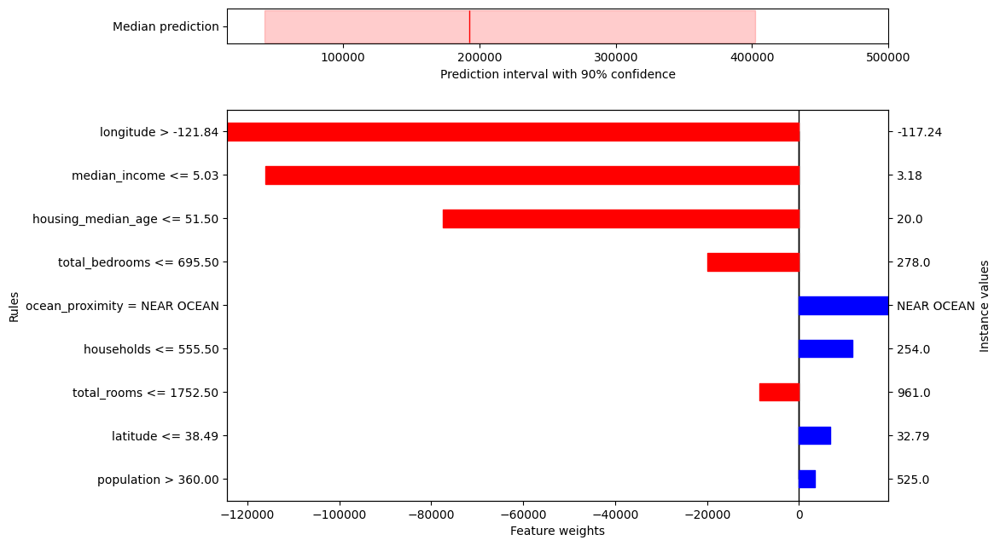

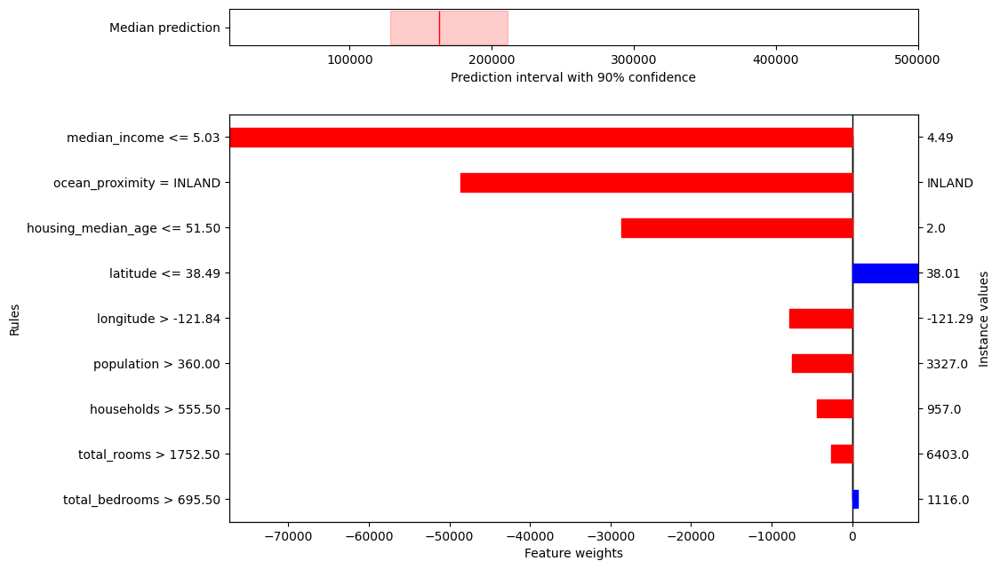

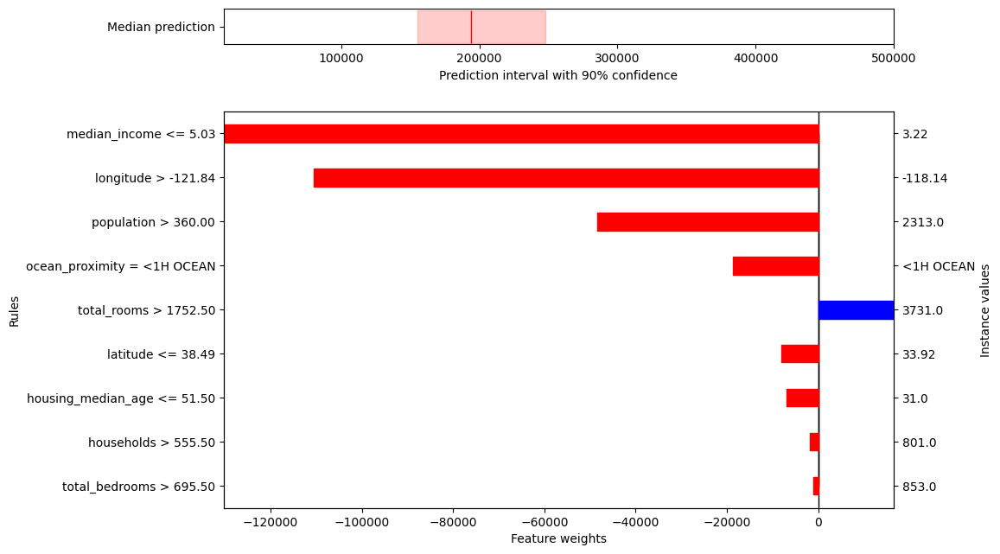

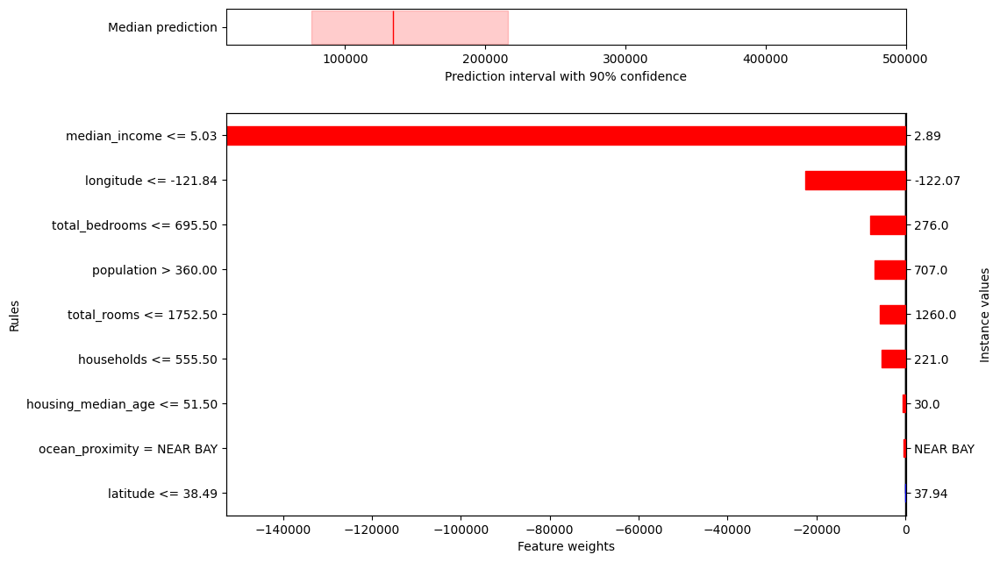

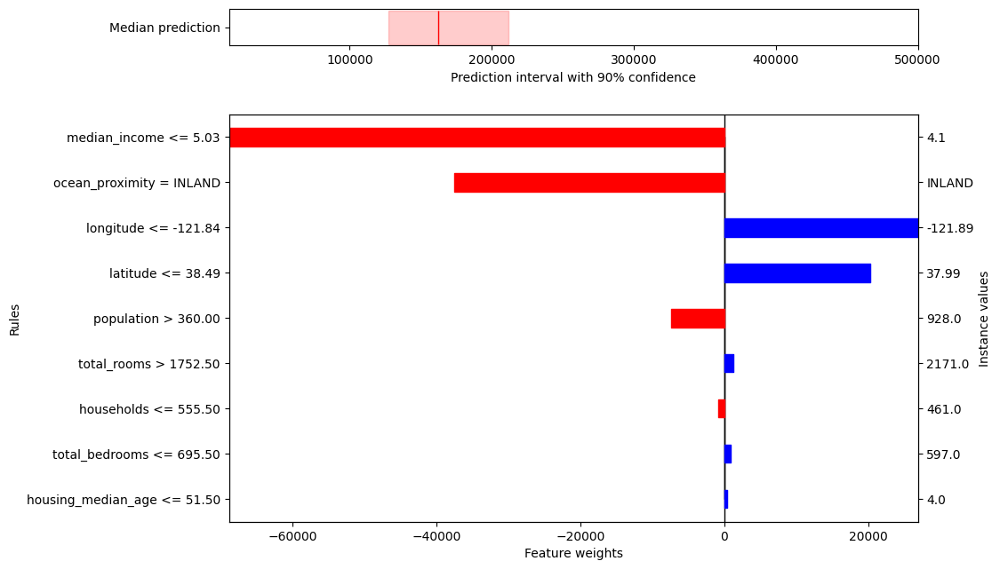

In [40]:
factual_explanation.remove_conjunctions()
factual_explanation.plot()

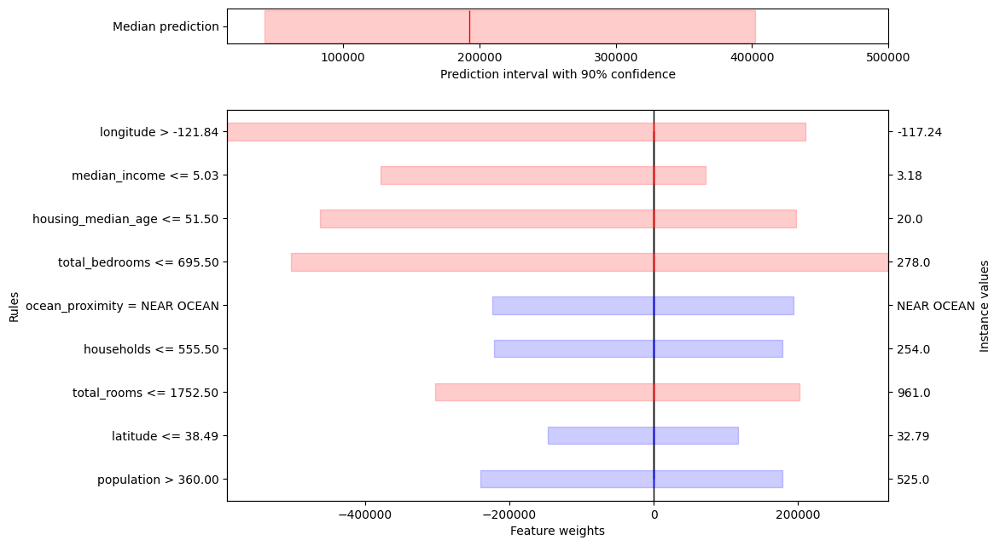

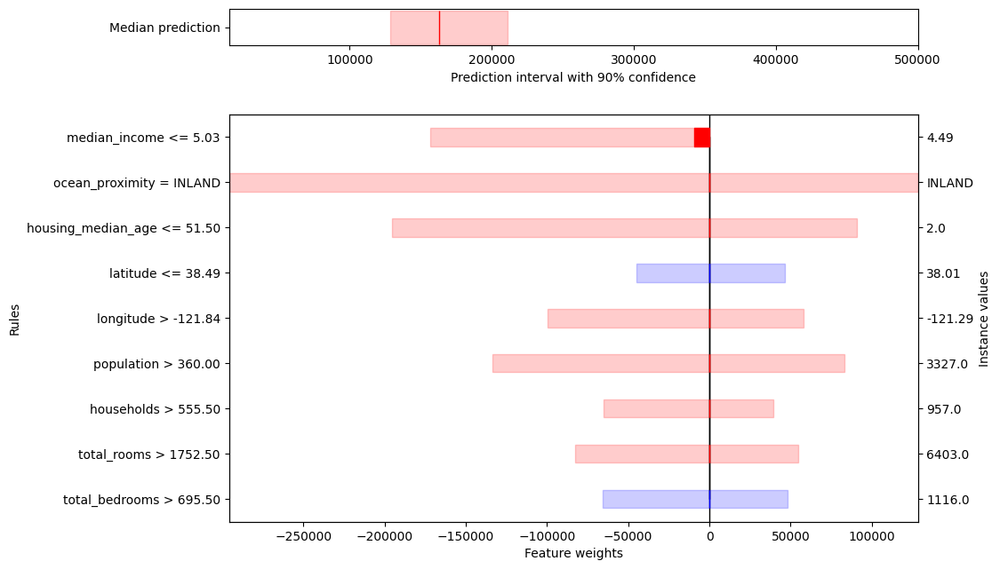

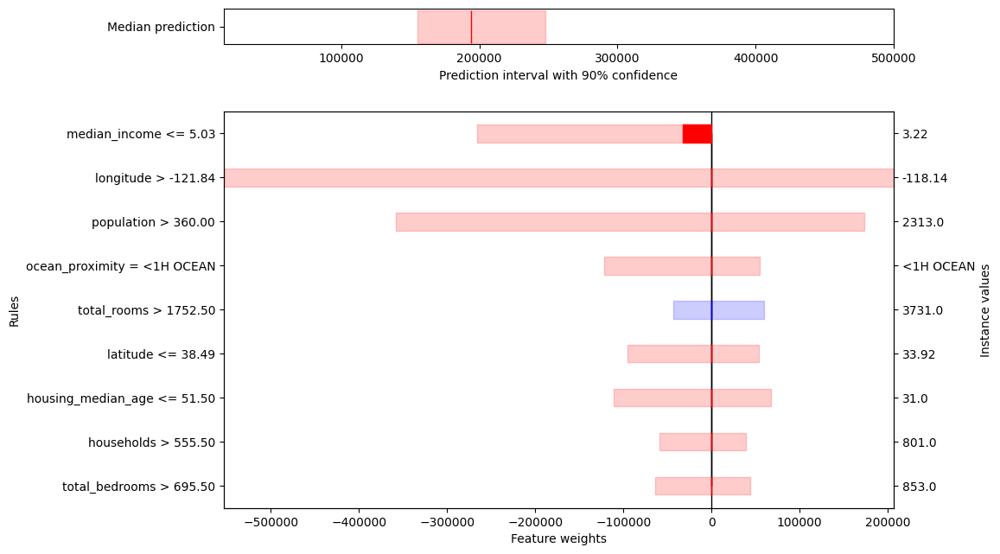

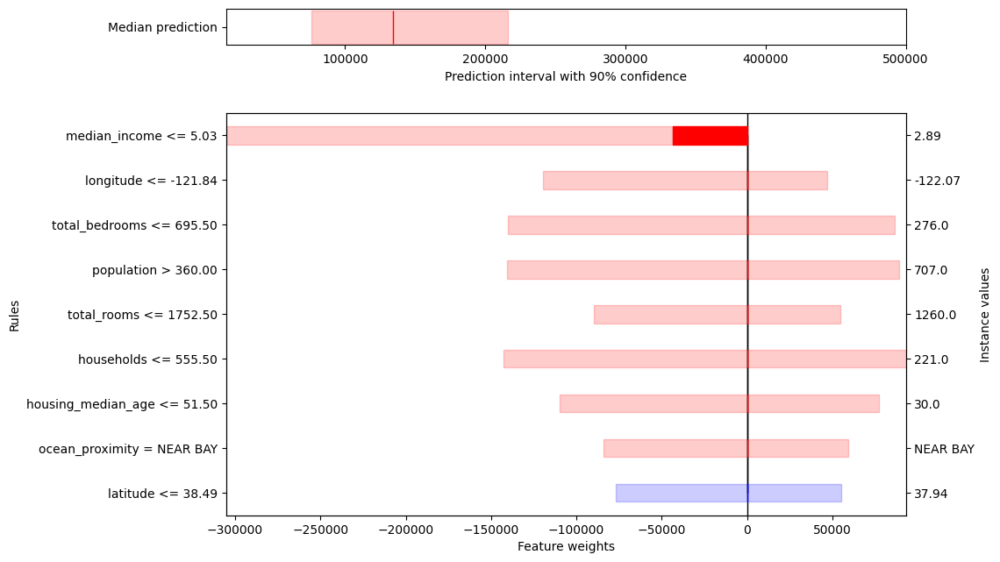

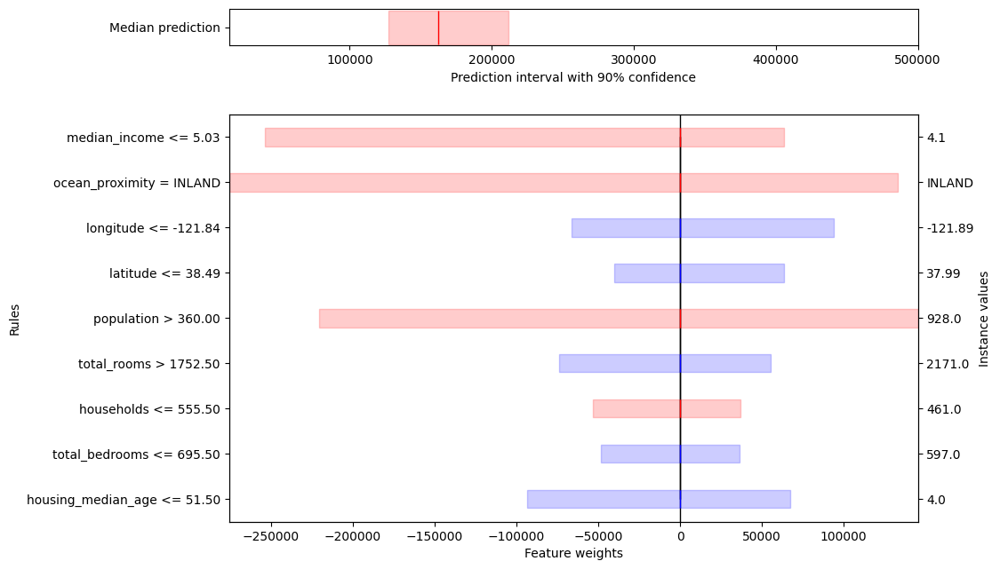

In [41]:
factual_explanation.plot(uncertainty=True)

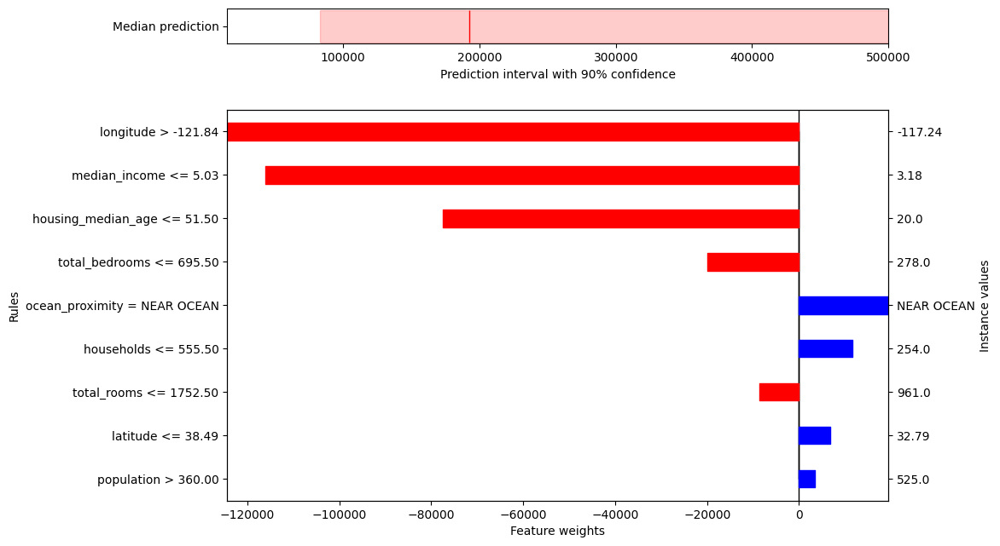

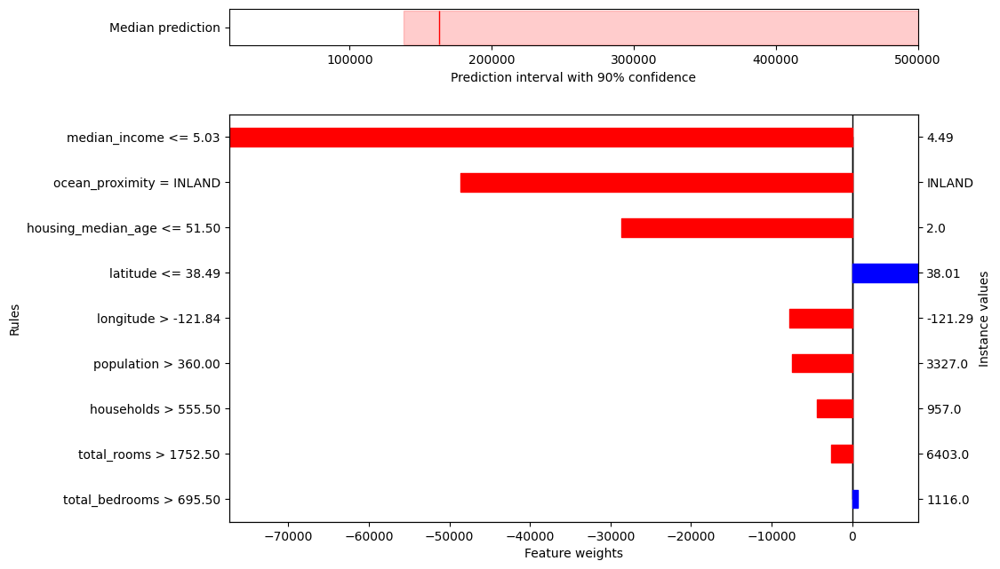

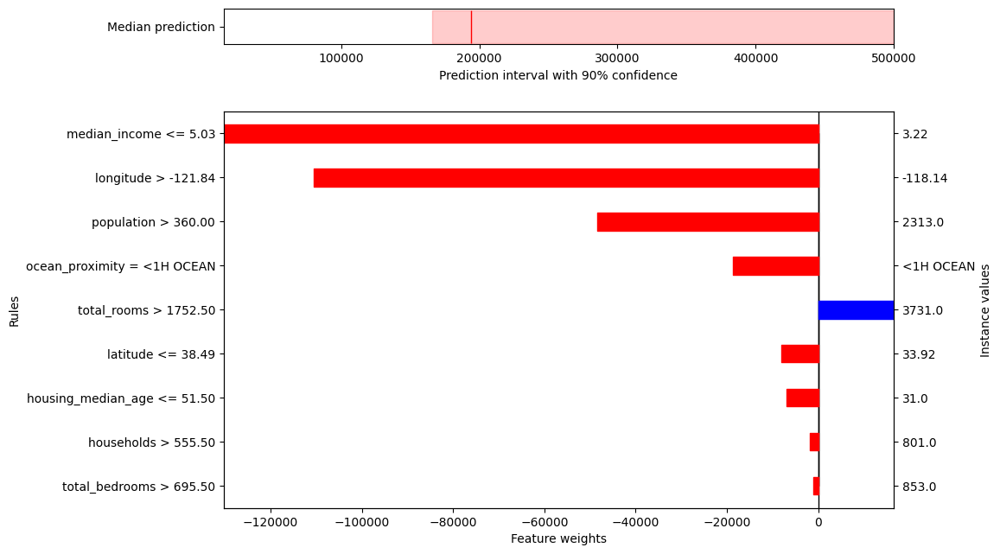

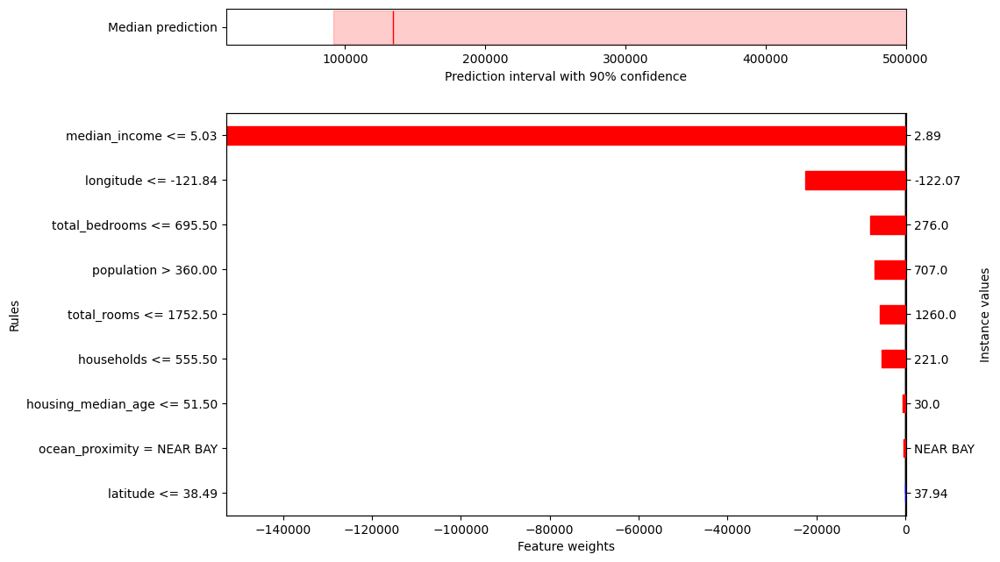

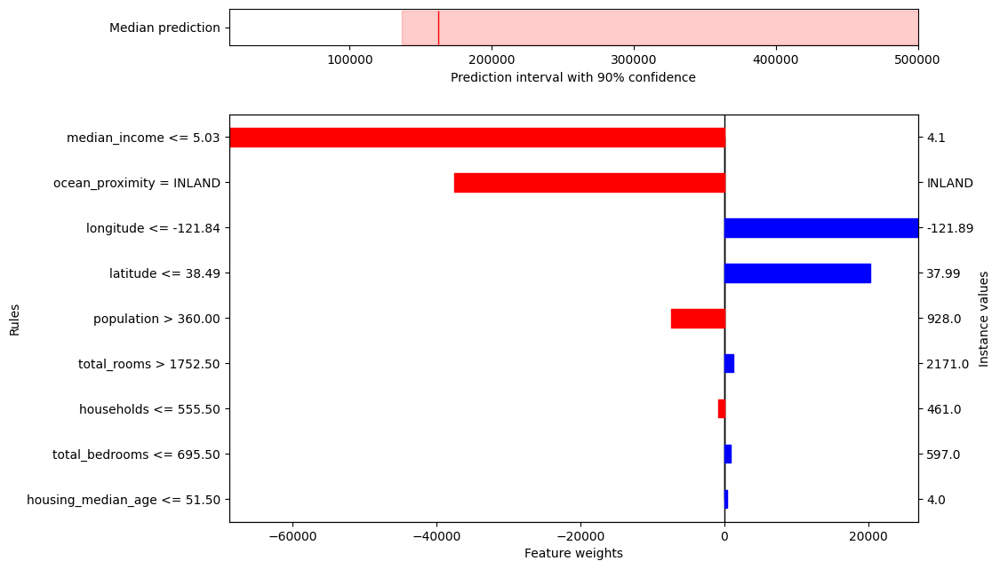

In [42]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osli)
factual_explanation.plot()

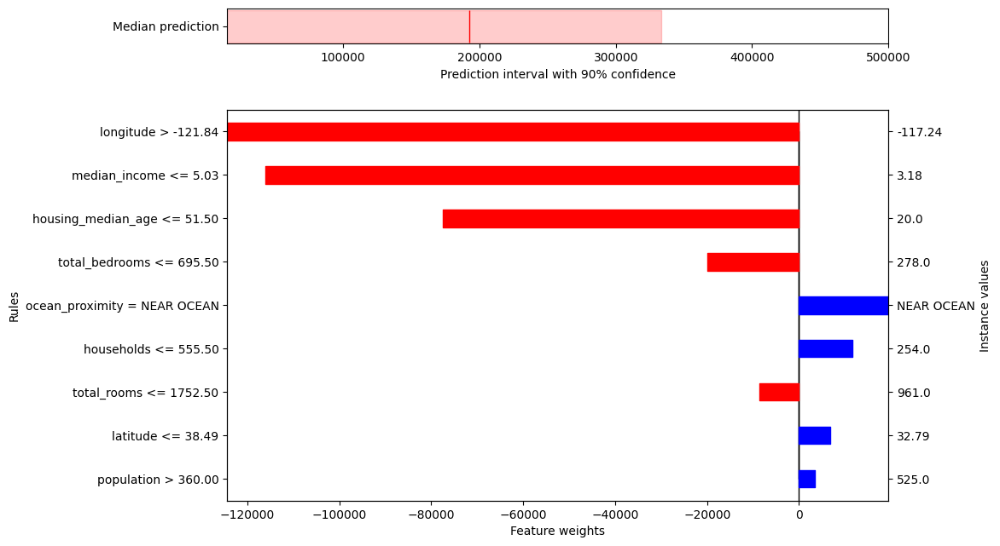

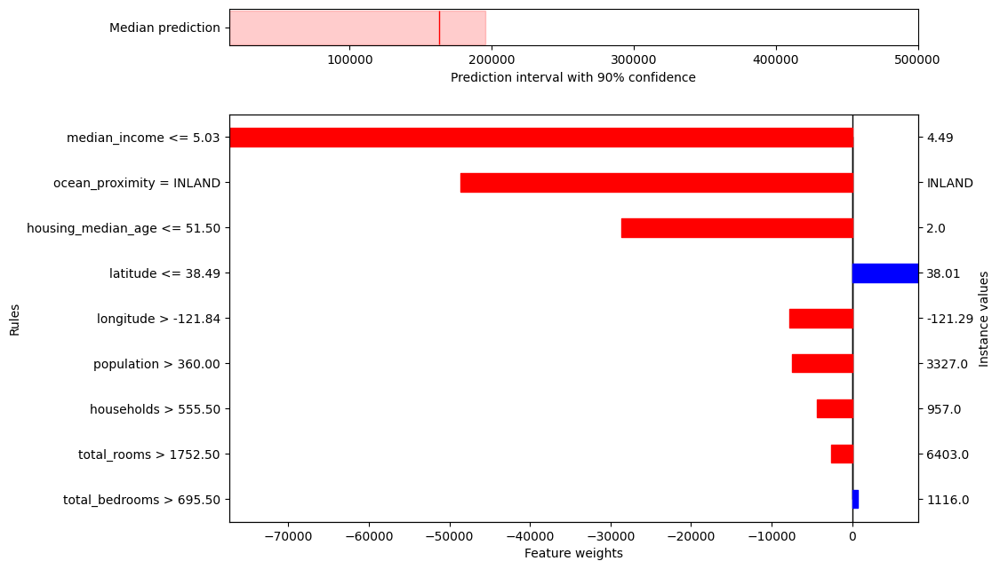

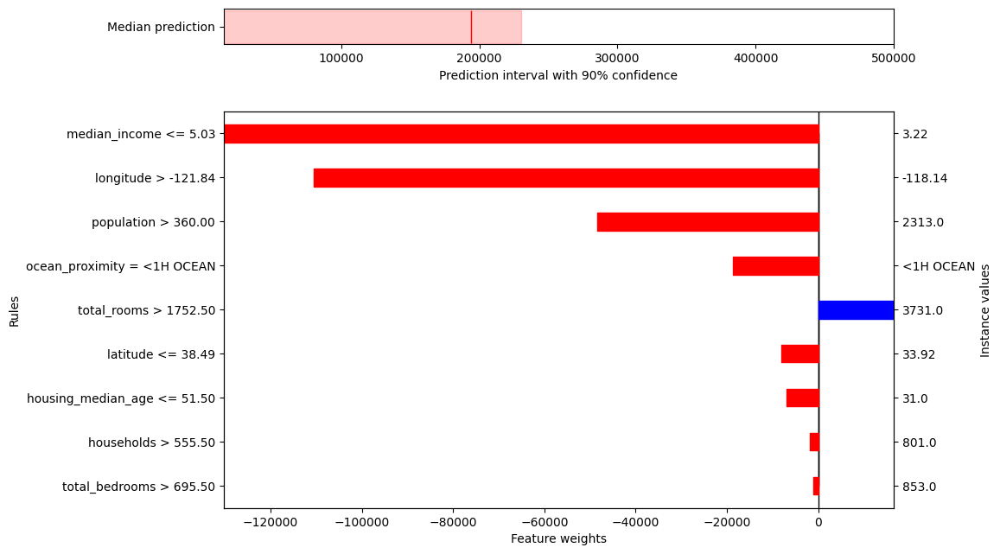

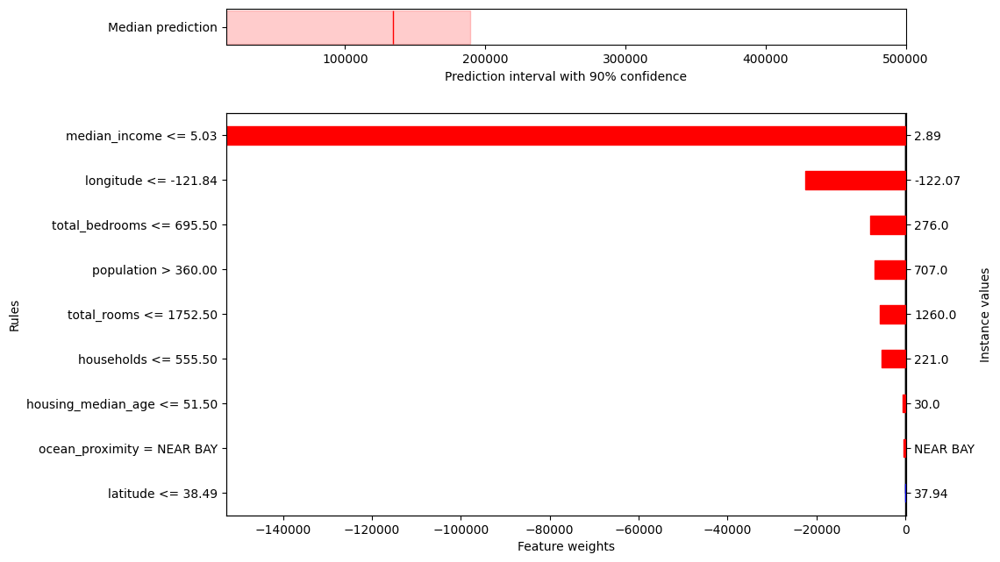

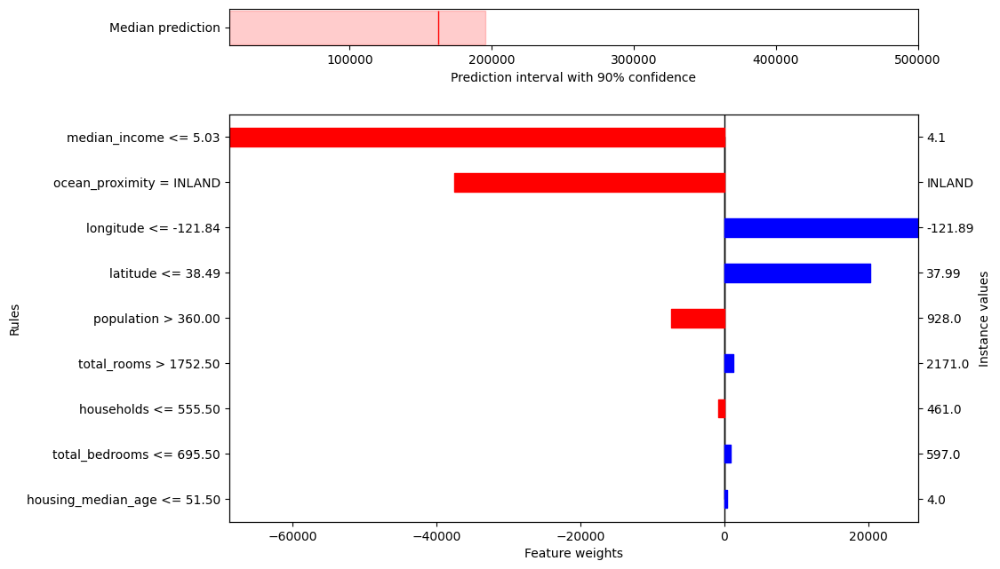

In [43]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osui)
factual_explanation.plot()

#### Normalized alternatives using variance

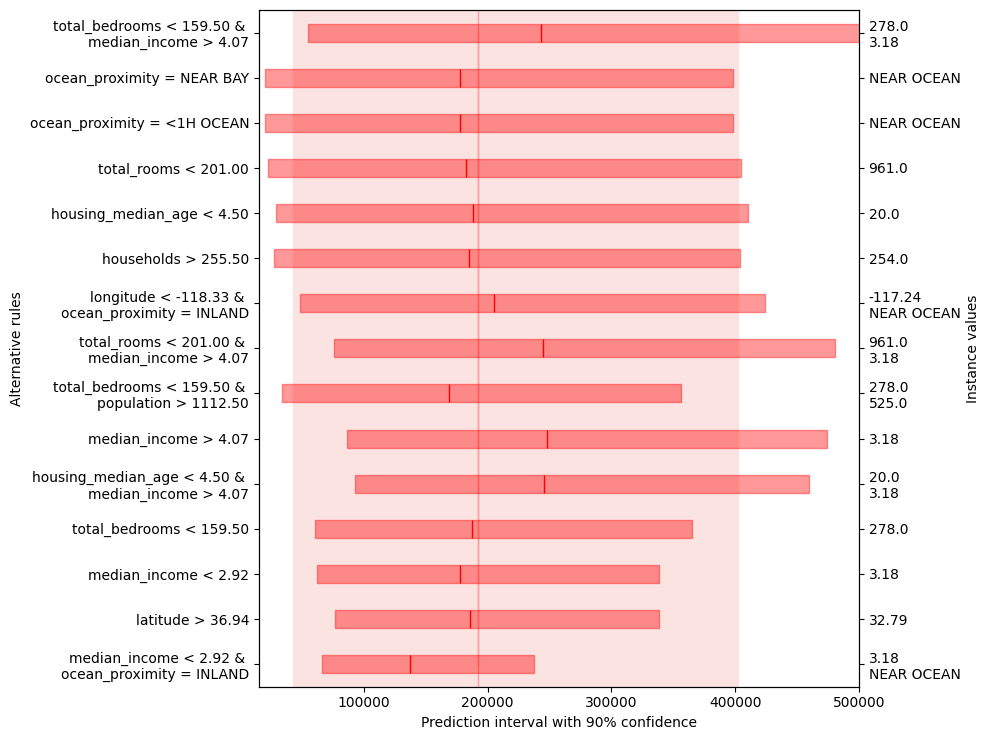

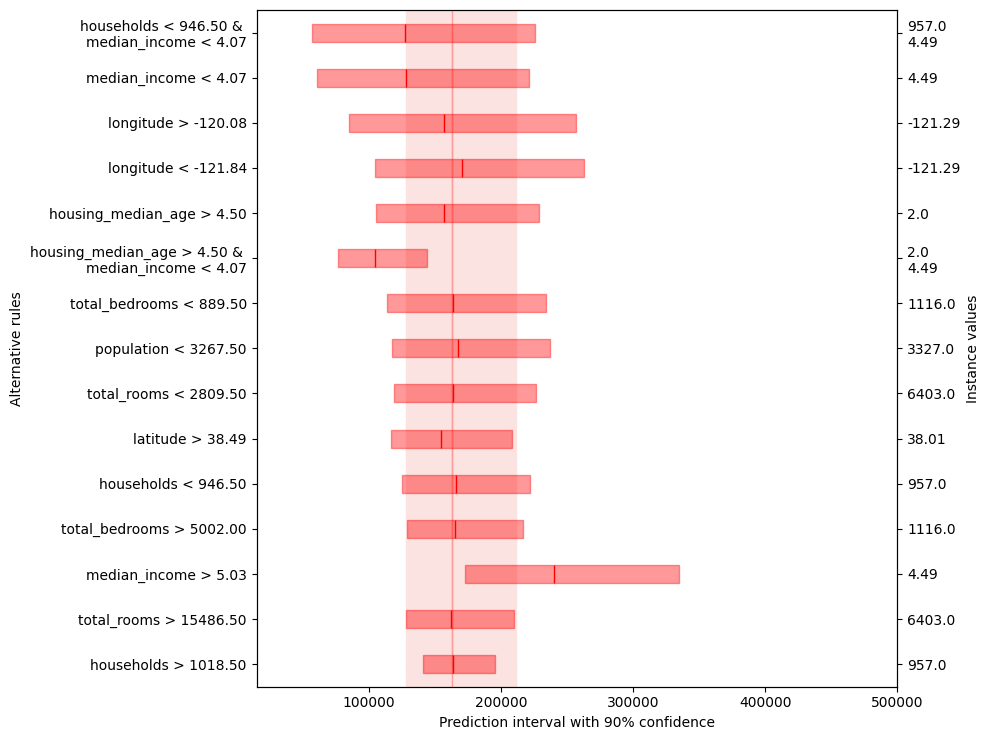

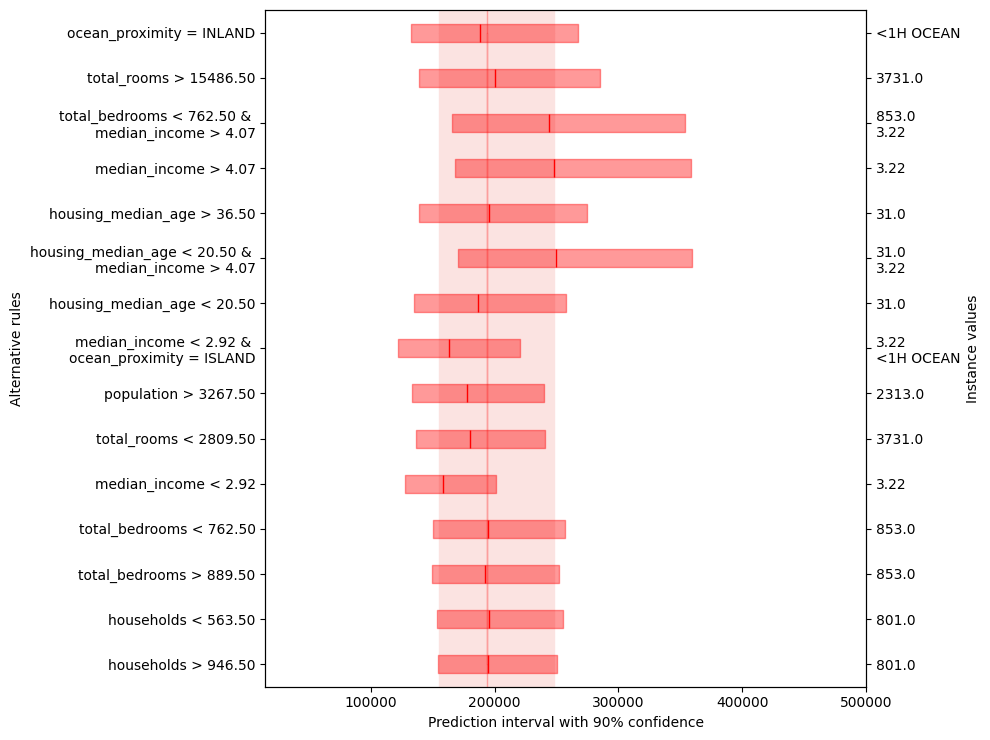

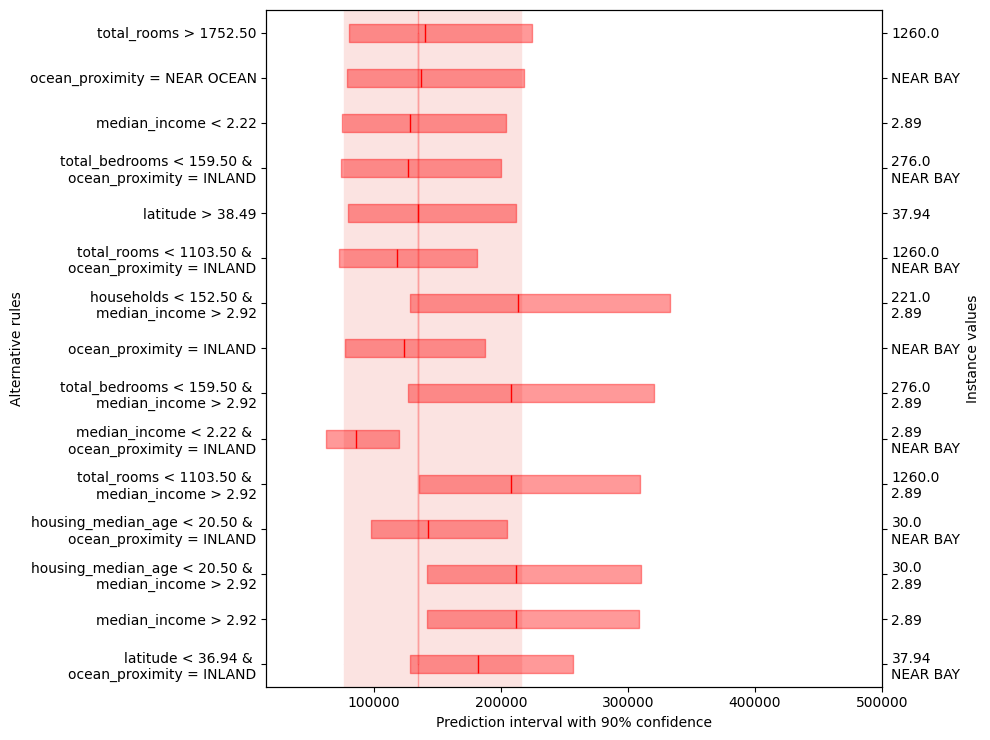

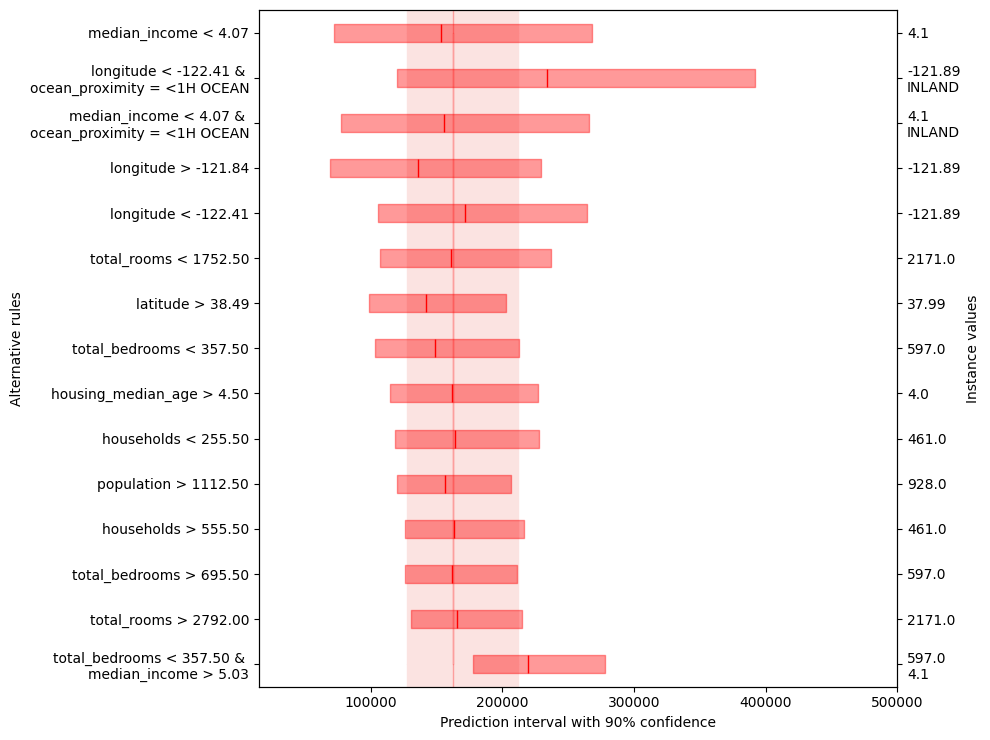

In [44]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=tsi)
alternative_explanation.add_conjunctions().plot(filter_top=15)


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 192429.123
Prediction Interval: [42183.964, 402253.621]

Alternatives to increase the Calibrated Prediction compared to 192429.123:
- If longitude < -118.33         then 315332.582 [-35977.509, 805953.808]
- If median_income > 4.07        then 248018.484 [86069.518, 474187.906]
- If housing_median_age > 20.50  then 243993.886 [7883.871, 573732.735]
- If total_bedrooms > 279.50     then 209852.047 [-121721.501, 672910.252]
- If latitude < 32.76            then 203066.775 [-149991.255, 696129.081]
- If total_rooms > 1099.00       then 200625.851 [2642.398, 477119.146]
- If households < 152.50         then 192655.359 [2114.213, 458755.119]

Alternatives to decrease the Calibrated Prediction compared to 192429.123:
- If ocean_proximity = INLAND    then 143858.183 [-86161.182, 465091.148]
- If population > 1112.50        then 167754.721 [-9

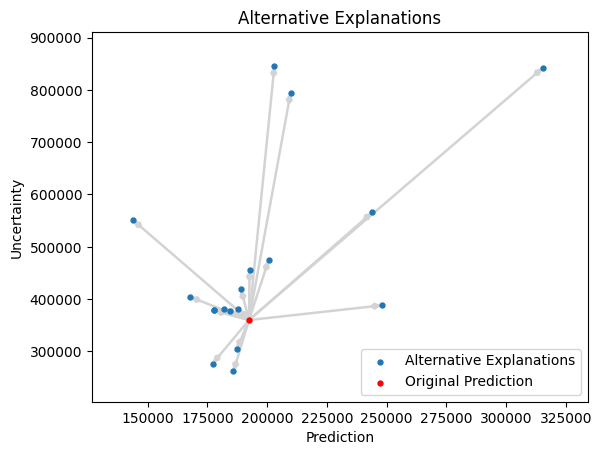


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 192429.123
Prediction Interval: [42183.964, 402253.621]

Alternatives to increase the Calibrated Prediction compared to 192429.123:
- If (latitude < 32.76 AND longitude < -118.33 AND median_income > 4.07)                                                        then 334207.585 [59530.331, 717807.414]
- If (longitude < -118.33 AND median_income > 4.07)                                                                             then 334193.866 [59469.413, 717859.610]
- If (latitude < 32.76 AND total_rooms < 201.00 AND longitude < -118.33 AND median_income > 4.07)                               then 331724.721 [61142.232, 709606.014]
- If (total_rooms < 201.00 AND longitude < -118.33 AND median_income > 4.07)                                                    then 331711.074 [61082.084, 709657.311]
- If (latitude < 32.76 AND population < 360

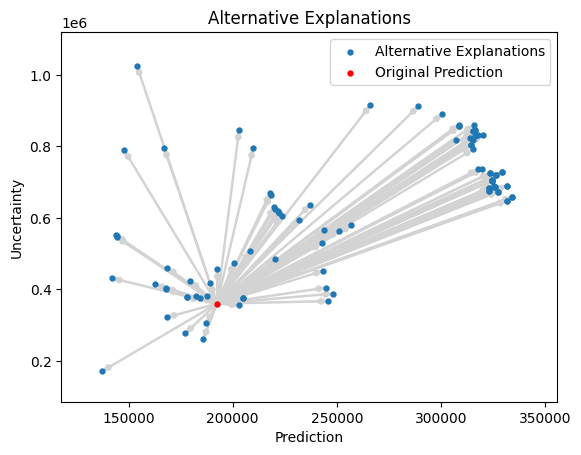

In [45]:
print(alternative_explanation[0].remove_conjunctions().to_narrative(expertise_level="advanced", output_format="text"))
alternative_explanation[0].plot(style="triangular")
print(alternative_explanation[0].add_conjunctions(max_rule_size=7).to_narrative(expertise_level="advanced", output_format="text"))
alternative_explanation[0].plot(style="triangular")


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 192429.123
Prediction Interval: [42183.964, 402253.621]

Alternatives to increase the Calibrated Prediction compared to 192429.123:
- If longitude < -118.33        then 315332.582 [-35977.509, 805953.808]
- If median_income > 4.07       then 248018.484 [86069.518, 474187.906]
- If housing_median_age > 20.50 then 243993.886 [7883.871, 573732.735]
- If total_bedrooms > 279.50    then 209852.047 [-121721.501, 672910.252]
- If latitude < 32.76           then 203066.775 [-149991.255, 696129.081]
- If total_rooms > 1099.00      then 200625.851 [2642.398, 477119.146]
- If households < 152.50        then 192655.359 [2114.213, 458755.119]

Alternatives to decrease the Calibrated Prediction compared to 192429.123:
- If population > 1112.50       then 167754.721 [-941.532, 403347.049]
- If median_income < 2.92       then 177211.178 [61651.662, 33

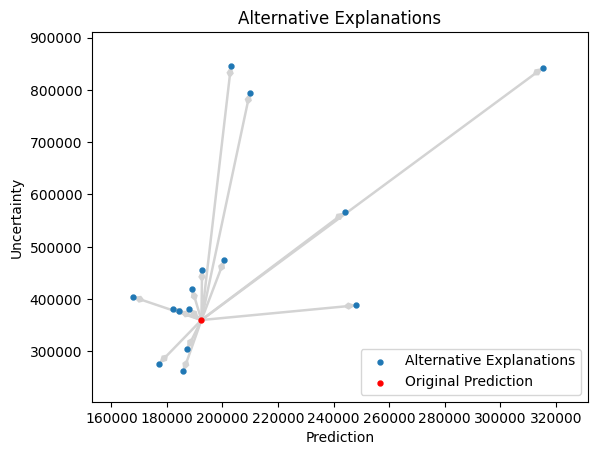


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 192429.123
Prediction Interval: [42183.964, 402253.621]

Alternatives to increase the Calibrated Prediction compared to 192429.123:
- If (latitude < 32.76 AND longitude < -118.33 AND median_income > 4.07)                                                        then 334207.585 [59530.331, 717807.414]
- If (longitude < -118.33 AND median_income > 4.07)                                                                             then 334193.866 [59469.413, 717859.610]
- If (latitude < 32.76 AND total_rooms < 201.00 AND longitude < -118.33 AND median_income > 4.07)                               then 331724.721 [61142.232, 709606.014]
- If (total_rooms < 201.00 AND longitude < -118.33 AND median_income > 4.07)                                                    then 331711.074 [61082.084, 709657.311]
- If (latitude < 32.76 AND population < 360

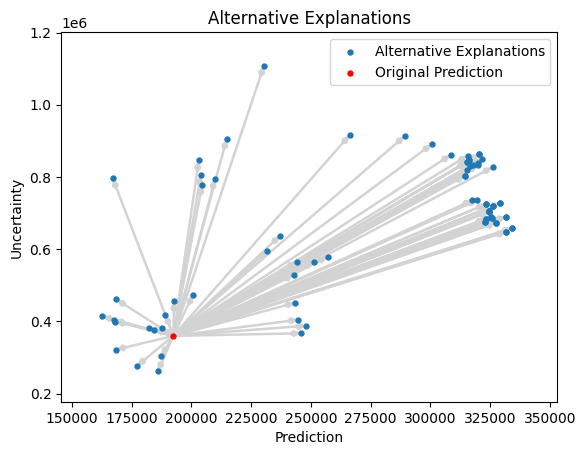

In [46]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=tsi, features_to_ignore=['ocean_proximity'])
print(alternative_explanation[0].to_narrative(expertise_level="advanced", output_format="text"))
alternative_explanation[0].plot(style="triangular")
print(alternative_explanation[0].add_conjunctions(max_rule_size=7).to_narrative(expertise_level="advanced", output_format="text"))
alternative_explanation[0].plot(style="triangular")


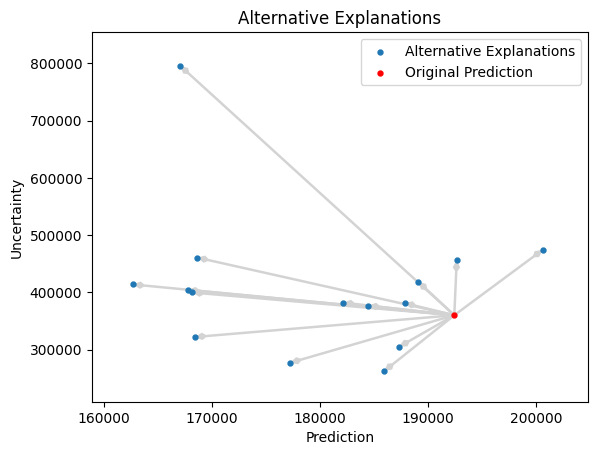

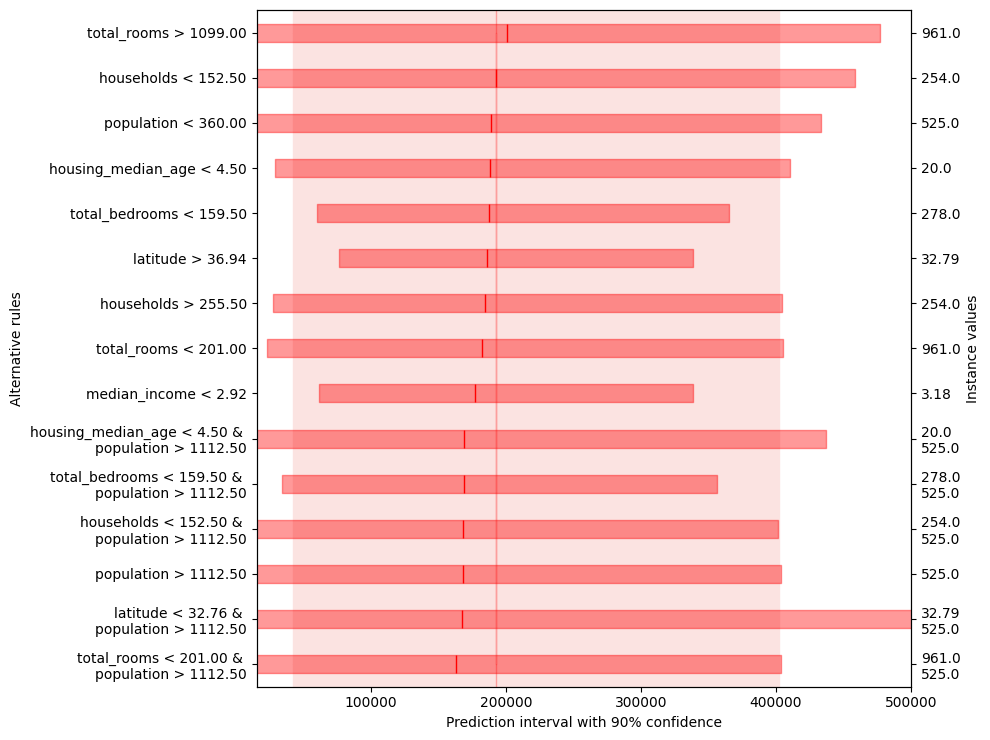

In [47]:
rnk_metric = 'ensured' # 'ensured', 'uncertainty', 'feature_weight'
rnk_weight = -1 # default=0.5. The weight of the uncertainty in the ranking. Used with the 'ensured' ranking metric. 
alternative_explanation[0].plot(style="triangular",filter_top=15, rnk_metric=rnk_metric,rnk_weight=rnk_weight)
alternative_explanation[0].plot(filter_top=15, rnk_metric=rnk_metric,rnk_weight=rnk_weight)

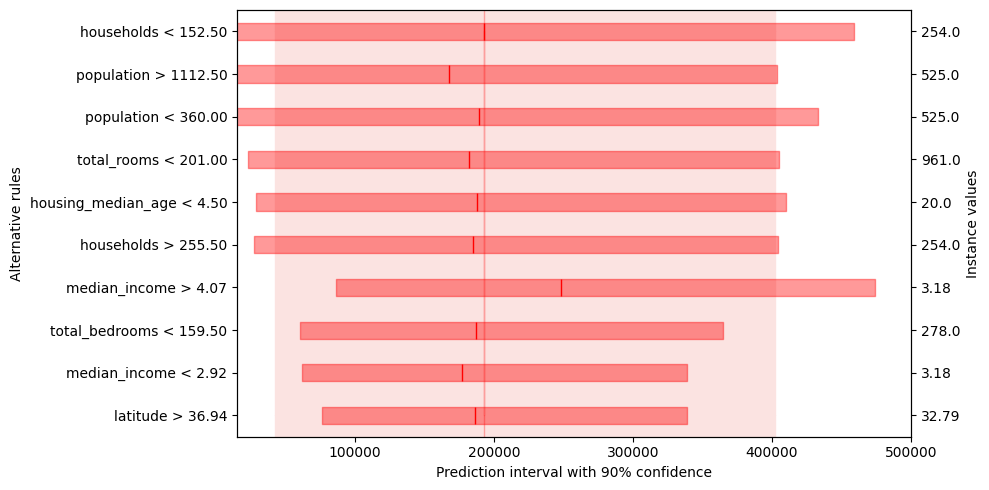

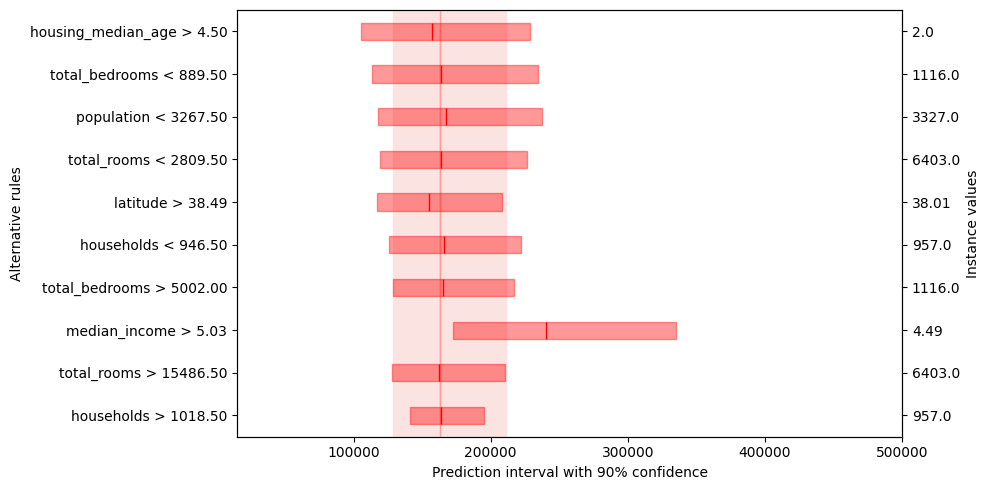

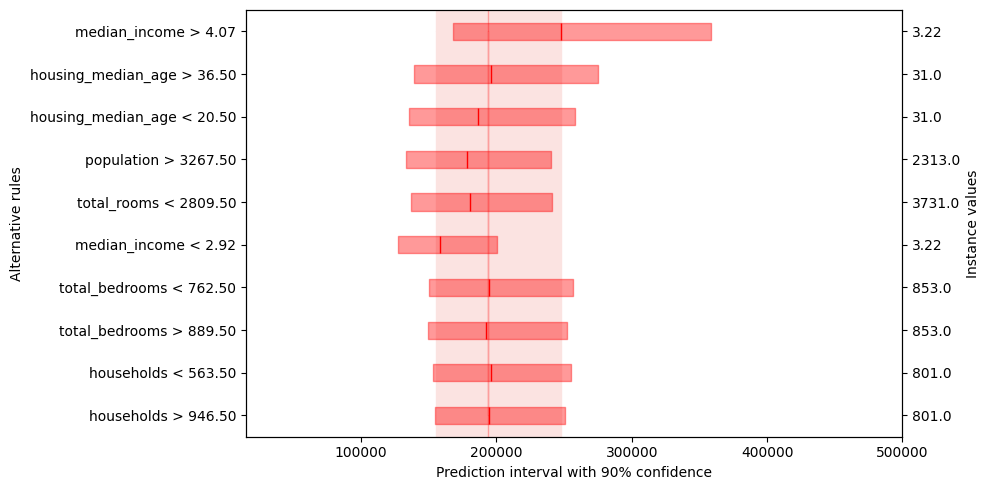

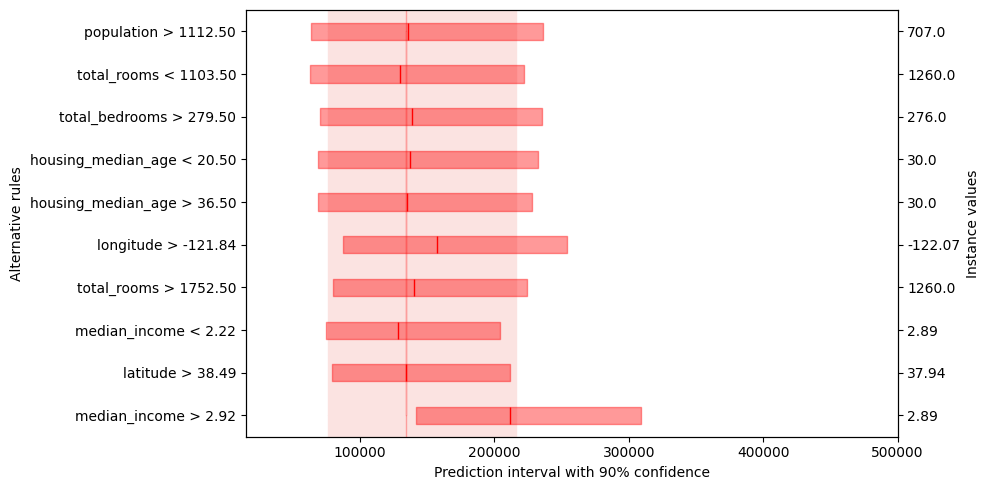

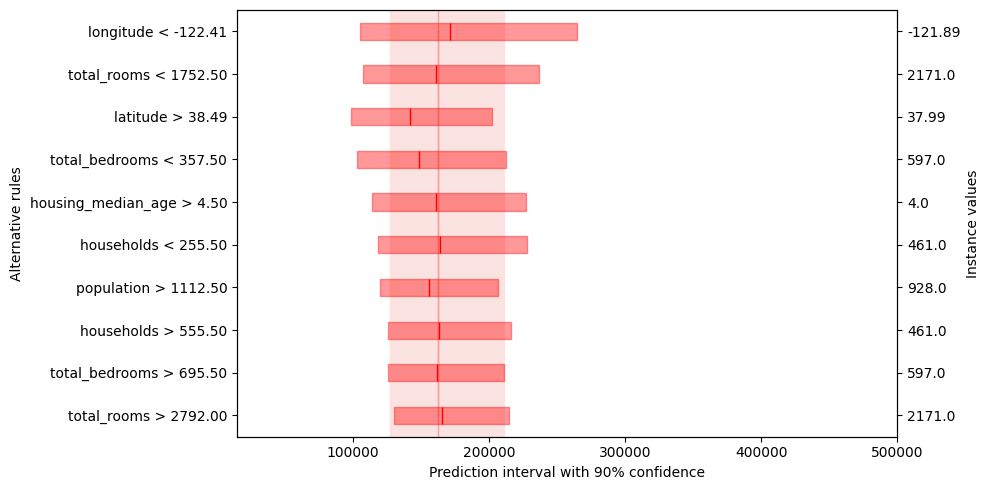

In [48]:
alternative_explanation.remove_conjunctions().plot()

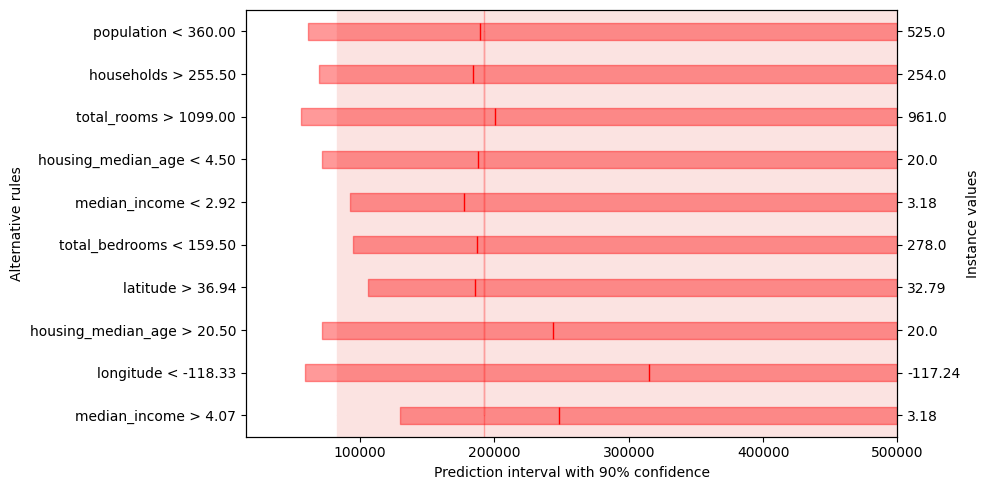

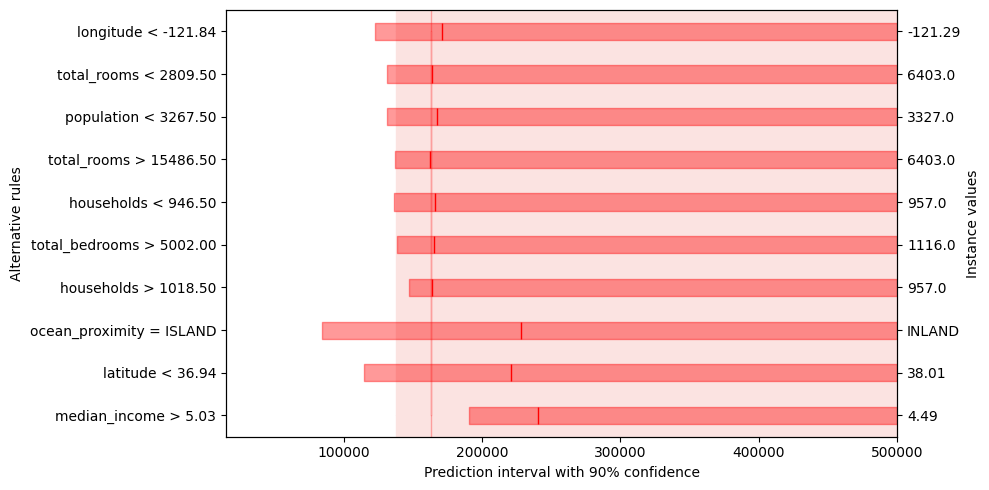

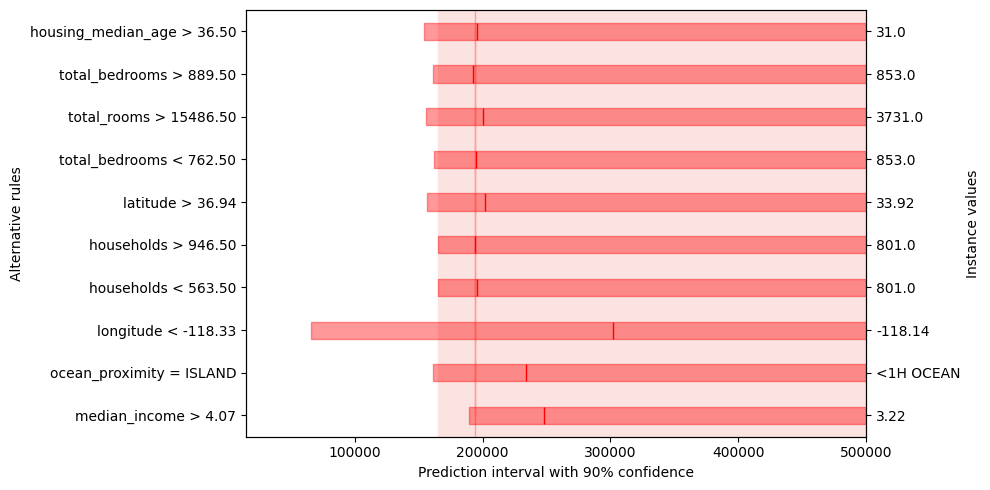

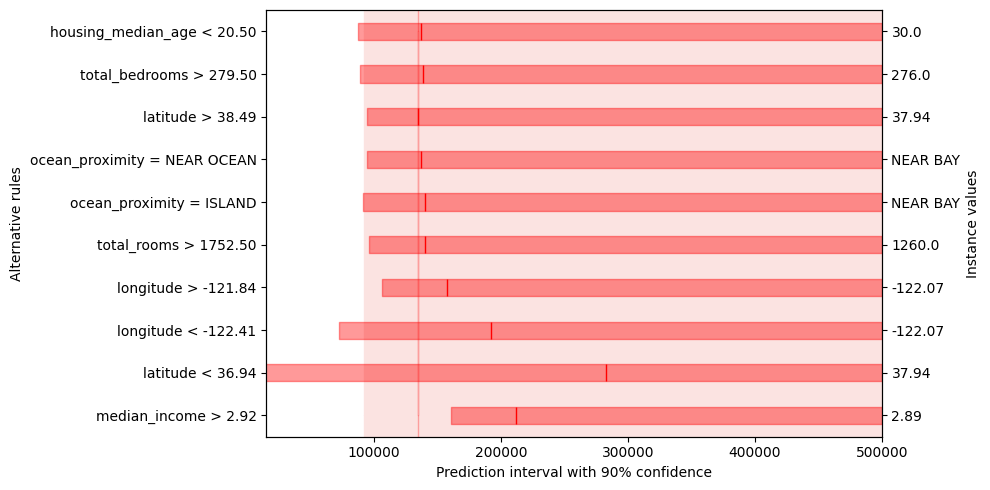

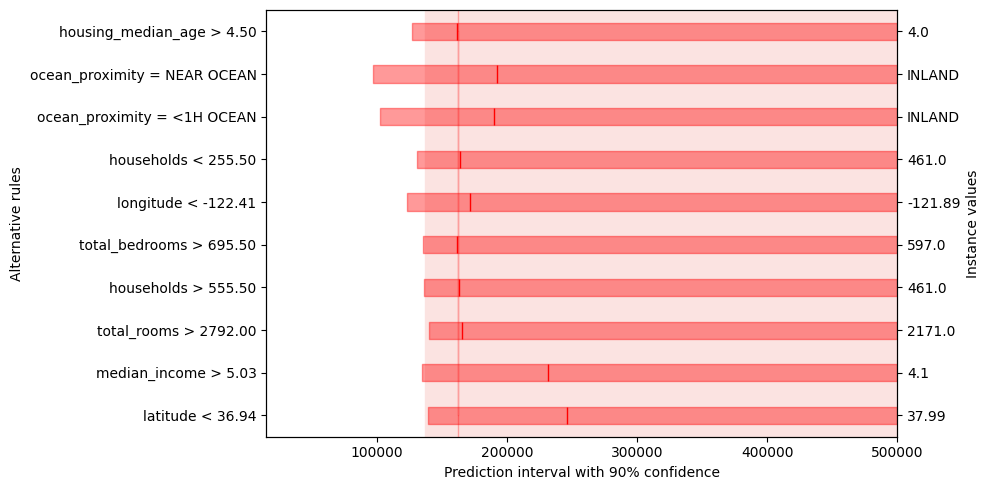

In [49]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osli)
alternative_explanation.plot()

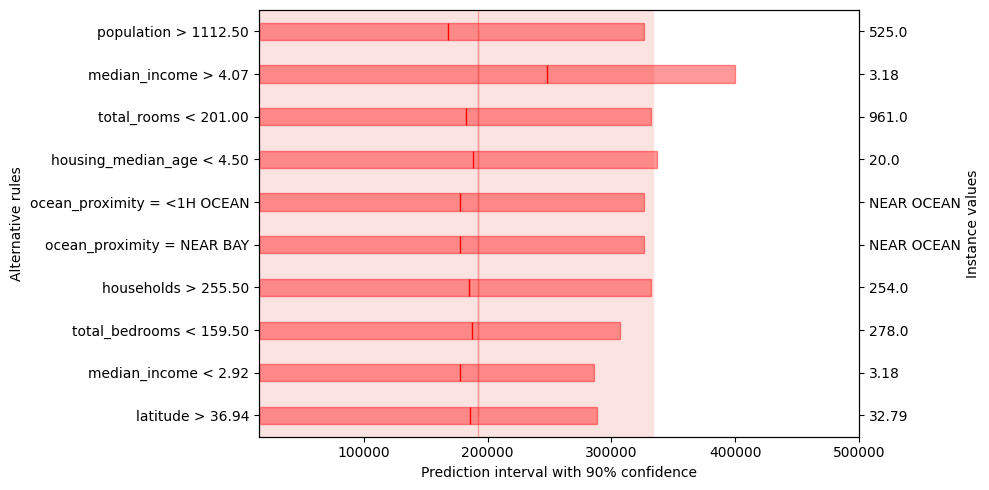

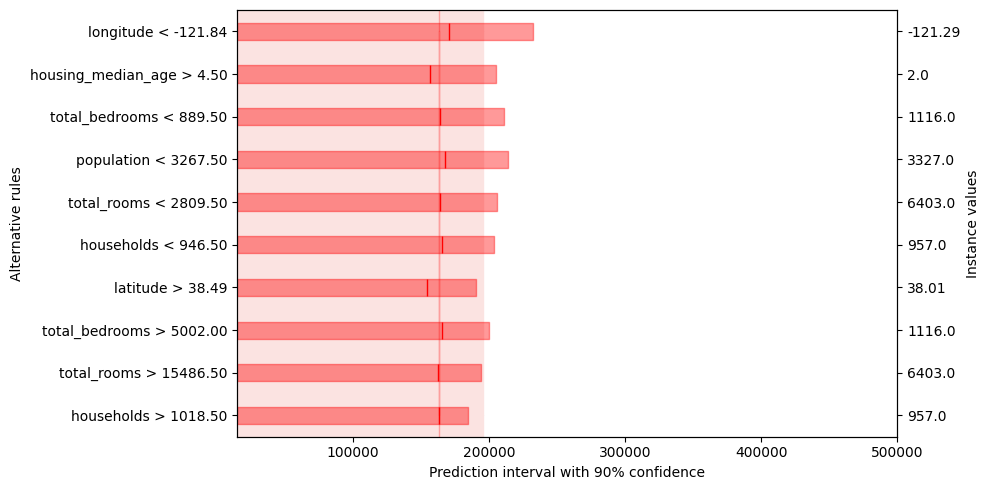

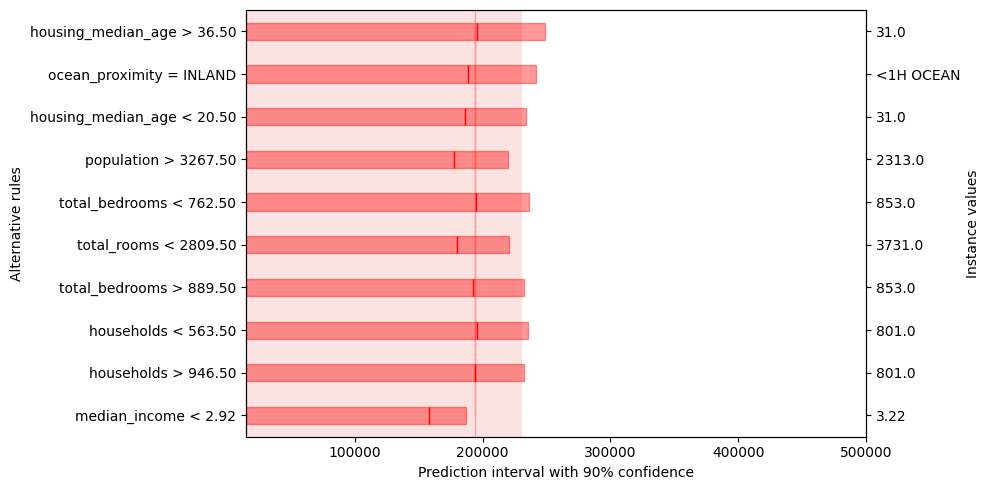

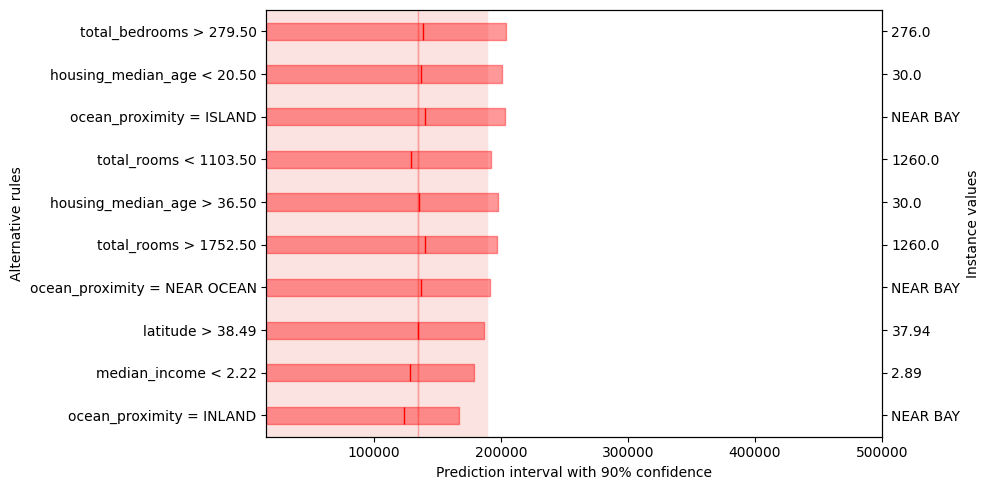

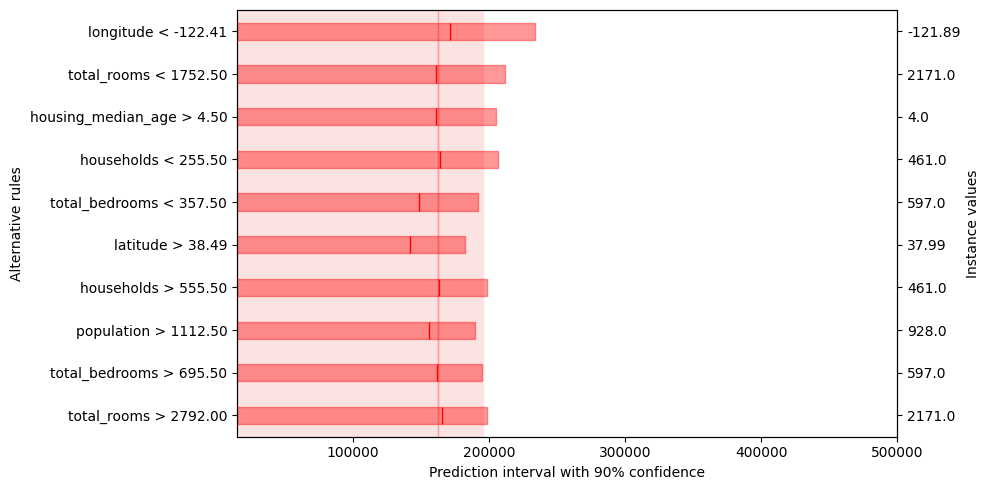

In [50]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osui)
alternative_explanation.plot()